In [230]:
import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import keras
import math
import scipy.stats

cwd = os.getcwd()

tf.random.set_seed(1234)

In [212]:
def data_generation():
    x = [1.5]
    for i in range (1500):
        if i < 25:
            x_new = 0
        else:
            x_new = x[i-25]
        n = 0.9 * x[i] + (0.2 * x_new / (1 + pow(x_new, 10)))
        #print('time is : ' +  str(i) + ', x(t) is : ' + str(x[i]))
        x.append(n)
    return x

#def save_data(x):
 #   with open('Assignment2_data.py', 'w') as f:
  #      f.write('data = %s' % x)
   #     f.close()
        
#def load_data():
 #   from Assignment2_data import data as x
  #  return x

def dataset_creation(data):
    X_train = []
    y_train = []
    X_valid = []
    y_valid = []
    X_test = []
    y_test = []
    
    for i in range (300, len(data)-5):
        x_20 = data[i - 20]
        x_15 = data[i - 15]
        x_10 = data[i - 10]
        x_5 = data[i - 5]
        x_0 = data[i]
        if i <= 1000:
            X_train.append([x_20, x_15, x_10, x_5, x_0])
            y_train.append(data[i+5])
        elif i <= 1300 and i > 1000:
            X_valid.append([x_20, x_15, x_10, x_5, x_0])
            y_valid.append(data[i+5])
        else:
            X_test.append([x_20, x_15, x_10, x_5, x_0])
            y_test.append(data[i+5])
    return X_train, y_train, X_valid, y_valid, X_test, y_test

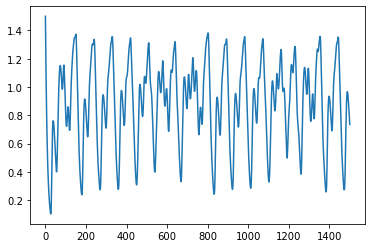

1501

In [88]:
# Add noise

#noise1 = np.random.normal(0,0.05,1000)
#noise2 = np.random.normal(0,0.3,1000)

data = data_generation()

#data_noise = data + noise1
plt.plot(data)
plt.show()

len(data)

In [213]:
def create_model(nh1, nh2, learning_rate):
    
    model = keras.models.Sequential()

    # Add first layer
    model.add(
        keras.layers.Dense(
        units = nh1,
        input_shape = (5,),
        kernel_initializer = 'normal',
        #bias_initializer = 'zeros',
        activation = 'sigmoid'))
    
    #Add second layer
    model.add(
    keras.layers.Dense(
        units = nh2,
        kernel_initializer = 'normal',
        #bias_initializer = 'zeros',
        activation = 'sigmoid')
    )
    
    # add output layer
    model.add(
    keras.layers.Dense(
        units = 1,
        kernel_initializer = 'normal',
        #bias_initializer = 'zeros',
        activation = 'linear')
    )

    model.summary()
    sgd = keras.optimizers.SGD(lr=learning_rate)
    model.compile(optimizer=sgd, loss='mse')
    
    return model

In [39]:
#Let's define which hyperparameters to tune
nh1 = [2, 4]
nh2 = [2, 5, 15]
lr = [0.1, 0.01, 0.001]

#model = create_model(2, 2, 0.1)

In [214]:
X_train, y_train, X_valid, y_valid, X_test, y_test = dataset_creation(data)

print(len(X_train))
print(len(y_train))
print(len(X_valid))
print(len(y_valid))
print(len(X_test))
print(len(y_test))

701
701
300
300
195
195


In [61]:
callbacks = []
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, min_delta=0.000001, patience=20, restore_best_weights=True)
callbacks.append(early_stop)

histories = []
losses = []

best_loss = float('inf')
worst_loss = 0


for i in nh1:
    for y in nh2:
        for z in lr:
            model = create_model (i, y, z)
            history = model.fit(
                X_train, 
                y_train, 
                #batch_size = 32, 
                epochs = 5000, 
                verbose = 1, 
                callbacks = callbacks, 
                validation_data = (X_valid, y_valid)
            )
            metrics = model.evaluate(
                x=X_valid,
                y=y_valid,
                verbose=1,
                callbacks=None,
            )
            if metrics < best_loss:
                best_loss = metrics
                best_history = history
                best_model = model
            if metrics > worst_loss:
                worst_loss = metrics
                worst_history = history
                worst_model = model
            histories.append(history)
            losses.append(metrics)

Model: "sequential_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_136 (Dense)            (None, 2)                 12        
_________________________________________________________________
dense_137 (Dense)            (None, 2)                 6         
_________________________________________________________________
dense_138 (Dense)            (None, 1)                 3         
Total params: 21
Trainable params: 21
Non-trainable params: 0
_________________________________________________________________
Epoch 1/5000
22/22 [==============================] - 0s 11ms/step - loss: 0.1589 - val_loss: 0.0703
Epoch 2/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 3/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 4/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val

Epoch 9/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.3320 - val_loss: 0.2901
Epoch 10/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.3006 - val_loss: 0.2617
Epoch 11/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.2731 - val_loss: 0.2369
Epoch 12/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.2491 - val_loss: 0.2152
Epoch 13/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.2281 - val_loss: 0.1963
Epoch 14/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.2097 - val_loss: 0.1798
Epoch 15/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.1936 - val_loss: 0.1654
Epoch 16/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.1796 - val_loss: 0.1529
Epoch 17/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.1673 - val_loss: 0.1420
Epoch 18/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.1566 - val_loss

Epoch 1/5000
22/22 [==============================] - 1s 31ms/step - loss: 0.1362 - val_loss: 0.0703
Epoch 2/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.0703
Epoch 3/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.0703
Epoch 4/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.0703
Epoch 5/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.0703
Epoch 6/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.0703
Epoch 7/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.0703
Epoch 8/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.0703
Epoch 9/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.0703
Epoch 10/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.070

22/22 [==============================] - 0s 2ms/step - loss: 0.1124 - val_loss: 0.0930
Epoch 19/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.1070 - val_loss: 0.0885
Epoch 20/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.1025 - val_loss: 0.0849
Epoch 21/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0989 - val_loss: 0.0819
Epoch 22/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0959 - val_loss: 0.0795
Epoch 23/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0935 - val_loss: 0.0776
Epoch 24/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0915 - val_loss: 0.0761
Epoch 25/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0898 - val_loss: 0.0748
Epoch 26/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0885 - val_loss: 0.0738
Epoch 27/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0874 - val_loss: 0.0730
Epoc

Epoch 27/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0836 - val_loss: 0.0702
Epoch 28/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 29/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 30/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 31/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 32/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 33/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 34/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 35/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 36/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_los

22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 109/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 110/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 111/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 112/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 113/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 114/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 115/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 116/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 117/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 189/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 190/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 191/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 192/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 193/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 194/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 195/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 196/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 197/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0821 - val_loss: 0.0689
Epoch 269/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0820 - val_loss: 0.0688
Epoch 270/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0820 - val_loss: 0.0688
Epoch 271/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0819 - val_loss: 0.0688
Epoch 272/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0819 - val_loss: 0.0687
Epoch 273/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0818 - val_loss: 0.0687
Epoch 274/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0818 - val_loss: 0.0686
Epoch 275/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0817 - val_loss: 0.0686
Epoch 276/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0817 - val_loss: 0.0685
Epoch 277/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0816 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0476 - val_loss: 0.0384
Epoch 349/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0462 - val_loss: 0.0373
Epoch 350/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0448 - val_loss: 0.0361
Epoch 351/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0434 - val_loss: 0.0350
Epoch 352/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0420 - val_loss: 0.0339
Epoch 353/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0406 - val_loss: 0.0329
Epoch 354/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0393 - val_loss: 0.0319
Epoch 355/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0380 - val_loss: 0.0309
Epoch 356/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0368 - val_loss: 0.0300
Epoch 357/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0357 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.0197
Epoch 429/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.0196
Epoch 430/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0205 - val_loss: 0.0196
Epoch 431/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0205 - val_loss: 0.0195
Epoch 432/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0195
Epoch 433/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0194
Epoch 434/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0194
Epoch 435/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0194
Epoch 436/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0193
Epoch 437/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0165
Epoch 509/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0165
Epoch 510/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0164
Epoch 511/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0164
Epoch 512/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0164
Epoch 513/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0163
Epoch 514/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0163
Epoch 515/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0163
Epoch 516/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0162
Epoch 517/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0140
Epoch 589/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0140
Epoch 590/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0140
Epoch 591/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0139
Epoch 592/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0139
Epoch 593/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0139
Epoch 594/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0139
Epoch 595/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0138
Epoch 596/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0138
Epoch 597/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0120
Epoch 669/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0120
Epoch 670/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0120
Epoch 671/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0120
Epoch 672/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0119
Epoch 673/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0119
Epoch 674/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0119
Epoch 675/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0119
Epoch 676/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0119
Epoch 677/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 749/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0103 - val_loss: 0.0103
Epoch 750/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0103
Epoch 751/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0103
Epoch 752/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0103
Epoch 753/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0102
Epoch 754/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0102
Epoch 755/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0102
Epoch 756/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0102
Epoch 757/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0088
Epoch 829/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0088
Epoch 830/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0090 - val_loss: 0.0087
Epoch 831/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0087
Epoch 832/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0087
Epoch 833/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0087
Epoch 834/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0087
Epoch 835/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0086
Epoch 836/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0086
Epoch 837/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0088 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0074
Epoch 909/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0074
Epoch 910/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0074
Epoch 911/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0073
Epoch 912/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0073
Epoch 913/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0073
Epoch 914/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0076 - val_loss: 0.0073
Epoch 915/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0076 - val_loss: 0.0073
Epoch 916/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0076 - val_loss: 0.0073
Epoch 917/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0076 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0064
Epoch 989/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0064
Epoch 990/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0064
Epoch 991/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0063
Epoch 992/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0063
Epoch 993/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0063
Epoch 994/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0063
Epoch 995/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0063
Epoch 996/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0063
Epoch 997/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.

Epoch 1068/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0057
Epoch 1069/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0057
Epoch 1070/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0057
Epoch 1071/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0057
Epoch 1072/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0057
Epoch 1073/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0057
Epoch 1074/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0057
Epoch 1075/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0057
Epoch 1076/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0061 - val_loss: 0.0057
Epoch 1077/5000
22/22 [==============================] - 0s 2ms/step - lo

22/22 [==============================] - 0s 2ms/step - loss: 0.0058 - val_loss: 0.0053
Epoch 1148/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0058 - val_loss: 0.0053
Epoch 1149/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0057 - val_loss: 0.0053
Epoch 1150/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0057 - val_loss: 0.0053
Epoch 1151/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0057 - val_loss: 0.0052
Epoch 1152/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0057 - val_loss: 0.0052
Epoch 1153/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0057 - val_loss: 0.0052
Epoch 1154/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0057 - val_loss: 0.0052
Epoch 1155/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0057 - val_loss: 0.0052
Epoch 1156/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0057 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1227/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1228/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1229/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1230/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1231/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1232/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1233/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1234/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1235/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0053 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0046
Epoch 1306/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0046
Epoch 1307/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 1308/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 1309/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 1310/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 1311/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 1312/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 1313/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 1314/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1385/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1386/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1387/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1388/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1389/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1390/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1391/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1392/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1393/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0040
Epoch 1464/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0040
Epoch 1465/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0040
Epoch 1466/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0040
Epoch 1467/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0040
Epoch 1468/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0040
Epoch 1469/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1470/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1471/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1472/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1543/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1544/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1545/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1546/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1547/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1548/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1549/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1550/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1551/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1622/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1623/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1624/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1625/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1626/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1627/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1628/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1629/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1630/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1701/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1702/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1703/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1704/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1705/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1706/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1707/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1708/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1709/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 1780/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 1781/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 1782/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 1783/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 1784/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 1785/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 1786/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 1787/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 1788/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1859/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1860/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1861/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1862/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1863/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1864/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1865/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1866/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1867/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 1938/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 1939/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 1940/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 1941/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 1942/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 1943/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 1944/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 1945/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 1946/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2017/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2018/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2019/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2020/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2021/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2022/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2023/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2024/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2025/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2096/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2097/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2098/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2099/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2100/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2101/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2102/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2103/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2104/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2175/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2176/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2177/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2178/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2179/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2180/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2181/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2182/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2183/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2254/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2255/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2256/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2257/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2258/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2259/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2260/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2261/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2262/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2333/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2334/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2335/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2336/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2337/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2338/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2339/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2340/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2341/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2412/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2413/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2414/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2415/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2416/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2417/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2418/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2419/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2420/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2491/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2492/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2493/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2494/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2495/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2496/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2497/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2498/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2499/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2570/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2571/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2572/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2573/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2574/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2575/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2576/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2577/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2578/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2649/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2650/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2651/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2652/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2653/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2654/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2655/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2656/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2657/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2728/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2729/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2730/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2731/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2732/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2733/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2734/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2735/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2736/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2807/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2808/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2809/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2810/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2811/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2812/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2813/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2814/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2815/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2886/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2887/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2888/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2889/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2890/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2891/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2892/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2893/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2894/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2965/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2966/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2967/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2968/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2969/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2970/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2971/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2972/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2973/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3044/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3045/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3046/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3047/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3048/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3049/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3050/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3051/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3052/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3123/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3124/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3125/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3126/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3127/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3128/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3129/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3130/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3131/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3202/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3203/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3204/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3205/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3206/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3207/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3208/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3209/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3210/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3281/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3282/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3283/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3284/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3285/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3286/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3287/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3288/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3289/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3360/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3361/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3362/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3363/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3364/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3365/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3366/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3367/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3368/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3439/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3440/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3441/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3442/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3443/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3444/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3445/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3446/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3447/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3518/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3519/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3520/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3521/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3522/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3523/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3524/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3525/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3526/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3597/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3598/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3599/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3600/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3601/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3602/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3603/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3604/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3605/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3676/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3677/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3678/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3679/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3680/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3681/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3682/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3683/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3684/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3755/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3756/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3757/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3758/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3759/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3760/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3761/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3762/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3763/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3834/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3835/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3836/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3837/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3838/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3839/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3840/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3841/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3842/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3913/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3914/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3915/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3916/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3917/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3918/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3919/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3920/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3921/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3992/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3993/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3994/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3995/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3996/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3997/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3998/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3999/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4000/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4071/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4072/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4073/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4074/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4075/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4076/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4077/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4078/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4079/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4150/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4151/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4152/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4153/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4154/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4155/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4156/5000
22/22 [==============================] - 0s 803us/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4157/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4158/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - v

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4229/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4230/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4231/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4232/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4233/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4234/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4235/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4236/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4237/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4308/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4309/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4310/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4311/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4312/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4313/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4314/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4315/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4316/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4387/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4388/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4389/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4390/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4391/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4392/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4393/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4394/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4395/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4466/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4467/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4468/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4469/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4470/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4471/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4472/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4473/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4474/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4545/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4546/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4547/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4548/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4549/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4550/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4551/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4552/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4553/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4624/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4625/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4626/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4627/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4628/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4629/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4630/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4631/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4632/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4703/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4704/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4705/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4706/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4707/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4708/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4709/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4710/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4711/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4782/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4783/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4784/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4785/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4786/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4787/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4788/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4789/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4790/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4861/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4862/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4863/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4864/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4865/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4866/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4867/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4868/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4869/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4940/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4941/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4942/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4943/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4944/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4945/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4946/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4947/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4948/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 12/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 13/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 14/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 15/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 16/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 17/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 18/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 19/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 20/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoc

22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 11/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 12/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 13/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 14/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 15/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 16/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 17/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0703
Epoch 18/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoch 19/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoc

22/22 [==============================] - 0s 2ms/step - loss: 0.0824 - val_loss: 0.0700
Epoch 92/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0824 - val_loss: 0.0700
Epoch 93/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0824 - val_loss: 0.0700
Epoch 94/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0824 - val_loss: 0.0700
Epoch 95/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0824 - val_loss: 0.0700
Epoch 96/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0824 - val_loss: 0.0700
Epoch 97/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0824 - val_loss: 0.0700
Epoch 98/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0824 - val_loss: 0.0700
Epoch 99/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0823 - val_loss: 0.0700
Epoch 100/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0823 - val_loss: 0.0699
Epo

22/22 [==============================] - 0s 1ms/step - loss: 0.0801 - val_loss: 0.0679
Epoch 172/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0800 - val_loss: 0.0678
Epoch 173/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0799 - val_loss: 0.0677
Epoch 174/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0798 - val_loss: 0.0677
Epoch 175/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0797 - val_loss: 0.0676
Epoch 176/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0796 - val_loss: 0.0675
Epoch 177/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0795 - val_loss: 0.0674
Epoch 178/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0794 - val_loss: 0.0673
Epoch 179/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0793 - val_loss: 0.0672
Epoch 180/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0792 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0344 - val_loss: 0.0281
Epoch 252/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0335 - val_loss: 0.0274
Epoch 253/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0327 - val_loss: 0.0268
Epoch 254/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0319 - val_loss: 0.0262
Epoch 255/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0312 - val_loss: 0.0257
Epoch 256/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0305 - val_loss: 0.0252
Epoch 257/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0299 - val_loss: 0.0248
Epoch 258/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0293 - val_loss: 0.0243
Epoch 259/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0287 - val_loss: 0.0240
Epoch 260/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0282 - val_loss: 0.

22/22 [==============================] - 0s 1ms/step - loss: 0.0204 - val_loss: 0.0182
Epoch 332/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0181
Epoch 333/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0181
Epoch 334/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0180
Epoch 335/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0180
Epoch 336/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0179
Epoch 337/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0179
Epoch 338/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0179
Epoch 339/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0178
Epoch 340/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0153
Epoch 412/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0153
Epoch 413/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0153
Epoch 414/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0152
Epoch 415/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0152
Epoch 416/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0152
Epoch 417/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0152
Epoch 418/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0151
Epoch 419/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0151
Epoch 420/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0132
Epoch 492/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0132
Epoch 493/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0131
Epoch 494/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0131
Epoch 495/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0131
Epoch 496/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0131
Epoch 497/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0131
Epoch 498/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0130
Epoch 499/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0130
Epoch 500/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0116
Epoch 572/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0116
Epoch 573/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0116
Epoch 574/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0116
Epoch 575/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0116
Epoch 576/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0115
Epoch 577/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0115
Epoch 578/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0115
Epoch 579/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0115
Epoch 580/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0104
Epoch 652/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0104
Epoch 653/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0104
Epoch 654/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0103
Epoch 655/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0103
Epoch 656/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0103
Epoch 657/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0103
Epoch 658/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0103
Epoch 659/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0103
Epoch 660/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0092
Epoch 732/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0092
Epoch 733/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0092
Epoch 734/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0092
Epoch 735/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0092
Epoch 736/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0093 - val_loss: 0.0091
Epoch 737/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0091
Epoch 738/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0091
Epoch 739/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0091
Epoch 740/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0079
Epoch 812/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0079
Epoch 813/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0079
Epoch 814/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0079
Epoch 815/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0079
Epoch 816/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0079 - val_loss: 0.0079
Epoch 817/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0079 - val_loss: 0.0079
Epoch 818/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0079 - val_loss: 0.0078
Epoch 819/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0079 - val_loss: 0.0078
Epoch 820/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0079 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0068
Epoch 892/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0068
Epoch 893/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0068
Epoch 894/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0068
Epoch 895/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0067
Epoch 896/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0067
Epoch 897/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0067
Epoch 898/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0067
Epoch 899/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0067
Epoch 900/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0060
Epoch 972/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0060
Epoch 973/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0060
Epoch 974/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0060
Epoch 975/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0059
Epoch 976/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0059
Epoch 977/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0059
Epoch 978/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0059
Epoch 979/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0059
Epoch 980/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.

Epoch 1051/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0054
Epoch 1052/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0054
Epoch 1053/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0054
Epoch 1054/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0054
Epoch 1055/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0054
Epoch 1056/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0054
Epoch 1057/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0054
Epoch 1058/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0054
Epoch 1059/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0054
Epoch 1060/5000
22/22 [==============================] - 0s 2ms/step - lo

22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0050
Epoch 1131/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0050
Epoch 1132/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0050
Epoch 1133/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0050
Epoch 1134/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0050
Epoch 1135/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0050
Epoch 1136/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0050
Epoch 1137/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0050
Epoch 1138/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0050
Epoch 1139/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0048 - val_loss: 0.0047
Epoch 1210/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0048 - val_loss: 0.0047
Epoch 1211/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0048 - val_loss: 0.0047
Epoch 1212/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0047 - val_loss: 0.0047
Epoch 1213/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0047 - val_loss: 0.0047
Epoch 1214/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0047
Epoch 1215/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0047
Epoch 1216/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0047 - val_loss: 0.0047
Epoch 1217/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0047 - val_loss: 0.0047
Epoch 1218/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1289/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1290/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1291/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1292/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1293/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1294/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1295/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1296/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1297/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0042 - val_loss: 0.0042
Epoch 1368/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0042
Epoch 1369/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0042 - val_loss: 0.0042
Epoch 1370/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0042 - val_loss: 0.0042
Epoch 1371/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0042 - val_loss: 0.0042
Epoch 1372/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0042 - val_loss: 0.0041
Epoch 1373/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0041
Epoch 1374/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0042 - val_loss: 0.0041
Epoch 1375/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0041
Epoch 1376/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0042 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1447/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1448/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1449/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1450/5000
22/22 [==============================] - 0s 973us/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1451/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1452/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1453/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1454/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1455/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - v

22/22 [==============================] - 0s 1ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1526/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1527/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1528/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1529/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1530/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1531/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1532/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1533/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1534/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0038 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 1605/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 1606/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 1607/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 1608/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 1609/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 1610/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 1611/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 1612/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 1613/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0034 - val_loss: 0.0033
Epoch 1684/5000
22/22 [==============================] - ETA: 0s - loss: 0.004 - 0s 1ms/step - loss: 0.0034 - val_loss: 0.0033
Epoch 1685/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0034 - val_loss: 0.0033
Epoch 1686/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0034 - val_loss: 0.0033
Epoch 1687/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0034 - val_loss: 0.0033
Epoch 1688/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0034 - val_loss: 0.0033
Epoch 1689/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0034 - val_loss: 0.0033
Epoch 1690/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0034 - val_loss: 0.0033
Epoch 1691/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0034 - val_loss: 0.0033
Epoch 1692/5000
22/22 [==============================] - 0s 953us

22/22 [==============================] - 0s 1ms/step - loss: 0.0033 - val_loss: 0.0032
Epoch 1763/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0032
Epoch 1764/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0032
Epoch 1765/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0032
Epoch 1766/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0032
Epoch 1767/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0033 - val_loss: 0.0032
Epoch 1768/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0033 - val_loss: 0.0032
Epoch 1769/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0032
Epoch 1770/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0032
Epoch 1771/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1842/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1843/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1844/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1845/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1846/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1847/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1848/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1849/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1850/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0031 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0029
Epoch 1921/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0029
Epoch 1922/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0029
Epoch 1923/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0029
Epoch 1924/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0029
Epoch 1925/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0029
Epoch 1926/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0029
Epoch 1927/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0029
Epoch 1928/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0029
Epoch 1929/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2000/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2001/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2002/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2003/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2004/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2005/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2006/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2007/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2008/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2079/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2080/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2081/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2082/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2083/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2084/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2085/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2086/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2087/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2158/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2159/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2160/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2161/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2162/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2163/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2164/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2165/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2166/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2237/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2238/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2239/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2240/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2241/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2242/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2243/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2244/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2245/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2316/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2317/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2318/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2319/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2320/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2321/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2322/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2323/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2324/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2395/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2396/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2397/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2398/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2399/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2400/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2401/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2402/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2403/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2474/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2475/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2476/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2477/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2478/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2479/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2480/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2481/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2482/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2553/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2554/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2555/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2556/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2557/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2558/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2559/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2560/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2561/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2632/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2633/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2634/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2635/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2636/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2637/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2638/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2639/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2640/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2711/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2712/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2713/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2714/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2715/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2716/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2717/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2718/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2719/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2790/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2791/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2792/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2793/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2794/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2795/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2796/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2797/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2798/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2869/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2870/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2871/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2872/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2873/5000
22/22 [==============================] - 0s 874us/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2874/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2875/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2876/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2877/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - v

22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2948/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2949/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2950/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2951/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2952/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2953/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2954/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2955/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 2956/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3027/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3028/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3029/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3030/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3031/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3032/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3033/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3034/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3035/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3106/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3107/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3108/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3109/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3110/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3111/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3112/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3113/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3114/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3185/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3186/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3187/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3188/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3189/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3190/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3191/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3192/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3193/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3264/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3265/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3266/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3267/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3268/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3269/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3270/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3271/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3272/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3343/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3344/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3345/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3346/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3347/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3348/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3349/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3350/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3351/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3422/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3423/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3424/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3425/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3426/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3427/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3428/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3429/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3430/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3501/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3502/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3503/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3504/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3505/5000
22/22 [==============================] - 0s 880us/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3506/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3507/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3508/5000
22/22 [==============================] - 0s 889us/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3509/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 -

22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3580/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3581/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3582/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3583/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3584/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3585/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3586/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3587/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3588/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3659/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3660/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3661/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3662/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3663/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3664/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3665/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3666/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3667/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3738/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3739/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3740/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3741/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3742/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3743/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3744/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3745/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3746/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3817/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3818/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3819/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3820/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3821/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3822/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3823/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3824/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3825/5000
22/22 [==============================] - 0s 966us/step - loss: 0.0018 - v

22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3896/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3897/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3898/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3899/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3900/5000
22/22 [==============================] - 0s 913us/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3901/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3902/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3903/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3904/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - v

22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 3975/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 3976/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 3977/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 3978/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 3979/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 3980/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 3981/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 3982/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 3983/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4054/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4055/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4056/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4057/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4058/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4059/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4060/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4061/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4062/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4133/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4134/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4135/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4136/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4137/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4138/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4139/5000
22/22 [==============================] - 0s 945us/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4140/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4141/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - v

22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4212/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4213/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4214/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4215/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4216/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4217/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4218/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4219/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4220/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4291/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4292/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4293/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4294/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4295/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4296/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4297/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4298/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4299/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4370/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4371/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4372/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4373/5000
22/22 [==============================] - 0s 896us/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4374/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4375/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4376/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4377/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4378/5000
22/22 [==============================] - 0s 946us/step - loss: 0.0016 -

22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4449/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4450/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4451/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4452/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4453/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4454/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4455/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4456/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4457/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4528/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4529/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4530/5000
22/22 [==============================] - ETA: 0s - loss: 0.001 - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4531/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4532/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4533/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4534/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4535/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4536/5000
22/22 [==============================] - 0s 961us

22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4607/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4608/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4609/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4610/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4611/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4612/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4613/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4614/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4615/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4686/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4687/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4688/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4689/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4690/5000
22/22 [==============================] - 0s 928us/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4691/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4692/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4693/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4694/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - v

22/22 [==============================] - 0s 1ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4765/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4766/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4767/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4768/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4769/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4770/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4771/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4772/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4773/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0015 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4844/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4845/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4846/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4847/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4848/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4849/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4850/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4851/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4852/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4923/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4924/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4925/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4926/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4927/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4928/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4929/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4930/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4931/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0015 - val

Epoch 1/5000
22/22 [==============================] - 0s 6ms/step - loss: 0.5590 - val_loss: 0.2759
Epoch 2/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.2056 - val_loss: 0.1201
Epoch 3/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.1140 - val_loss: 0.0815
Epoch 4/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0906 - val_loss: 0.0724
Epoch 5/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0846 - val_loss: 0.0705
Epoch 6/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0831 - val_loss: 0.0702
Epoch 7/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoch 8/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0826 - val_loss: 0.0702
Epoch 9/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.0703
Epoch 10/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.0703

22/22 [==============================] - 0s 2ms/step - loss: 0.0847 - val_loss: 0.0712
Epoch 45/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0844 - val_loss: 0.0711
Epoch 46/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0842 - val_loss: 0.0709
Epoch 47/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0840 - val_loss: 0.0708
Epoch 48/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0838 - val_loss: 0.0707
Epoch 49/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0836 - val_loss: 0.0706
Epoch 50/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0705
Epoch 51/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0834 - val_loss: 0.0705
Epoch 52/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0704
Epoch 53/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0832 - val_loss: 0.0704
Epoc

22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoch 33/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoch 34/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoch 35/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoch 36/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoch 37/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoch 38/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoch 39/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoch 40/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoch 41/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoc

22/22 [==============================] - 0s 2ms/step - loss: 0.0822 - val_loss: 0.0698
Epoch 114/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0822 - val_loss: 0.0698
Epoch 115/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0822 - val_loss: 0.0698
Epoch 116/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0821 - val_loss: 0.0697
Epoch 117/5000
22/22 [==============================] - 0s 947us/step - loss: 0.0821 - val_loss: 0.0697
Epoch 118/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0821 - val_loss: 0.0697
Epoch 119/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0821 - val_loss: 0.0697
Epoch 120/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0821 - val_loss: 0.0697
Epoch 121/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0821 - val_loss: 0.0697
Epoch 122/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0820 - val_loss: 

22/22 [==============================] - 0s 2ms/step - loss: 0.0751 - val_loss: 0.0634
Epoch 194/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0748 - val_loss: 0.0631
Epoch 195/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0744 - val_loss: 0.0628
Epoch 196/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0740 - val_loss: 0.0624
Epoch 197/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0736 - val_loss: 0.0621
Epoch 198/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0732 - val_loss: 0.0617
Epoch 199/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0728 - val_loss: 0.0613
Epoch 200/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0723 - val_loss: 0.0609
Epoch 201/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0719 - val_loss: 0.0604
Epoch 202/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0713 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0227 - val_loss: 0.0208
Epoch 274/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0227 - val_loss: 0.0207
Epoch 275/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0226 - val_loss: 0.0207
Epoch 276/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0225 - val_loss: 0.0206
Epoch 277/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0224 - val_loss: 0.0205
Epoch 278/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0223 - val_loss: 0.0205
Epoch 279/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0222 - val_loss: 0.0204
Epoch 280/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0222 - val_loss: 0.0203
Epoch 281/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0221 - val_loss: 0.0203
Epoch 282/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0220 - val_loss: 0.

22/22 [==============================] - 0s 1ms/step - loss: 0.0177 - val_loss: 0.0167
Epoch 354/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0177 - val_loss: 0.0166
Epoch 355/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0176 - val_loss: 0.0166
Epoch 356/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0176 - val_loss: 0.0165
Epoch 357/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0175 - val_loss: 0.0165
Epoch 358/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0175 - val_loss: 0.0165
Epoch 359/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0174 - val_loss: 0.0164
Epoch 360/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0174 - val_loss: 0.0164
Epoch 361/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0173 - val_loss: 0.0163
Epoch 362/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0173 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0140
Epoch 434/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0140
Epoch 435/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0139
Epoch 436/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0139
Epoch 437/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0139
Epoch 438/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0143 - val_loss: 0.0139
Epoch 439/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0138
Epoch 440/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0138
Epoch 441/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0138
Epoch 442/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0123
Epoch 514/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0122
Epoch 515/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0122
Epoch 516/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0122
Epoch 517/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0122
Epoch 518/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0122
Epoch 519/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0122
Epoch 520/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0121
Epoch 521/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0122 - val_loss: 0.0121
Epoch 522/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0122 - val_loss: 0.

22/22 [==============================] - 0s 1ms/step - loss: 0.0112 - val_loss: 0.0111
Epoch 594/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0111 - val_loss: 0.0111
Epoch 595/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0111 - val_loss: 0.0111
Epoch 596/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0110
Epoch 597/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0111 - val_loss: 0.0110
Epoch 598/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0111 - val_loss: 0.0110
Epoch 599/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0111 - val_loss: 0.0110
Epoch 600/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0111 - val_loss: 0.0110
Epoch 601/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0111 - val_loss: 0.0110
Epoch 602/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0111 - val_loss: 0.

22/22 [==============================] - 0s 1ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 674/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 675/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 676/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 677/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 678/5000
22/22 [==============================] - 0s 971us/step - loss: 0.0104 - val_loss: 0.0103
Epoch 679/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 680/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0104 - val_loss: 0.0102
Epoch 681/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0104 - val_loss: 0.0102
Epoch 682/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0104 - val_loss: 

22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 754/5000
22/22 [==============================] - 0s 860us/step - loss: 0.0099 - val_loss: 0.0097
Epoch 755/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 756/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 757/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 758/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 759/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 760/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 761/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 762/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 

22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0092
Epoch 834/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0092
Epoch 835/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0092
Epoch 836/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0092
Epoch 837/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0091
Epoch 838/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0091
Epoch 839/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0091
Epoch 840/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0093 - val_loss: 0.0091
Epoch 841/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0093 - val_loss: 0.0091
Epoch 842/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0085
Epoch 914/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0085
Epoch 915/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0085
Epoch 916/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0085
Epoch 917/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0085
Epoch 918/5000
22/22 [==============================] - 0s 950us/step - loss: 0.0086 - val_loss: 0.0085
Epoch 919/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0085
Epoch 920/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0085
Epoch 921/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0084
Epoch 922/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 

22/22 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0077
Epoch 994/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0077
Epoch 995/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0077
Epoch 996/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0077
Epoch 997/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0077
Epoch 998/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0077 - val_loss: 0.0077
Epoch 999/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0077
Epoch 1000/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0076
Epoch 1001/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0076
Epoch 1002/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss:

22/22 [==============================] - 0s 2ms/step - loss: 0.0069 - val_loss: 0.0069
Epoch 1073/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0069 - val_loss: 0.0068
Epoch 1074/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0068
Epoch 1075/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0068
Epoch 1076/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0068
Epoch 1077/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0068
Epoch 1078/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0068
Epoch 1079/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0068
Epoch 1080/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0068
Epoch 1081/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0068 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0061 - val_loss: 0.0061
Epoch 1152/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0061 - val_loss: 0.0061
Epoch 1153/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0061 - val_loss: 0.0061
Epoch 1154/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0060
Epoch 1155/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0060
Epoch 1156/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0060
Epoch 1157/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0060
Epoch 1158/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0060
Epoch 1159/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0060
Epoch 1160/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0055 - val_loss: 0.0055
Epoch 1231/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0055 - val_loss: 0.0055
Epoch 1232/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0055 - val_loss: 0.0055
Epoch 1233/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0055 - val_loss: 0.0054
Epoch 1234/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0055 - val_loss: 0.0054
Epoch 1235/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0055 - val_loss: 0.0054
Epoch 1236/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0055 - val_loss: 0.0054
Epoch 1237/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0054
Epoch 1238/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0054
Epoch 1239/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0050
Epoch 1310/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0051 - val_loss: 0.0050
Epoch 1311/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0050
Epoch 1312/5000
22/22 [==============================] - 0s 816us/step - loss: 0.0051 - val_loss: 0.0050
Epoch 1313/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0050
Epoch 1314/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0051 - val_loss: 0.0050
Epoch 1315/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0051 - val_loss: 0.0050
Epoch 1316/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0050
Epoch 1317/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0050
Epoch 1318/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0050 - v

22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0047
Epoch 1389/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0047
Epoch 1390/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0048 - val_loss: 0.0047
Epoch 1391/5000
22/22 [==============================] - 0s 955us/step - loss: 0.0048 - val_loss: 0.0047
Epoch 1392/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0048 - val_loss: 0.0047
Epoch 1393/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0047 - val_loss: 0.0047
Epoch 1394/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0047 - val_loss: 0.0047
Epoch 1395/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0047
Epoch 1396/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0046
Epoch 1397/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0047 - v

22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1468/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1469/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1470/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1471/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1472/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1473/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1474/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1475/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 1476/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0041
Epoch 1547/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0041
Epoch 1548/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0041
Epoch 1549/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0041
Epoch 1550/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0041
Epoch 1551/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0041
Epoch 1552/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0041
Epoch 1553/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0041
Epoch 1554/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0041
Epoch 1555/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1626/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1627/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1628/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1629/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1630/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1631/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1632/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1633/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0039
Epoch 1634/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0039 - val_loss: 0.0037
Epoch 1705/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0039 - val_loss: 0.0037
Epoch 1706/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1707/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1708/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1709/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1710/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1711/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1712/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 1713/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0038 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1784/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1785/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1786/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1787/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1788/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1789/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1790/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1791/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1792/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0037 - val

22/22 [==============================] - 0s 977us/step - loss: 0.0035 - val_loss: 0.0034
Epoch 1863/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0034
Epoch 1864/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0035 - val_loss: 0.0034
Epoch 1865/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0034
Epoch 1866/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0035 - val_loss: 0.0034
Epoch 1867/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0035 - val_loss: 0.0033
Epoch 1868/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0033
Epoch 1869/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0035 - val_loss: 0.0033
Epoch 1870/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0033
Epoch 1871/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - v

22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1942/5000
22/22 [==============================] - 0s 954us/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1943/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1944/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1945/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1946/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1947/5000
22/22 [==============================] - 0s 923us/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1948/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1949/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0032
Epoch 1950/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 -

22/22 [==============================] - 0s 1ms/step - loss: 0.0032 - val_loss: 0.0031
Epoch 2021/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0031
Epoch 2022/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0031
Epoch 2023/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0031
Epoch 2024/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0031
Epoch 2025/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0032 - val_loss: 0.0031
Epoch 2026/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0031
Epoch 2027/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0031
Epoch 2028/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0031
Epoch 2029/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 2100/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 2101/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 2102/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 2103/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 2104/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 2105/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0031 - val_loss: 0.0029
Epoch 2106/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0031 - val_loss: 0.0029
Epoch 2107/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0029
Epoch 2108/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0029
Epoch 2179/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0030 - val_loss: 0.0029
Epoch 2180/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0028
Epoch 2181/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0028
Epoch 2182/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0030 - val_loss: 0.0028
Epoch 2183/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0028
Epoch 2184/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0028
Epoch 2185/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0028
Epoch 2186/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0028
Epoch 2187/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2258/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2259/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2260/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2261/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2262/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2263/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 2264/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0029 - val_loss: 0.0027
Epoch 2265/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0027
Epoch 2266/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2337/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2338/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2339/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2340/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2341/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2342/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2343/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2344/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 2345/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2416/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2417/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2418/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2419/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2420/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2421/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2422/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2423/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0026
Epoch 2424/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2495/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2496/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2497/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2498/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2499/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2500/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2501/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2502/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2503/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2574/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2575/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2576/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2577/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2578/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2579/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2580/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2581/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 2582/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2653/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2654/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2655/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2656/5000
22/22 [==============================] - 0s 943us/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2657/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2658/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2659/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2660/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 2661/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - v

22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 2732/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 2733/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 2734/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 2735/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 2736/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 2737/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 2738/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 2739/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 2740/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2811/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2812/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2813/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2814/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2815/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2816/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2817/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2818/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 2819/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2890/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2891/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2892/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2893/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2894/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2895/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2896/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2897/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2898/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2969/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2970/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2971/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2972/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2973/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2974/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2975/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2976/5000
22/22 [==============================] - 0s 987us/step - loss: 0.0023 - val_loss: 0.0022
Epoch 2977/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - v

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3048/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3049/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3050/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3051/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3052/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3053/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3054/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3055/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3056/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3127/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3128/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3129/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3130/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3131/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3132/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3133/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3134/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 3135/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3206/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3207/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3208/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3209/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3210/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3211/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3212/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3213/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 3214/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3285/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3286/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3287/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3288/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3289/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3290/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3291/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3292/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3293/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3364/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3365/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3366/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3367/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3368/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3369/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3370/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3371/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3372/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3443/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3444/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3445/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3446/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3447/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3448/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3449/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3450/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 3451/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3522/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3523/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3524/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3525/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3526/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3527/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3528/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3529/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3530/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3601/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3602/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3603/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3604/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3605/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3606/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3607/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3608/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3609/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3680/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3681/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3682/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3683/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3684/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3685/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3686/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3687/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3688/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3759/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3760/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3761/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3762/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3763/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3764/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3765/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3766/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3767/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3838/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3839/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3840/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3841/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3842/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3843/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3844/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3845/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 3846/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3917/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3918/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3919/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3920/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3921/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3922/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3923/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3924/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3925/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3996/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3997/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3998/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 3999/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 4000/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 4001/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 4002/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 4003/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 4004/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4075/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4076/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4077/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4078/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4079/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4080/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4081/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4082/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4083/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4154/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4155/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4156/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4157/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4158/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4159/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4160/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4161/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4162/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4233/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4234/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4235/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4236/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4237/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4238/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4239/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4240/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4241/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4312/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4313/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4314/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4315/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4316/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4317/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4318/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4319/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4320/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4391/5000
22/22 [==============================] - 0s 990us/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4392/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4393/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4394/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4395/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4396/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4397/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4398/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 4399/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - v

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4470/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4471/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4472/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4473/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4474/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4475/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4476/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4477/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4478/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4549/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4550/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4551/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4552/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4553/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4554/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4555/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4556/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4557/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4628/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4629/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4630/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4631/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4632/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4633/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4634/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4635/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4636/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4707/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4708/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4709/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4710/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4711/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4712/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4713/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4714/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4715/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4786/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4787/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4788/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4789/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4790/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4791/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4792/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4793/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4794/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4865/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4866/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4867/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4868/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4869/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4870/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4871/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4872/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 4873/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 4944/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 4945/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 4946/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 4947/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 4948/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 4949/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 4950/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 4951/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 4952/5000
22/22 [==============================] - 0s 912us/step - loss: 0.0015 - v

Epoch 15/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0826 - val_loss: 0.0703
Epoch 16/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0826 - val_loss: 0.0703
Epoch 17/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0826 - val_loss: 0.0703
Epoch 18/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0826 - val_loss: 0.0703
Epoch 19/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0826 - val_loss: 0.0703
Epoch 20/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0826 - val_loss: 0.0703
Epoch 21/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0826 - val_loss: 0.0703
Epoch 22/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0826 - val_loss: 0.0703
Epoch 23/5000
22/22 [==============================] - 0s 858us/step - loss: 0.0826 - val_loss: 0.0703
Epoch 24/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0826 - val_l

22/22 [==============================] - 0s 901us/step - loss: 0.0825 - val_loss: 0.0703
Epoch 61/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0825 - val_loss: 0.0703
Epoch 62/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.0703
Epoch 00062: early stopping
10/10 [==============================] - 0s 519us/step - loss: 0.0702
Model: "sequential_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_181 (Dense)            (None, 4)                 24        
_________________________________________________________________
dense_182 (Dense)            (None, 15)                75        
_________________________________________________________________
dense_183 (Dense)            (None, 1)                 16        
Total params: 115
Trainable params: 115
Non-trainable params: 0
______________________________________________________________

22/22 [==============================] - 0s 2ms/step - loss: 0.0834 - val_loss: 0.0702
Epoch 70/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0702
Epoch 71/5000
22/22 [==============================] - 0s 980us/step - loss: 0.0834 - val_loss: 0.0702
Epoch 72/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0834 - val_loss: 0.0702
Epoch 73/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0834 - val_loss: 0.0702
Epoch 74/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 75/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 76/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 77/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 78/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0834 - val_loss: 0.0701
Ep

22/22 [==============================] - 0s 2ms/step - loss: 0.0829 - val_loss: 0.0698
Epoch 150/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0829 - val_loss: 0.0698
Epoch 151/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0829 - val_loss: 0.0698
Epoch 152/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0829 - val_loss: 0.0697
Epoch 153/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0829 - val_loss: 0.0697
Epoch 154/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0829 - val_loss: 0.0697
Epoch 155/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.0697
Epoch 156/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.0697
Epoch 157/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.0697
Epoch 158/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.

22/22 [==============================] - 0s 1ms/step - loss: 0.0770 - val_loss: 0.0646
Epoch 230/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0768 - val_loss: 0.0643
Epoch 231/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0765 - val_loss: 0.0641
Epoch 232/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0762 - val_loss: 0.0638
Epoch 233/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0758 - val_loss: 0.0635
Epoch 234/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0755 - val_loss: 0.0632
Epoch 235/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0751 - val_loss: 0.0629
Epoch 236/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0747 - val_loss: 0.0625
Epoch 237/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0743 - val_loss: 0.0622
Epoch 238/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0739 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0225 - val_loss: 0.0212
Epoch 310/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0224 - val_loss: 0.0211
Epoch 311/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0223 - val_loss: 0.0210
Epoch 312/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0222 - val_loss: 0.0210
Epoch 313/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0221 - val_loss: 0.0209
Epoch 314/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0221 - val_loss: 0.0208
Epoch 315/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0220 - val_loss: 0.0208
Epoch 316/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0219 - val_loss: 0.0207
Epoch 317/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0218 - val_loss: 0.0207
Epoch 318/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0217 - val_loss: 0.

22/22 [==============================] - 0s 1ms/step - loss: 0.0173 - val_loss: 0.0169
Epoch 390/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0173 - val_loss: 0.0168
Epoch 391/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0172 - val_loss: 0.0168
Epoch 392/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0171 - val_loss: 0.0167
Epoch 393/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0171 - val_loss: 0.0167
Epoch 394/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0170 - val_loss: 0.0167
Epoch 395/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0170 - val_loss: 0.0166
Epoch 396/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0169 - val_loss: 0.0166
Epoch 397/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0169 - val_loss: 0.0165
Epoch 398/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0168 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0140
Epoch 470/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0140
Epoch 471/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0140
Epoch 472/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0139
Epoch 473/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0139
Epoch 474/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0139
Epoch 475/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0138
Epoch 476/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0138
Epoch 477/5000
22/22 [==============================] - 0s 929us/step - loss: 0.0136 - val_loss: 0.0138
Epoch 478/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0136 - val_loss: 

22/22 [==============================] - 0s 1ms/step - loss: 0.0117 - val_loss: 0.0120
Epoch 550/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0117 - val_loss: 0.0120
Epoch 551/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0120
Epoch 552/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0116 - val_loss: 0.0120
Epoch 553/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0116 - val_loss: 0.0119
Epoch 554/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0119
Epoch 555/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0116 - val_loss: 0.0119
Epoch 556/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0119
Epoch 557/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0118
Epoch 558/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.

22/22 [==============================] - 0s 1ms/step - loss: 0.0103 - val_loss: 0.0105
Epoch 630/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0103 - val_loss: 0.0104
Epoch 631/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0103 - val_loss: 0.0104
Epoch 632/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0103 - val_loss: 0.0104
Epoch 633/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0102 - val_loss: 0.0104
Epoch 634/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0102 - val_loss: 0.0104
Epoch 635/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0102 - val_loss: 0.0103
Epoch 636/5000
22/22 [==============================] - ETA: 0s - loss: 0.013 - 0s 1ms/step - loss: 0.0102 - val_loss: 0.0103
Epoch 637/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0102 - val_loss: 0.0103
Epoch 638/5000
22/22 [==============================] - 0s 2ms/step - los

22/22 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0091
Epoch 710/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0091
Epoch 711/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0091
Epoch 712/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0091
Epoch 713/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0091
Epoch 714/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0091
Epoch 715/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0091
Epoch 716/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0090
Epoch 717/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0090
Epoch 718/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0080
Epoch 790/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0080
Epoch 791/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0080
Epoch 792/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0080
Epoch 793/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0079
Epoch 794/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0079
Epoch 795/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0079
Epoch 796/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0079
Epoch 797/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0079
Epoch 798/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0072 - val_loss: 0.0070
Epoch 870/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0072 - val_loss: 0.0070
Epoch 871/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0072 - val_loss: 0.0070
Epoch 872/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0072 - val_loss: 0.0070
Epoch 873/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0072 - val_loss: 0.0070
Epoch 874/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0072 - val_loss: 0.0069
Epoch 875/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0072 - val_loss: 0.0069
Epoch 876/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0072 - val_loss: 0.0069
Epoch 877/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0072 - val_loss: 0.0069
Epoch 878/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0072 - val_loss: 0.

22/22 [==============================] - 0s 1ms/step - loss: 0.0066 - val_loss: 0.0062
Epoch 950/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0065 - val_loss: 0.0062
Epoch 951/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0062
Epoch 952/5000
22/22 [==============================] - ETA: 0s - loss: 0.009 - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0062
Epoch 953/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0062
Epoch 954/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0062
Epoch 955/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0062
Epoch 956/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0062
Epoch 957/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0062
Epoch 958/5000
22/22 [==============================] - 0s 1ms/step - los

22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0057
Epoch 1029/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0057
Epoch 1030/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0060 - val_loss: 0.0057
Epoch 1031/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0057
Epoch 1032/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0057
Epoch 1033/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0060 - val_loss: 0.0056
Epoch 1034/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0056
Epoch 1035/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0056
Epoch 1036/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0060 - val_loss: 0.0056
Epoch 1037/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0060 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1108/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1109/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1110/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1111/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1112/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1113/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1114/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1115/5000
22/22 [==============================] - 0s 991us/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1116/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0056 - v

22/22 [==============================] - 0s 1ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1187/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1188/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1189/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1190/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1191/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1192/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1193/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1194/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1195/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0052 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0045
Epoch 1266/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0045
Epoch 1267/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0045
Epoch 1268/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0045
Epoch 1269/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0045
Epoch 1270/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0045
Epoch 1271/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1272/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1273/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1274/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1345/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1346/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1347/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1348/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1349/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1350/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1351/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1352/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1353/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1424/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1425/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1426/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1427/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1428/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1429/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1430/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1431/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1432/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 1503/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 1504/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 1505/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 1506/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 1507/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0039 - val_loss: 0.0036
Epoch 1508/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0036
Epoch 1509/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1510/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1511/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1582/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1583/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1584/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1585/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1586/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1587/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1588/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1589/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1590/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1661/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1662/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1663/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1664/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1665/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1666/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1667/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1668/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1669/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 1740/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 1741/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 1742/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 1743/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 1744/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 1745/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 1746/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 1747/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 1748/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1819/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1820/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1821/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1822/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1823/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1824/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1825/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1826/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1827/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0032 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 1898/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 1899/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 1900/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 1901/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 1902/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 1903/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 1904/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 1905/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 1906/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 1977/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 1978/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 1979/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 1980/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 1981/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 1982/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 1983/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 1984/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 1985/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2056/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2057/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2058/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2059/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2060/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2061/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2062/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2063/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2064/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2135/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2136/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2137/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2138/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2139/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2140/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2141/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2142/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2143/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2214/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2215/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2216/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2217/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2218/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2219/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2220/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2221/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2222/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2293/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2294/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2295/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2296/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2297/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2298/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2299/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2300/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2301/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2372/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2373/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2374/5000
22/22 [==============================] - 0s 946us/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2375/5000
22/22 [==============================] - ETA: 0s - loss: 0.002 - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2376/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2377/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2378/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2379/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2380/5000
22/22 [==============================] - 0s 2ms

22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2451/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2452/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2453/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2454/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2455/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2456/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2457/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2458/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2459/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2530/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2531/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2532/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2533/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2534/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2535/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2536/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2537/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2538/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2609/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2610/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2611/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2612/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2613/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2614/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2615/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2616/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2617/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2688/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2689/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2690/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2691/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2692/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2693/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2694/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2695/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2696/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2767/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2768/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2769/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2770/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2771/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2772/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2773/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2774/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2775/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2846/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2847/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2848/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2849/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2850/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2851/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2852/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2853/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2854/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val

Epoch 2924/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2925/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2926/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2927/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2928/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2929/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2930/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2931/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2932/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2933/5000
22/22 [==============================] - 0s 2ms/step - lo

22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3004/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3005/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3006/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3007/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3008/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3009/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3010/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3011/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3012/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3083/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3084/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3085/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3086/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3087/5000
22/22 [==============================] - ETA: 0s - loss: 0.002 - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3088/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3089/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3090/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3091/5000
22/22 [==============================] - 0s 2ms/s

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3162/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3163/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3164/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3165/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3166/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3167/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3168/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3169/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3170/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3241/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3242/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3243/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3244/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3245/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3246/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3247/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3248/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3249/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3320/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3321/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3322/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3323/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3324/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3325/5000
22/22 [==============================] - 0s 941us/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3326/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3327/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3328/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - v

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3399/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3400/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3401/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3402/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3403/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3404/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3405/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3406/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3407/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3478/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3479/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3480/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3481/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3482/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3483/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3484/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3485/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3486/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3557/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3558/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3559/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3560/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3561/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3562/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3563/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3564/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3565/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3636/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3637/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3638/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3639/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3640/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3641/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3642/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3643/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3644/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3715/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3716/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3717/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3718/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3719/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3720/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3721/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3722/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3723/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3794/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3795/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3796/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3797/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3798/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3799/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3800/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3801/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3802/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3873/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3874/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3875/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3876/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3877/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3878/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3879/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3880/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3881/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3952/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3953/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3954/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3955/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3956/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3957/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3958/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3959/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3960/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4031/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4032/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4033/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4034/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4035/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4036/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4037/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4038/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4039/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4110/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4111/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4112/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4113/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4114/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4115/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4116/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4117/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4118/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4189/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4190/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4191/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4192/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4193/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4194/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4195/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4196/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4197/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4268/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4269/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4270/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4271/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4272/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4273/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4274/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4275/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4276/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4347/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4348/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4349/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4350/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4351/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4352/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4353/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4354/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4355/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4426/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4427/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4428/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4429/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4430/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4431/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4432/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4433/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4434/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4505/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4506/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4507/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4508/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4509/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4510/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4511/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4512/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4513/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4584/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4585/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4586/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4587/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4588/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4589/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4590/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4591/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4592/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4663/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4664/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4665/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4666/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4667/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4668/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4669/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4670/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4671/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4742/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4743/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4744/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4745/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4746/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4747/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4748/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4749/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4750/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4821/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4822/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4823/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4824/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4825/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4826/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4827/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4828/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4829/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4900/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4901/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4902/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4903/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4904/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4905/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4906/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4907/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4908/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4979/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4980/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4981/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4982/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4983/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4984/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4985/5000
22/22 [==============================] - 0s 940us/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4986/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4987/5000
22/22 [==============================] - 0s 976us/step - loss: 0.0016 -

Epoch 17/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0703
Epoch 18/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0830 - val_loss: 0.0702
Epoch 19/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0828 - val_loss: 0.0702
Epoch 20/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0702
Epoch 21/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0826 - val_loss: 0.0702
Epoch 22/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0826 - val_loss: 0.0702
Epoch 23/5000
22/22 [==============================] - 0s 940us/step - loss: 0.0826 - val_loss: 0.0702
Epoch 24/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.0702
Epoch 25/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.0702
Epoch 26/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_l

5000


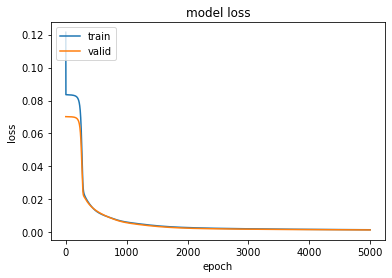

0.0014695617137476802
0.07032492011785507
Model: "sequential_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_181 (Dense)            (None, 4)                 24        
_________________________________________________________________
dense_182 (Dense)            (None, 15)                75        
_________________________________________________________________
dense_183 (Dense)            (None, 1)                 16        
Total params: 115
Trainable params: 115
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_145 (Dense)            (None, 2)                 12        
_________________________________________________________________
dense_146 (Dense)            (None, 5)                 1

In [143]:
history = best_history
#history = worst_history

print(len(history.history['loss']))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'valid'], loc='upper left')
plt.show()

print(best_loss)
print(worst_loss)

best_model.summary()
worst_model.summary()

In [67]:
print(losses)

[0.07029453665018082, 0.0701996311545372, 0.07016725838184357, 0.07032492011785507, 0.07018060982227325, 0.07018281519412994, 0.0016635198844596744, 0.07024423778057098, 0.0701829195022583, 0.001492602750658989, 0.07016507536172867, 0.07026822119951248, 0.0015453851083293557, 0.07019414007663727, 0.07020093500614166, 0.0014695617137476802, 0.0701843872666359, 0.07016756385564804]


Best model validation loss = 0.0014695617137476802 corresponding to model with [4, 15, 0.1]

Worst model validation loss = 0.07032492011785507 corresponding to model with [2, 5, 0.1]

List of losses: 0.07029453665018082, 0.0701996311545372, 0.07016725838184357, 0.07032492011785507, 0.07018060982227325, 0.07018281519412994, 0.0016635198844596744, 0.07024423778057098, 0.0701829195022583, 0.001492602750658989, 0.07016507536172867, 0.07026822119951248, 0.0015453851083293557, 0.07019414007663727, 0.07020093500614166, 0.0014695617137476802, 0.0701843872666359, 0.07016756385564804

Order of combinations: [nh1, nh2, lr] = [2, 2, 0.1], [2, 2, 0.01], [2, 2, 0.001], [2, 5. 0.1], [2, 5. 0.01], [2, 5. 0.001], [2, 15, 0.1],  [2, 15, 0.01], [2, 15, 0.001] and the same with 4
18 total models

In [101]:
#Let's train the best and worst model against the whole train+valid dataset and then test their predictions
X_trainval.clear()
y_trainval.clear()

X_trainval = X_train + X_valid
print(len(X_trainval))

y_trainval = y_train + y_valid

print(len(y_trainval))

1001
1001


In [105]:
model = best_model

history_best = model.fit(
                X_trainval, 
                y_trainval, 
                epochs = 5000, 
                verbose = 1
            )
accuracy = model.evaluate(
                x = X_test,
                y = y_test,
                verbose=1,
                callbacks=None,
            )
print("Accuracy: %.6f%%n" % (100.0 * accuracy))

Epoch 1/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 2/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0012
Epoch 3/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0012
Epoch 4/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 5/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 6/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 7/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0012
Epoch 8/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 9/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 10/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 11/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 12/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0012
E

32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 99/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 100/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 101/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0012
Epoch 102/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 103/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 104/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 105/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 106/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 107/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 108/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 109/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0

32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 195/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 196/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 197/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 198/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 199/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0012
Epoch 200/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 201/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 202/5000
32/32 [==============================] - 0s 490us/step - loss: 0.0012
Epoch 203/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 204/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 205/5000
32/32 [==============================] - 0s 531us/step - loss: 0.

32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 291/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0012
Epoch 292/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0012
Epoch 293/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 294/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 295/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0012
Epoch 296/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 297/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 298/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 299/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0012
Epoch 300/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 301/5000
32/32 [==============================] - 0s 500us/step - loss: 0.

32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 387/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0012
Epoch 388/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0012
Epoch 389/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 390/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 391/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 392/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0012
Epoch 393/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 394/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 395/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 396/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 397/5000
32/32 [==============================] - 0s 469us/step - loss: 0.

32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 483/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 484/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 485/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 486/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 487/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0012
Epoch 488/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 489/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 490/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 491/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0012
Epoch 492/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0012
Epoch 493/5000
32/32 [==============================] - 0s 500us/step - loss: 0.

32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 579/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 580/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 581/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 582/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 583/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 584/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 585/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 586/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 587/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 588/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 589/5000
32/32 [==============================] - 0s 469us/step - loss: 0.

32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 675/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 676/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 677/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 678/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 679/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 680/5000
32/32 [==============================] - 0s 517us/step - loss: 0.0011
Epoch 681/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 682/5000
32/32 [==============================] - 0s 437us/step - loss: 0.0011
Epoch 683/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 684/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 685/5000
32/32 [==============================] - 0s 500us/step - loss: 0.

32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 771/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 772/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 773/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 774/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 775/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 776/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 777/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 778/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 779/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 780/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 781/5000
32/32 [==============================] - 0s 500us/step - loss: 0.

32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 867/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 868/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 869/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 870/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 871/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 872/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 873/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 874/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 875/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 876/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 877/5000
32/32 [==============================] - 0s 531us/step - loss: 0.

32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 963/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 964/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 965/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 966/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 967/5000
32/32 [==============================] - 0s 485us/step - loss: 0.0011
Epoch 968/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 969/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 970/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 971/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 972/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 973/5000
32/32 [==============================] - 0s 469us/step - loss: 0.

32/32 [==============================] - 0s 509us/step - loss: 0.0011
Epoch 1058/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1059/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1060/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1061/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1062/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1063/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1064/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1065/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1066/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1067/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1068/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1153/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1154/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0011
Epoch 1155/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1156/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1157/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0011
Epoch 1158/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0011
Epoch 1159/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0011
Epoch 1160/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0011
Epoch 1161/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0011
Epoch 1162/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0011
Epoch 1163/5000
32/32 [==============================] - 0s 563us/step

32/32 [==============================] - 0s 563us/step - loss: 0.0011
Epoch 1248/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0011
Epoch 1249/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0011
Epoch 1250/5000
32/32 [==============================] - ETA: 0s - loss: 0.001 - 0s 531us/step - loss: 0.0011
Epoch 1251/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1252/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0011
Epoch 1253/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1254/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1255/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0011
Epoch 1256/5000
32/32 [==============================] - 0s 625us/step - loss: 0.0011
Epoch 1257/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0011
Epoch 1258/5000
32/32 [=======================

32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1343/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1344/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1345/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1346/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1347/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1348/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1349/5000
32/32 [==============================] - 0s 438us/step - loss: 0.0011
Epoch 1350/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1351/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1352/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1353/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1438/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1439/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1440/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1441/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1442/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1443/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1444/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1445/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1446/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1447/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1448/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1533/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1534/5000
32/32 [==============================] - 0s 506us/step - loss: 0.0011
Epoch 1535/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1536/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1537/5000
32/32 [==============================] - 0s 537us/step - loss: 0.0011
Epoch 1538/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1539/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1540/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1541/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1542/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1543/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1628/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1629/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1630/5000
32/32 [==============================] - 0s 537us/step - loss: 0.0011
Epoch 1631/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1632/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1633/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1634/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1635/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1636/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1637/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1638/5000
32/32 [==============================] - 0s 531us/step

32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1723/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1724/5000
32/32 [==============================] - 0s 486us/step - loss: 0.0011
Epoch 1725/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1726/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1727/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1728/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1729/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1730/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1731/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1732/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1733/5000
32/32 [==============================] - 0s 469us/step

32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1818/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1819/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1820/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1821/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1822/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1823/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1824/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1825/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1826/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1827/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1828/5000
32/32 [==============================] - 0s 531us/step

32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1913/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 1914/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1915/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1916/5000
32/32 [==============================] - 0s 437us/step - loss: 0.0011
Epoch 1917/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1918/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1919/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1920/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 1921/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1922/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 1923/5000
32/32 [==============================] - 0s 469us/step

32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 2008/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 2009/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2010/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2011/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2012/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 2013/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 2014/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2015/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2016/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2017/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2018/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 2103/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2104/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2105/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2106/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2107/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2108/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 2109/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2110/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 2111/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2112/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2113/5000
32/32 [==============================] - 0s 500us/step

Epoch 2197/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2198/5000
32/32 [==============================] - 0s 506us/step - loss: 0.0011
Epoch 2199/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2200/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 2201/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2202/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2203/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2204/5000
32/32 [==============================] - 0s 526us/step - loss: 0.0011
Epoch 2205/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 2206/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 2207/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2208/5000
32/32 [==============================]

32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2293/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2294/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2295/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2296/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2297/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2298/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2299/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2300/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2301/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2302/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2303/5000
32/32 [==============================] - 0s 469us/step

32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2388/5000
32/32 [==============================] - 0s 534us/step - loss: 0.0011
Epoch 2389/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2390/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2391/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2392/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2393/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2394/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0011
Epoch 2395/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2396/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 2397/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0011
Epoch 2398/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 505us/step - loss: 0.0010
Epoch 2483/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2484/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2485/5000
32/32 [==============================] - 0s 437us/step - loss: 0.0010
Epoch 2486/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2487/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2488/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2489/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2490/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2491/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2492/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2493/5000
32/32 [==============================] - 0s 469us/step

32/32 [==============================] - 0s 563us/step - loss: 0.0010
Epoch 2577/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2578/5000
32/32 [==============================] - 0s 481us/step - loss: 0.0010
Epoch 2579/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2580/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2581/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 2582/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2583/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2584/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 2585/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2586/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2587/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 2672/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2673/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2674/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2675/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2676/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2677/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2678/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2679/5000
32/32 [==============================] - 0s 438us/step - loss: 0.0010
Epoch 2680/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2681/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2682/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2767/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2768/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2769/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2770/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2771/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 2772/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2773/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2774/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2775/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2776/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2777/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2862/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2863/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2864/5000
32/32 [==============================] - 0s 501us/step - loss: 0.0010
Epoch 2865/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2866/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2867/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2868/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2869/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2870/5000
32/32 [==============================] - 0s 468us/step - loss: 0.0010
Epoch 2871/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2872/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2957/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2958/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2959/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2960/5000
32/32 [==============================] - 0s 512us/step - loss: 0.0010
Epoch 2961/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2962/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2963/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 2964/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2965/5000
32/32 [==============================] - 0s 504us/step - loss: 0.0010
Epoch 2966/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 2967/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3052/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3053/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3054/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3055/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3056/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 3057/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3058/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 3059/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3060/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3061/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3062/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3147/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3148/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3149/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 3150/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3151/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3152/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3153/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3154/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3155/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3156/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 3157/5000
32/32 [==============================] - 0s 469us/step

32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3242/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3243/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 3244/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3245/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3246/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3247/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 3248/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3249/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0010
Epoch 3250/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3251/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3252/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 370us/step - loss: 0.0010
Epoch 3337/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3338/5000
32/32 [==============================] - 0s 599us/step - loss: 0.0010
Epoch 3339/5000
32/32 [==============================] - 0s 437us/step - loss: 0.0010
Epoch 3340/5000
32/32 [==============================] - 0s 174us/step - loss: 0.0010
Epoch 3341/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3342/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3343/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3344/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 3345/5000
32/32 [==============================] - 0s 314us/step - loss: 0.0010
Epoch 3346/5000
32/32 [==============================] - 0s 303us/step - loss: 0.0010
Epoch 3347/5000
32/32 [==============================] - 0s 821us/step

32/32 [==============================] - 0s 750us/step - loss: 0.0010
Epoch 3432/5000
32/32 [==============================] - 0s 719us/step - loss: 0.0010
Epoch 3433/5000
32/32 [==============================] - 0s 625us/step - loss: 0.0010
Epoch 3434/5000
32/32 [==============================] - 0s 656us/step - loss: 0.0010
Epoch 3435/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 3436/5000
32/32 [==============================] - 0s 459us/step - loss: 0.0010
Epoch 3437/5000
32/32 [==============================] - 0s 437us/step - loss: 0.0010
Epoch 3438/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3439/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 3440/5000
32/32 [==============================] - 0s 438us/step - loss: 0.0010
Epoch 3441/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3442/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 594us/step - loss: 0.0010
Epoch 3527/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0010
Epoch 3528/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0010
Epoch 3529/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0010
Epoch 3530/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0010
Epoch 3531/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3532/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0010
Epoch 3533/5000
32/32 [==============================] - 0s 578us/step - loss: 0.0010
Epoch 3534/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0010
Epoch 3535/5000
32/32 [==============================] - 0s 688us/step - loss: 0.0010
Epoch 3536/5000
32/32 [==============================] - 0s 656us/step - loss: 0.0010
Epoch 3537/5000
32/32 [==============================] - 0s 594us/step

32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3622/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3623/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3624/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0010
Epoch 3625/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3626/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3627/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3628/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0010
Epoch 3629/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3630/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0010
Epoch 3631/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3632/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 563us/step - loss: 0.0010
Epoch 3717/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3718/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0010
Epoch 3719/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0010
Epoch 3720/5000
32/32 [==============================] - 0s 562us/step - loss: 0.0010
Epoch 3721/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0010
Epoch 3722/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3723/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3724/5000
32/32 [==============================] - 0s 551us/step - loss: 0.0010
Epoch 3725/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3726/5000
32/32 [==============================] - 0s 625us/step - loss: 0.0010
Epoch 3727/5000
32/32 [==============================] - 0s 531us/step

32/32 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 3812/5000
32/32 [==============================] - 0s 688us/step - loss: 0.0010
Epoch 3813/5000
32/32 [==============================] - 0s 719us/step - loss: 0.0010
Epoch 3814/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0010
Epoch 3815/5000
32/32 [==============================] - 0s 625us/step - loss: 0.0010
Epoch 3816/5000
32/32 [==============================] - 0s 656us/step - loss: 0.0010
Epoch 3817/5000
32/32 [==============================] - 0s 625us/step - loss: 0.0010
Epoch 3818/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 3819/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0010
Epoch 3820/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0010
Epoch 3821/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0010
Epoch 3822/5000
32/32 [==============================] - 0s 469us/step -

32/32 [==============================] - 0s 469us/step - loss: 9.9908e-04
Epoch 3906/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9905e-04
Epoch 3907/5000
32/32 [==============================] - 0s 438us/step - loss: 9.9902e-04
Epoch 3908/5000
32/32 [==============================] - 0s 438us/step - loss: 9.9899e-04
Epoch 3909/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9896e-04
Epoch 3910/5000
32/32 [==============================] - 0s 500us/step - loss: 9.9893e-04
Epoch 3911/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9890e-04
Epoch 3912/5000
32/32 [==============================] - 0s 500us/step - loss: 9.9887e-04
Epoch 3913/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9884e-04
Epoch 3914/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9881e-04
Epoch 3915/5000
32/32 [==============================] - 0s 656us/step - loss: 9.9878e-04
Epoch 3916/5000
32/32 [===

Epoch 3996/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9636e-04
Epoch 3997/5000
32/32 [==============================] - 0s 438us/step - loss: 9.9633e-04
Epoch 3998/5000
32/32 [==============================] - 0s 500us/step - loss: 9.9630e-04
Epoch 3999/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9627e-04
Epoch 4000/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9625e-04
Epoch 4001/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9622e-04
Epoch 4002/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9619e-04
Epoch 4003/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9616e-04
Epoch 4004/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9613e-04
Epoch 4005/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9610e-04
Epoch 4006/5000
32/32 [==============================] - 0s 531us/step - loss: 9.9607e-04
Epoch 4007

32/32 [==============================] - 0s 506us/step - loss: 9.9368e-04
Epoch 4088/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9365e-04
Epoch 4089/5000
32/32 [==============================] - 0s 517us/step - loss: 9.9362e-04
Epoch 4090/5000
32/32 [==============================] - 0s 500us/step - loss: 9.9360e-04
Epoch 4091/5000
32/32 [==============================] - 0s 500us/step - loss: 9.9357e-04
Epoch 4092/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9354e-04
Epoch 4093/5000
32/32 [==============================] - 0s 500us/step - loss: 9.9351e-04
Epoch 4094/5000
32/32 [==============================] - 0s 500us/step - loss: 9.9348e-04
Epoch 4095/5000
32/32 [==============================] - 0s 438us/step - loss: 9.9345e-04
Epoch 4096/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9342e-04
Epoch 4097/5000
32/32 [==============================] - 0s 469us/step - loss: 9.9339e-04
Epoch 4098/5000
32/32 [===

Epoch 4178/5000
32/32 [==============================] - 0s 360us/step - loss: 9.9103e-04
Epoch 4179/5000
32/32 [==============================] - 0s 411us/step - loss: 9.9100e-04
Epoch 4180/5000
32/32 [==============================] - 0s 773us/step - loss: 9.9098e-04
Epoch 4181/5000
32/32 [==============================] - 0s 500us/step - loss: 9.9095e-04
Epoch 4182/5000
32/32 [==============================] - 0s 381us/step - loss: 9.9092e-04
Epoch 4183/5000
32/32 [==============================] - 0s 328us/step - loss: 9.9089e-04
Epoch 4184/5000
32/32 [==============================] - 0s 401us/step - loss: 9.9086e-04
Epoch 4185/5000
32/32 [==============================] - 0s 370us/step - loss: 9.9083e-04
Epoch 4186/5000
32/32 [==============================] - 0s 372us/step - loss: 9.9080e-04
Epoch 4187/5000
32/32 [==============================] - 0s 406us/step - loss: 9.9077e-04
Epoch 4188/5000
32/32 [==============================] - 0s 360us/step - loss: 9.9074e-04
Epoch 4189

32/32 [==============================] - 0s 563us/step - loss: 9.8842e-04
Epoch 4270/5000
32/32 [==============================] - 0s 797us/step - loss: 9.8839e-04
Epoch 4271/5000
32/32 [==============================] - 0s 500us/step - loss: 9.8836e-04
Epoch 4272/5000
32/32 [==============================] - 0s 531us/step - loss: 9.8833e-04
Epoch 4273/5000
32/32 [==============================] - 0s 625us/step - loss: 9.8830e-04
Epoch 4274/5000
32/32 [==============================] - 0s 813us/step - loss: 9.8827e-04
Epoch 4275/5000
32/32 [==============================] - 0s 688us/step - loss: 9.8825e-04
Epoch 4276/5000
32/32 [==============================] - 0s 969us/step - loss: 9.8822e-04
Epoch 4277/5000
32/32 [==============================] - 0s 844us/step - loss: 9.8819e-04
Epoch 4278/5000
32/32 [==============================] - 0s 781us/step - loss: 9.8816e-04
Epoch 4279/5000
32/32 [==============================] - 0s 750us/step - loss: 9.8813e-04
Epoch 4280/5000
32/32 [===

Epoch 4360/5000
32/32 [==============================] - 0s 368us/step - loss: 9.8583e-04
Epoch 4361/5000
32/32 [==============================] - 0s 381us/step - loss: 9.8580e-04
Epoch 4362/5000
32/32 [==============================] - 0s 416us/step - loss: 9.8577e-04
Epoch 4363/5000
32/32 [==============================] - 0s 415us/step - loss: 9.8574e-04
Epoch 4364/5000
32/32 [==============================] - 0s 391us/step - loss: 9.8572e-04
Epoch 4365/5000
32/32 [==============================] - 0s 363us/step - loss: 9.8569e-04
Epoch 4366/5000
32/32 [==============================] - 0s 383us/step - loss: 9.8566e-04
Epoch 4367/5000
32/32 [==============================] - 0s 369us/step - loss: 9.8563e-04
Epoch 4368/5000
32/32 [==============================] - 0s 844us/step - loss: 9.8560e-04
Epoch 4369/5000
32/32 [==============================] - 0s 531us/step - loss: 9.8557e-04
Epoch 4370/5000
32/32 [==============================] - 0s 531us/step - loss: 9.8555e-04
Epoch 4371

32/32 [==============================] - 0s 656us/step - loss: 9.8330e-04
Epoch 4451/5000
32/32 [==============================] - 0s 531us/step - loss: 9.8327e-04
Epoch 4452/5000
32/32 [==============================] - 0s 531us/step - loss: 9.8324e-04
Epoch 4453/5000
32/32 [==============================] - 0s 531us/step - loss: 9.8321e-04
Epoch 4454/5000
32/32 [==============================] - 0s 531us/step - loss: 9.8318e-04
Epoch 4455/5000
32/32 [==============================] - 0s 563us/step - loss: 9.8316e-04
Epoch 4456/5000
32/32 [==============================] - 0s 531us/step - loss: 9.8313e-04
Epoch 4457/5000
32/32 [==============================] - 0s 531us/step - loss: 9.8310e-04
Epoch 4458/5000
32/32 [==============================] - 0s 532us/step - loss: 9.8307e-04
Epoch 4459/5000
32/32 [==============================] - 0s 531us/step - loss: 9.8305e-04
Epoch 4460/5000
32/32 [==============================] - 0s 563us/step - loss: 9.8302e-04
Epoch 4461/5000
32/32 [===

Epoch 4541/5000
32/32 [==============================] - 0s 563us/step - loss: 9.8077e-04
Epoch 4542/5000
32/32 [==============================] - 0s 563us/step - loss: 9.8074e-04
Epoch 4543/5000
32/32 [==============================] - 0s 500us/step - loss: 9.8071e-04
Epoch 4544/5000
32/32 [==============================] - 0s 500us/step - loss: 9.8068e-04
Epoch 4545/5000
32/32 [==============================] - 0s 500us/step - loss: 9.8066e-04
Epoch 4546/5000
32/32 [==============================] - 0s 531us/step - loss: 9.8063e-04
Epoch 4547/5000
32/32 [==============================] - 0s 500us/step - loss: 9.8060e-04
Epoch 4548/5000
32/32 [==============================] - 0s 469us/step - loss: 9.8057e-04
Epoch 4549/5000
32/32 [==============================] - 0s 531us/step - loss: 9.8055e-04
Epoch 4550/5000
32/32 [==============================] - 0s 500us/step - loss: 9.8052e-04
Epoch 4551/5000
32/32 [==============================] - 0s 469us/step - loss: 9.8049e-04
Epoch 4552

32/32 [==============================] - 0s 352us/step - loss: 9.7826e-04
Epoch 4633/5000
32/32 [==============================] - 0s 737us/step - loss: 9.7824e-04
Epoch 4634/5000
32/32 [==============================] - 0s 500us/step - loss: 9.7821e-04
Epoch 4635/5000
32/32 [==============================] - 0s 356us/step - loss: 9.7818e-04
Epoch 4636/5000
32/32 [==============================] - 0s 374us/step - loss: 9.7815e-04
Epoch 4637/5000
32/32 [==============================] - 0s 389us/step - loss: 9.7813e-04
Epoch 4638/5000
32/32 [==============================] - 0s 388us/step - loss: 9.7810e-04
Epoch 4639/5000
32/32 [==============================] - 0s 421us/step - loss: 9.7807e-04
Epoch 4640/5000
32/32 [==============================] - 0s 412us/step - loss: 9.7804e-04
Epoch 4641/5000
32/32 [==============================] - 0s 360us/step - loss: 9.7802e-04
Epoch 4642/5000
32/32 [==============================] - 0s 380us/step - loss: 9.7799e-04
Epoch 4643/5000
32/32 [===

32/32 [==============================] - 0s 469us/step - loss: 9.7578e-04
Epoch 4724/5000
32/32 [==============================] - 0s 469us/step - loss: 9.7576e-04
Epoch 4725/5000
32/32 [==============================] - 0s 346us/step - loss: 9.7573e-04
Epoch 4726/5000
32/32 [==============================] - 0s 522us/step - loss: 9.7570e-04
Epoch 4727/5000
32/32 [==============================] - 0s 331us/step - loss: 9.7568e-04
Epoch 4728/5000
32/32 [==============================] - 0s 419us/step - loss: 9.7565e-04
Epoch 4729/5000
32/32 [==============================] - 0s 359us/step - loss: 9.7562e-04
Epoch 4730/5000
32/32 [==============================] - 0s 441us/step - loss: 9.7560e-04
Epoch 4731/5000
32/32 [==============================] - 0s 341us/step - loss: 9.7557e-04
Epoch 4732/5000
32/32 [==============================] - 0s 374us/step - loss: 9.7554e-04
Epoch 4733/5000
32/32 [==============================] - 0s 386us/step - loss: 9.7551e-04
Epoch 4734/5000
32/32 [===

32/32 [==============================] - 0s 166us/step - loss: 9.7333e-04
Epoch 4815/5000
32/32 [==============================] - 0s 170us/step - loss: 9.7330e-04
Epoch 4816/5000
32/32 [==============================] - 0s 383us/step - loss: 9.7328e-04
Epoch 4817/5000
32/32 [==============================] - 0s 469us/step - loss: 9.7325e-04
Epoch 4818/5000
32/32 [==============================] - 0s 108us/step - loss: 9.7322e-04
Epoch 4819/5000
32/32 [==============================] - 0s 357us/step - loss: 9.7320e-04
Epoch 4820/5000
32/32 [==============================] - 0s 847us/step - loss: 9.7317e-04
Epoch 4821/5000
32/32 [==============================] - 0s 500us/step - loss: 9.7314e-04
Epoch 4822/5000
32/32 [==============================] - 0s 161us/step - loss: 9.7312e-04
Epoch 4823/5000
32/32 [==============================] - 0s 469us/step - loss: 9.7309e-04
Epoch 4824/5000
32/32 [==============================] - 0s 740us/step - loss: 9.7306e-04
Epoch 4825/5000
32/32 [===

32/32 [==============================] - 0s 563us/step - loss: 9.7090e-04
Epoch 4906/5000
32/32 [==============================] - 0s 469us/step - loss: 9.7088e-04
Epoch 4907/5000
32/32 [==============================] - 0s 469us/step - loss: 9.7085e-04
Epoch 4908/5000
32/32 [==============================] - 0s 485us/step - loss: 9.7082e-04
Epoch 4909/5000
32/32 [==============================] - 0s 500us/step - loss: 9.7080e-04
Epoch 4910/5000
32/32 [==============================] - 0s 531us/step - loss: 9.7077e-04
Epoch 4911/5000
32/32 [==============================] - 0s 532us/step - loss: 9.7074e-04
Epoch 4912/5000
32/32 [==============================] - 0s 812us/step - loss: 9.7072e-04
Epoch 4913/5000
32/32 [==============================] - 0s 469us/step - loss: 9.7069e-04
Epoch 4914/5000
32/32 [==============================] - 0s 469us/step - loss: 9.7067e-04
Epoch 4915/5000
32/32 [==============================] - 0s 563us/step - loss: 9.7064e-04
Epoch 4916/5000
32/32 [===

32/32 [==============================] - 0s 625us/step - loss: 9.6850e-04
Epoch 4997/5000
32/32 [==============================] - 0s 656us/step - loss: 9.6847e-04
Epoch 4998/5000
32/32 [==============================] - 0s 500us/step - loss: 9.6845e-04
Epoch 4999/5000
32/32 [==============================] - 0s 500us/step - loss: 9.6842e-04
Epoch 5000/5000
7/7 [==============================] - 0s 858us/step - loss: 8.9856e-04
Accuracy: 0.1%n


The loss of the best model trained on the train + validation dataset is 8.9865e-04.

<function matplotlib.pyplot.show(close=None, block=None)>

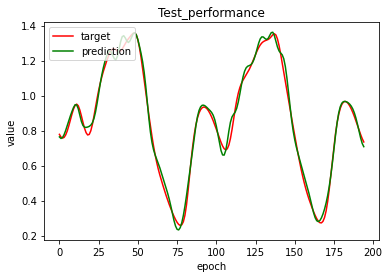

In [106]:
plt.plot(y_test, 'r')
plt.plot(model.predict(X_test), 'g')
plt.title('Test_performance')
plt.ylabel('value')
plt.xlabel('epoch')
plt.legend(['target', 'prediction'], loc='upper left')
plt.show

In [107]:
model = worst_model

history_worst = model.fit(
                X_trainval, 
                y_trainval, 
                epochs = 5000, 
                verbose = 1
            )
accuracy = model.evaluate(
                x = X_test,
                y = y_test,
                verbose=1,
                callbacks=None,
            )
print("Accuracy: %.6f%%n" % (100.0 * accuracy))

Epoch 1/5000
32/32 [==============================] - 0s 594us/step - loss: 0.0797
Epoch 2/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0798
Epoch 3/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0798
Epoch 4/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0798
Epoch 5/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0798
Epoch 6/5000
32/32 [==============================] - 0s 501us/step - loss: 0.0798
Epoch 7/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0798
Epoch 8/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0798
Epoch 9/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0798
Epoch 10/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0798
Epoch 11/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0798
Epoch 12/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0798
E

32/32 [==============================] - 0s 500us/step - loss: 0.0797
Epoch 99/5000
32/32 [==============================] - 0s 532us/step - loss: 0.0797
Epoch 100/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0797
Epoch 101/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0797
Epoch 102/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0797
Epoch 103/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0797
Epoch 104/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0797
Epoch 105/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0797
Epoch 106/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0797
Epoch 107/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0797
Epoch 108/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0797
Epoch 109/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0

32/32 [==============================] - 0s 531us/step - loss: 0.0790
Epoch 195/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0790
Epoch 196/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0790
Epoch 197/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0789
Epoch 198/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0789
Epoch 199/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0788
Epoch 200/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0788
Epoch 201/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0788
Epoch 202/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0787
Epoch 203/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0787
Epoch 204/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0786
Epoch 205/5000
32/32 [==============================] - 0s 469us/step - loss: 0.

32/32 [==============================] - 0s 469us/step - loss: 0.0228
Epoch 291/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0227
Epoch 292/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0225
Epoch 293/5000
32/32 [==============================] - 0s 502us/step - loss: 0.0224
Epoch 294/5000
32/32 [==============================] - 0s 521us/step - loss: 0.0223
Epoch 295/5000
32/32 [==============================] - 0s 502us/step - loss: 0.0222
Epoch 296/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0221
Epoch 297/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0220
Epoch 298/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0218
Epoch 299/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0217
Epoch 300/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0216
Epoch 301/5000
32/32 [==============================] - 0s 500us/step - loss: 0.

32/32 [==============================] - 0s 500us/step - loss: 0.0154
Epoch 387/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0154
Epoch 388/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0153
Epoch 389/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0153
Epoch 390/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0152
Epoch 391/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0152
Epoch 392/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0151
Epoch 393/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0150
Epoch 394/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0150
Epoch 395/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0149
Epoch 396/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0149
Epoch 397/5000
32/32 [==============================] - 0s 531us/step - loss: 0.

Epoch 482/5000
32/32 [==============================] - 0s 563us/step - loss: 0.0118
Epoch 483/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0117
Epoch 484/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0117
Epoch 485/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0117
Epoch 486/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0117
Epoch 487/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0116
Epoch 488/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0116
Epoch 489/5000
32/32 [==============================] - 0s 506us/step - loss: 0.0116
Epoch 490/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0116
Epoch 491/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0116
Epoch 492/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0115
Epoch 493/5000
32/32 [==============================] - 0s 531us/

32/32 [==============================] - 0s 500us/step - loss: 0.0103
Epoch 579/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0103
Epoch 580/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0103
Epoch 581/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0103
Epoch 582/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0103
Epoch 583/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0103
Epoch 584/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0103
Epoch 585/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0103
Epoch 586/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0102
Epoch 587/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0102
Epoch 588/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0102
Epoch 589/5000
32/32 [==============================] - 0s 500us/step - loss: 0.

32/32 [==============================] - 0s 531us/step - loss: 0.0097
Epoch 675/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 676/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 677/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 678/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 679/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 680/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 681/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 682/5000
32/32 [==============================] - 0s 509us/step - loss: 0.0097
Epoch 683/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 684/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 685/5000
32/32 [==============================] - 0s 469us/step - loss: 0.

32/32 [==============================] - 0s 500us/step - loss: 0.0092
Epoch 771/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0092
Epoch 772/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0092
Epoch 773/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0092
Epoch 774/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0091
Epoch 775/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0091
Epoch 776/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0091
Epoch 777/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0091
Epoch 778/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0091
Epoch 779/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0091
Epoch 780/5000
32/32 [==============================] - 0s 485us/step - loss: 0.0091
Epoch 781/5000
32/32 [==============================] - 0s 531us/step - loss: 0.

32/32 [==============================] - 0s 531us/step - loss: 0.0084
Epoch 867/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0084
Epoch 868/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0084
Epoch 869/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0084
Epoch 870/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0083
Epoch 871/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0083
Epoch 872/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0083
Epoch 873/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0083
Epoch 874/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0083
Epoch 875/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0083
Epoch 876/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0083
Epoch 877/5000
32/32 [==============================] - 0s 469us/step - loss: 0.

32/32 [==============================] - 0s 500us/step - loss: 0.0070
Epoch 963/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0070
Epoch 964/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0069
Epoch 965/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0069
Epoch 966/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0069
Epoch 967/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0069
Epoch 968/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0069
Epoch 969/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0068
Epoch 970/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0068
Epoch 971/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0068
Epoch 972/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0068
Epoch 973/5000
32/32 [==============================] - 0s 500us/step - loss: 0.

32/32 [==============================] - 0s 469us/step - loss: 0.0053
Epoch 1058/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0053
Epoch 1059/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0053
Epoch 1060/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0053
Epoch 1061/5000
32/32 [==============================] - ETA: 0s - loss: 0.005 - 0s 469us/step - loss: 0.0053
Epoch 1062/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0053
Epoch 1063/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0052
Epoch 1064/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0052
Epoch 1065/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0052
Epoch 1066/5000
32/32 [==============================] - 0s 438us/step - loss: 0.0052
Epoch 1067/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0052
Epoch 1068/5000
32/32 [=======================

Epoch 1152/5000
32/32 [==============================] - 0s 516us/step - loss: 0.0045
Epoch 1153/5000
32/32 [==============================] - 0s 516us/step - loss: 0.0045
Epoch 1154/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0045
Epoch 1155/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0045
Epoch 1156/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0045
Epoch 1157/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0045
Epoch 1158/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0045
Epoch 1159/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0045
Epoch 1160/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0045
Epoch 1161/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0045
Epoch 1162/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0045
Epoch 1163/5000
32/32 [==============================]

Epoch 1247/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 1248/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 1249/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 1250/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 1251/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0040
Epoch 1252/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0040
Epoch 1253/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0040
Epoch 1254/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 1255/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 1256/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 1257/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0040
Epoch 1258/5000
32/32 [==============================]

32/32 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 1343/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 1344/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 1345/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0036
Epoch 1346/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0036
Epoch 1347/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0036
Epoch 1348/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0036
Epoch 1349/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 1350/5000
32/32 [==============================] - 0s 516us/step - loss: 0.0036
Epoch 1351/5000
32/32 [==============================] - 0s 531us/step - loss: 0.0036
Epoch 1352/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 1353/5000
32/32 [==============================] - 0s 531us/step

32/32 [==============================] - 0s 469us/step - loss: 0.0033
Epoch 1438/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 1439/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 1440/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 1441/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 1442/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0033
Epoch 1443/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 1444/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 1445/5000
32/32 [==============================] - 0s 469us/step - loss: 0.0033
Epoch 1446/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 1447/5000
32/32 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 1448/5000
32/32 [==============================] - 0s 500us/step

32/32 [==============================] - 0s 750us/step - loss: 0.0031
Epoch 1533/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0030
Epoch 1534/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0030
Epoch 1535/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0030
Epoch 1536/5000
32/32 [==============================] - 0s 1000us/step - loss: 0.0030
Epoch 1537/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0030
Epoch 1538/5000
32/32 [==============================] - 0s 1000us/step - loss: 0.0030
Epoch 1539/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0030
Epoch 1540/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0030
Epoch 1541/5000
32/32 [==============================] - 0s 883us/step - loss: 0.0030
Epoch 1542/5000
32/32 [==============================] - 0s 660us/step - loss: 0.0030
Epoch 1543/5000
32/32 [==============================] - 0s 750us/st

32/32 [==============================] - 0s 793us/step - loss: 0.0029
Epoch 1628/5000
32/32 [==============================] - 0s 720us/step - loss: 0.0029
Epoch 1629/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 1630/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 1631/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 1632/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 1633/5000
32/32 [==============================] - 0s 2ms/step - loss: 0.0029
Epoch 1634/5000
32/32 [==============================] - 0s 2ms/step - loss: 0.0028
Epoch 1635/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 1636/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 1637/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0028
Epoch 1638/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0028


32/32 [==============================] - 0s 749us/step - loss: 0.0027
Epoch 1724/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0027
Epoch 1725/5000
32/32 [==============================] - 0s 749us/step - loss: 0.0027
Epoch 1726/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0027
Epoch 1727/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0027
Epoch 1728/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0027
Epoch 1729/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0027
Epoch 1730/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0027
Epoch 1731/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0027
Epoch 1732/5000
32/32 [==============================] - 0s 766us/step - loss: 0.0027
Epoch 1733/5000
32/32 [==============================] - ETA: 0s - loss: 0.003 - 0s 573us/step - loss: 0.0027
Epoch 1734/5000
32/32 [=======================

32/32 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 1820/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 1821/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 1822/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0026
Epoch 1823/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 1824/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 1825/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0026
Epoch 1826/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0026
Epoch 1827/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 1828/5000
32/32 [==============================] - 0s 995us/step - loss: 0.0026
Epoch 1829/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 1830/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0026


32/32 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 1917/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 1918/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 1919/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 1920/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 1921/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 1922/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 1923/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 1924/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 1925/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 1926/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 1927/5000
32/32 [==============================] - 0s 844us/step - loss: 0.0025
Epoch 

32/32 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 2014/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 2015/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 2016/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 2017/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 2018/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 2019/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 2020/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 2021/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 2022/5000
32/32 [==============================] - 0s 938us/step - loss: 0.0024
Epoch 2023/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 2024/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 

32/32 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 2111/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 2112/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 2113/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 2114/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 2115/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 2116/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 2117/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 2118/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 2119/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 2120/5000
32/32 [==============================] - 0s 938us/step - loss: 0.0023
Epoch 2121/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0023
Epoc

32/32 [==============================] - 0s 844us/step - loss: 0.0022
Epoch 2206/5000
32/32 [==============================] - 0s 782us/step - loss: 0.0022
Epoch 2207/5000
32/32 [==============================] - 0s 938us/step - loss: 0.0022
Epoch 2208/5000
32/32 [==============================] - 0s 875us/step - loss: 0.0022
Epoch 2209/5000
32/32 [==============================] - 0s 752us/step - loss: 0.0022
Epoch 2210/5000
32/32 [==============================] - 0s 875us/step - loss: 0.0022
Epoch 2211/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0022
Epoch 2212/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0022
Epoch 2213/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0022
Epoch 2214/5000
32/32 [==============================] - 0s 719us/step - loss: 0.0022
Epoch 2215/5000
32/32 [==============================] - 0s 719us/step - loss: 0.0022
Epoch 2216/5000
32/32 [==============================] - 0s 719us/step

32/32 [==============================] - 0s 781us/step - loss: 0.0022
Epoch 2301/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0022
Epoch 2302/5000
32/32 [==============================] - 0s 719us/step - loss: 0.0022
Epoch 2303/5000
32/32 [==============================] - 0s 753us/step - loss: 0.0022
Epoch 2304/5000
32/32 [==============================] - 0s 781us/step - loss: 0.0022
Epoch 2305/5000
32/32 [==============================] - 0s 782us/step - loss: 0.0022
Epoch 2306/5000
32/32 [==============================] - 0s 907us/step - loss: 0.0022
Epoch 2307/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0022
Epoch 2308/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0022
Epoch 2309/5000
32/32 [==============================] - 0s 781us/step - loss: 0.0022
Epoch 2310/5000
32/32 [==============================] - 0s 726us/step - loss: 0.0022
Epoch 2311/5000
32/32 [==============================] - 0s 724us/step

32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2397/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2398/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2399/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2400/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2401/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2402/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2403/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2404/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2405/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2406/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2407/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 24

32/32 [==============================] - 0s 2ms/step - loss: 0.0021
Epoch 2493/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2494/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2495/5000
32/32 [==============================] - 0s 2ms/step - loss: 0.0021
Epoch 2496/5000
32/32 [==============================] - 0s 2ms/step - loss: 0.0021
Epoch 2497/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 2498/5000
32/32 [==============================] - 0s 2ms/step - loss: 0.0020
Epoch 2499/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 2500/5000
32/32 [==============================] - 0s 2ms/step - loss: 0.0020
Epoch 2501/5000
32/32 [==============================] - 0s 2ms/step - loss: 0.0020
Epoch 2502/5000
32/32 [==============================] - 0s 2ms/step - loss: 0.0020
Epoch 2503/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 25

32/32 [==============================] - 0s 798us/step - loss: 0.0020
Epoch 2590/5000
32/32 [==============================] - 0s 548us/step - loss: 0.0020
Epoch 2591/5000
32/32 [==============================] - 0s 543us/step - loss: 0.0020
Epoch 2592/5000
32/32 [==============================] - 0s 541us/step - loss: 0.0020
Epoch 2593/5000
32/32 [==============================] - 0s 585us/step - loss: 0.0020
Epoch 2594/5000
32/32 [==============================] - 0s 832us/step - loss: 0.0020
Epoch 2595/5000
32/32 [==============================] - 0s 566us/step - loss: 0.0020
Epoch 2596/5000
32/32 [==============================] - 0s 886us/step - loss: 0.0020
Epoch 2597/5000
32/32 [==============================] - 0s 571us/step - loss: 0.0020
Epoch 2598/5000
32/32 [==============================] - 0s 599us/step - loss: 0.0020
Epoch 2599/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0020
Epoch 2600/5000
32/32 [==============================] - 0s 516us/step

32/32 [==============================] - 0s 938us/step - loss: 0.0020
Epoch 2685/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 2686/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 2687/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 2688/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 2689/5000
32/32 [==============================] - 0s 2ms/step - loss: 0.0020
Epoch 2690/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 2691/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 2692/5000
32/32 [==============================] - 0s 2ms/step - loss: 0.0019
Epoch 2693/5000
32/32 [==============================] - 0s 2ms/step - loss: 0.0019
Epoch 2694/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 2695/5000
32/32 [==============================] - 0s 2ms/step - loss: 0.0019
Epoch 

32/32 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 2781/5000
32/32 [==============================] - 0s 977us/step - loss: 0.0019
Epoch 2782/5000
32/32 [==============================] - 0s 806us/step - loss: 0.0019
Epoch 2783/5000
32/32 [==============================] - 0s 902us/step - loss: 0.0019
Epoch 2784/5000
32/32 [==============================] - 0s 852us/step - loss: 0.0019
Epoch 2785/5000
32/32 [==============================] - 0s 793us/step - loss: 0.0019
Epoch 2786/5000
32/32 [==============================] - 0s 604us/step - loss: 0.0019
Epoch 2787/5000
32/32 [==============================] - 0s 740us/step - loss: 0.0019
Epoch 2788/5000
32/32 [==============================] - 0s 2ms/step - loss: 0.0019
Epoch 2789/5000
32/32 [==============================] - 0s 639us/step - loss: 0.0019
Epoch 2790/5000
32/32 [==============================] - 0s 587us/step - loss: 0.0019
Epoch 2791/5000
32/32 [==============================] - 0s 895us/step - l

32/32 [==============================] - 0s 750us/step - loss: 0.0019
Epoch 2877/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0019
Epoch 2878/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0019
Epoch 2879/5000
32/32 [==============================] - 0s 735us/step - loss: 0.0019
Epoch 2880/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0019
Epoch 2881/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 2882/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0019
Epoch 2883/5000
32/32 [==============================] - 0s 999us/step - loss: 0.0019
Epoch 2884/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0019
Epoch 2885/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0019
Epoch 2886/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0019
Epoch 2887/5000
32/32 [==============================] - 0s 750us/step -

32/32 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 2972/5000
32/32 [==============================] - 0s 792us/step - loss: 0.0018
Epoch 2973/5000
32/32 [==============================] - 0s 604us/step - loss: 0.0018
Epoch 2974/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 2975/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 2976/5000
32/32 [==============================] - 0s 914us/step - loss: 0.0018
Epoch 2977/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 2978/5000
32/32 [==============================] - 0s 1000us/step - loss: 0.0018
Epoch 2979/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 2980/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 2981/5000
32/32 [==============================] - 0s 1000us/step - loss: 0.0018
Epoch 2982/5000
32/32 [==============================] - 0s 750us/st

32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3067/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3068/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3069/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3070/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 3071/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3072/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 3073/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3074/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3075/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3076/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3077/5000
32/32 [==============================] - 0s 750us/step - l

32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3162/5000
32/32 [==============================] - 0s 774us/step - loss: 0.0018
Epoch 3163/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3164/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3165/5000
32/32 [==============================] - 0s 740us/step - loss: 0.0018
Epoch 3166/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3167/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3168/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 3169/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3170/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3171/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0018
Epoch 3172/5000
32/32 [==============================] - 0s 750us/step -

32/32 [==============================] - 0s 644us/step - loss: 0.0017
Epoch 3257/5000
32/32 [==============================] - 0s 988us/step - loss: 0.0017
Epoch 3258/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0017
Epoch 3259/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 3260/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0017
Epoch 3261/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0017
Epoch 3262/5000
32/32 [==============================] - 0s 744us/step - loss: 0.0017
Epoch 3263/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0017
Epoch 3264/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0017
Epoch 3265/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0017
Epoch 3266/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0017
Epoch 3267/5000
32/32 [==============================] - 0s 750us/step -

32/32 [==============================] - 0s 781us/step - loss: 0.0017
Epoch 3352/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0017
Epoch 3353/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0017
Epoch 3354/5000
32/32 [==============================] - 0s 875us/step - loss: 0.0017
Epoch 3355/5000
32/32 [==============================] - 0s 781us/step - loss: 0.0017
Epoch 3356/5000
32/32 [==============================] - 0s 812us/step - loss: 0.0017
Epoch 3357/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0017
Epoch 3358/5000
32/32 [==============================] - 0s 876us/step - loss: 0.0017
Epoch 3359/5000
32/32 [==============================] - 0s 785us/step - loss: 0.0017
Epoch 3360/5000
32/32 [==============================] - 0s 781us/step - loss: 0.0017
Epoch 3361/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0017
Epoch 3362/5000
32/32 [==============================] - 0s 781us/step

32/32 [==============================] - 0s 781us/step - loss: 0.0017
Epoch 3447/5000
32/32 [==============================] - 0s 781us/step - loss: 0.0017
Epoch 3448/5000
32/32 [==============================] - 0s 781us/step - loss: 0.0017
Epoch 3449/5000
32/32 [==============================] - 0s 781us/step - loss: 0.0017
Epoch 3450/5000
32/32 [==============================] - 0s 781us/step - loss: 0.0017
Epoch 3451/5000
32/32 [==============================] - 0s 782us/step - loss: 0.0017
Epoch 3452/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0017
Epoch 3453/5000
32/32 [==============================] - 0s 876us/step - loss: 0.0017
Epoch 3454/5000
32/32 [==============================] - 0s 875us/step - loss: 0.0017
Epoch 3455/5000
32/32 [==============================] - 0s 718us/step - loss: 0.0017
Epoch 3456/5000
32/32 [==============================] - 0s 782us/step - loss: 0.0017
Epoch 3457/5000
32/32 [==============================] - 0s 782us/step

32/32 [==============================] - 0s 781us/step - loss: 0.0017
Epoch 3542/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0017
Epoch 3543/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0017
Epoch 3544/5000
32/32 [==============================] - 0s 844us/step - loss: 0.0017
Epoch 3545/5000
32/32 [==============================] - 0s 969us/step - loss: 0.0017
Epoch 3546/5000
32/32 [==============================] - 0s 844us/step - loss: 0.0017
Epoch 3547/5000
32/32 [==============================] - 0s 844us/step - loss: 0.0017
Epoch 3548/5000
32/32 [==============================] - 0s 782us/step - loss: 0.0017
Epoch 3549/5000
32/32 [==============================] - 0s 844us/step - loss: 0.0017
Epoch 3550/5000
32/32 [==============================] - 0s 907us/step - loss: 0.0017
Epoch 3551/5000
32/32 [==============================] - 0s 906us/step - loss: 0.0017
Epoch 3552/5000
32/32 [==============================] - 0s 859us/step

32/32 [==============================] - 0s 813us/step - loss: 0.0016
Epoch 3637/5000
32/32 [==============================] - 0s 781us/step - loss: 0.0016
Epoch 3638/5000
32/32 [==============================] - 0s 844us/step - loss: 0.0016
Epoch 3639/5000
32/32 [==============================] - 0s 812us/step - loss: 0.0016
Epoch 3640/5000
32/32 [==============================] - 0s 779us/step - loss: 0.0016
Epoch 3641/5000
32/32 [==============================] - 0s 844us/step - loss: 0.0016
Epoch 3642/5000
32/32 [==============================] - 0s 830us/step - loss: 0.0016
Epoch 3643/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0016
Epoch 3644/5000
32/32 [==============================] - 0s 782us/step - loss: 0.0016
Epoch 3645/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0016
Epoch 3646/5000
32/32 [==============================] - 0s 782us/step - loss: 0.0016
Epoch 3647/5000
32/32 [==============================] - 0s 813us/step

32/32 [==============================] - 0s 844us/step - loss: 0.0016
Epoch 3732/5000
32/32 [==============================] - 0s 907us/step - loss: 0.0016
Epoch 3733/5000
32/32 [==============================] - 0s 844us/step - loss: 0.0016
Epoch 3734/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0016
Epoch 3735/5000
32/32 [==============================] - 0s 844us/step - loss: 0.0016
Epoch 3736/5000
32/32 [==============================] - 0s 844us/step - loss: 0.0016
Epoch 3737/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0016
Epoch 3738/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0016
Epoch 3739/5000
32/32 [==============================] - 0s 844us/step - loss: 0.0016
Epoch 3740/5000
32/32 [==============================] - 0s 781us/step - loss: 0.0016
Epoch 3741/5000
32/32 [==============================] - 0s 813us/step - loss: 0.0016
Epoch 3742/5000
32/32 [==============================] - 0s 798us/step

32/32 [==============================] - 0s 813us/step - loss: 0.0016
Epoch 3827/5000
32/32 [==============================] - 0s 752us/step - loss: 0.0016
Epoch 3828/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3829/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3830/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3831/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3832/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3833/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3834/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3835/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3836/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3837/5000
32/32 [==============================] - 0s 1000us/ste

32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3922/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3923/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 3924/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3925/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3926/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3927/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3928/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3929/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 3930/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3931/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 3932/5000
32/32 [==============================] - 0s 750us/step - l

32/32 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 4017/5000
32/32 [==============================] - 0s 954us/step - loss: 0.0016
Epoch 4018/5000
32/32 [==============================] - 0s 542us/step - loss: 0.0016
Epoch 4019/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 4020/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 4021/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 4022/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 4023/5000
32/32 [==============================] - 0s 1000us/step - loss: 0.0016
Epoch 4024/5000
32/32 [==============================] - 0s 775us/step - loss: 0.0016
Epoch 4025/5000
32/32 [==============================] - 0s 814us/step - loss: 0.0016
Epoch 4026/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 4027/5000
32/32 [==============================] - 0s 785us/step - 

32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4112/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4113/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4114/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4115/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4116/5000
32/32 [==============================] - 0s 749us/step - loss: 0.0015
Epoch 4117/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4118/5000
32/32 [==============================] - 0s 1000us/step - loss: 0.0015
Epoch 4119/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4120/5000
32/32 [==============================] - 0s 1000us/step - loss: 0.0015
Epoch 4121/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4122/5000
32/32 [==============================] - 0s 750us/st

32/32 [==============================] - 0s 992us/step - loss: 0.0015
Epoch 4207/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4208/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4209/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4210/5000
32/32 [==============================] - 0s 1000us/step - loss: 0.0015
Epoch 4211/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4212/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4213/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4214/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4215/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4216/5000
32/32 [==============================] - 0s 772us/step - loss: 0.0015
Epoch 4217/5000
32/32 [==============================] - 0s 750us/ste

32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4302/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4303/5000
32/32 [==============================] - 0s 785us/step - loss: 0.0015
Epoch 4304/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4305/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 4306/5000
32/32 [==============================] - 0s 883us/step - loss: 0.0015
Epoch 4307/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4308/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4309/5000
32/32 [==============================] - 0s 953us/step - loss: 0.0015
Epoch 4310/5000
32/32 [==============================] - 0s 636us/step - loss: 0.0015
Epoch 4311/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4312/5000
32/32 [==============================] - 0s 750us/step -

32/32 [==============================] - 0s 987us/step - loss: 0.0015
Epoch 4397/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4398/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4399/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4400/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4401/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4402/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4403/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4404/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4405/5000
32/32 [==============================] - 0s 943us/step - loss: 0.0015
Epoch 4406/5000
32/32 [==============================] - 0s 749us/step - loss: 0.0015
Epoch 4407/5000
32/32 [==============================] - 0s 742us/step

32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4492/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4493/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4494/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4495/5000
32/32 [==============================] - 0s 1000us/step - loss: 0.0015
Epoch 4496/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4497/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4498/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4499/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4500/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4501/5000
32/32 [==============================] - 0s 776us/step - loss: 0.0015
Epoch 4502/5000
32/32 [==============================] - 0s 750us/ste

32/32 [==============================] - 0s 1000us/step - loss: 0.0015
Epoch 4587/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4588/5000
32/32 [==============================] - 0s 751us/step - loss: 0.0015
Epoch 4589/5000
32/32 [==============================] - 0s 777us/step - loss: 0.0015
Epoch 4590/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4591/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4592/5000
32/32 [==============================] - 0s 783us/step - loss: 0.0015
Epoch 4593/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 4594/5000
32/32 [==============================] - 0s 758us/step - loss: 0.0015
Epoch 4595/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4596/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 4597/5000
32/32 [==============================] - 0s 750us/step - 

32/32 [==============================] - 0s 629us/step - loss: 0.0015
Epoch 4682/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4683/5000
32/32 [==============================] - 0s 735us/step - loss: 0.0015
Epoch 4684/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4685/5000
32/32 [==============================] - 0s 843us/step - loss: 0.0015
Epoch 4686/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 4687/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4688/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 4689/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 4690/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 4691/5000
32/32 [==============================] - 0s 1000us/step - loss: 0.0015
Epoch 4692/5000
32/32 [==============================] - 0s 750us/step - lo

32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4777/5000
32/32 [==============================] - 0s 824us/step - loss: 0.0014
Epoch 4778/5000
32/32 [==============================] - 0s 793us/step - loss: 0.0014
Epoch 4779/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4780/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 4781/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4782/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4783/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4784/5000
32/32 [==============================] - 0s 812us/step - loss: 0.0014
Epoch 4785/5000
32/32 [==============================] - 0s 751us/step - loss: 0.0014
Epoch 4786/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4787/5000
32/32 [==============================] - 0s 783us/step -

32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4872/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4873/5000
32/32 [==============================] - 0s 742us/step - loss: 0.0014
Epoch 4874/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 4875/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4876/5000
32/32 [==============================] - 0s 1000us/step - loss: 0.0014
Epoch 4877/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4878/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4879/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4880/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4881/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4882/5000
32/32 [==============================] - 0s 1000us/step

32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4967/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4968/5000
32/32 [==============================] - 0s 749us/step - loss: 0.0014
Epoch 4969/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4970/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4971/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 4972/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4973/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 4974/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4975/5000
32/32 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 4976/5000
32/32 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 4977/5000
32/32 [==============================] - 0s 750us/step - los

<function matplotlib.pyplot.show(close=None, block=None)>

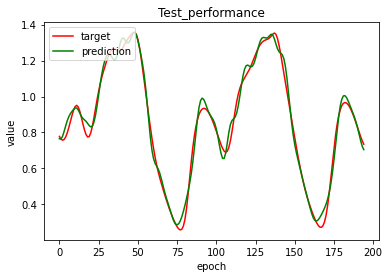

In [108]:
plt.plot(y_test, 'r')
plt.plot(model.predict(X_test), 'g')
plt.title('Test_performance')
plt.ylabel('value')
plt.xlabel('epoch')
plt.legend(['target', 'prediction'], loc='upper left')
plt.show

### Let's train the best model for statistical evaluation

Model: "sequential_132"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_394 (Dense)            (None, 4)                 24        
_________________________________________________________________
dense_395 (Dense)            (None, 15)                75        
_________________________________________________________________
dense_396 (Dense)            (None, 1)                 16        
Total params: 115
Trainable params: 115
Non-trainable params: 0
_________________________________________________________________
Epoch 1/5000
22/22 [==============================] - 0s 12ms/step - loss: 0.1316 - val_loss: 0.0702
Epoch 2/5000
22/22 [==============================] - 0s 5ms/step - loss: 0.0836 - val_loss: 0.0702
Epoch 3/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0836 - val_loss: 0.0702
Epoch 4/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0836 - 

22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0701
Epoch 73/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0701
Epoch 74/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 75/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 76/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 77/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 78/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 79/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 80/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 81/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0834 - val_loss: 0.0701
Epoc

22/22 [==============================] - 0s 4ms/step - loss: 0.0830 - val_loss: 0.0696
Epoch 153/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0829 - val_loss: 0.0696
Epoch 154/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0829 - val_loss: 0.0696
Epoch 155/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0829 - val_loss: 0.0696
Epoch 156/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0829 - val_loss: 0.0696
Epoch 157/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0829 - val_loss: 0.0696
Epoch 158/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0829 - val_loss: 0.0696
Epoch 159/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0828 - val_loss: 0.0695
Epoch 160/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0828 - val_loss: 0.0695
Epoch 161/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0828 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0754 - val_loss: 0.0627
Epoch 233/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0751 - val_loss: 0.0624
Epoch 234/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0747 - val_loss: 0.0620
Epoch 235/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0743 - val_loss: 0.0617
Epoch 236/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0738 - val_loss: 0.0613
Epoch 237/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0734 - val_loss: 0.0608
Epoch 238/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0729 - val_loss: 0.0604
Epoch 239/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0724 - val_loss: 0.0599
Epoch 240/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0718 - val_loss: 0.0594
Epoch 241/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0712 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0235 - val_loss: 0.0232
Epoch 313/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0234 - val_loss: 0.0231
Epoch 314/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0233 - val_loss: 0.0230
Epoch 315/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0232 - val_loss: 0.0230
Epoch 316/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0232 - val_loss: 0.0229
Epoch 317/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0231 - val_loss: 0.0229
Epoch 318/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0230 - val_loss: 0.0228
Epoch 319/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0229 - val_loss: 0.0227
Epoch 320/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0229 - val_loss: 0.0227
Epoch 321/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0228 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0188 - val_loss: 0.0191
Epoch 393/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0187 - val_loss: 0.0191
Epoch 394/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0187 - val_loss: 0.0191
Epoch 395/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0186 - val_loss: 0.0190
Epoch 396/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0186 - val_loss: 0.0190
Epoch 397/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0186 - val_loss: 0.0189
Epoch 398/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0185 - val_loss: 0.0189
Epoch 399/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0185 - val_loss: 0.0189
Epoch 400/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0184 - val_loss: 0.0188
Epoch 401/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0184 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0155 - val_loss: 0.0162
Epoch 473/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0154 - val_loss: 0.0162
Epoch 474/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0154 - val_loss: 0.0162
Epoch 475/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0154 - val_loss: 0.0161
Epoch 476/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0153 - val_loss: 0.0161
Epoch 477/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0153 - val_loss: 0.0161
Epoch 478/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0161
Epoch 479/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0152 - val_loss: 0.0160
Epoch 480/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0152 - val_loss: 0.0160
Epoch 481/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0152 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0139
Epoch 553/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0132 - val_loss: 0.0139
Epoch 554/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0139
Epoch 555/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0131 - val_loss: 0.0139
Epoch 556/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0138
Epoch 557/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0131 - val_loss: 0.0138
Epoch 558/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0131 - val_loss: 0.0138
Epoch 559/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0131 - val_loss: 0.0138
Epoch 560/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0130 - val_loss: 0.0137
Epoch 561/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0130 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0123
Epoch 633/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0122
Epoch 634/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0122
Epoch 635/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0122
Epoch 636/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0122
Epoch 637/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0122
Epoch 638/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0121
Epoch 639/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0121
Epoch 640/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0121
Epoch 641/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.

22/22 [==============================] - 0s 1ms/step - loss: 0.0114 - val_loss: 0.0111
Epoch 713/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0114 - val_loss: 0.0111
Epoch 714/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0111
Epoch 715/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0111
Epoch 716/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0111
Epoch 717/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0111
Epoch 718/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0111
Epoch 719/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0111
Epoch 720/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0111
Epoch 721/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0111 - val_loss: 0.0105
Epoch 793/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0111 - val_loss: 0.0105
Epoch 794/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0111 - val_loss: 0.0104
Epoch 795/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0111 - val_loss: 0.0104
Epoch 796/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0111 - val_loss: 0.0104
Epoch 797/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0111 - val_loss: 0.0104
Epoch 798/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0111 - val_loss: 0.0104
Epoch 799/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0111 - val_loss: 0.0104
Epoch 800/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0111 - val_loss: 0.0104
Epoch 801/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0110 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0100
Epoch 873/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0100
Epoch 874/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0109 - val_loss: 0.0100
Epoch 875/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0109 - val_loss: 0.0100
Epoch 876/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0109 - val_loss: 0.0100
Epoch 877/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0108 - val_loss: 0.0100
Epoch 878/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0108 - val_loss: 0.0100
Epoch 879/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0108 - val_loss: 0.0100
Epoch 880/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0108 - val_loss: 0.0100
Epoch 881/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0108 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0106 - val_loss: 0.0096
Epoch 953/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0096
Epoch 954/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0096
Epoch 955/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0106 - val_loss: 0.0096
Epoch 956/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0106 - val_loss: 0.0096
Epoch 957/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0106 - val_loss: 0.0096
Epoch 958/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0106 - val_loss: 0.0096
Epoch 959/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0106 - val_loss: 0.0096
Epoch 960/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0106 - val_loss: 0.0096
Epoch 961/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0106 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0093
Epoch 1033/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0093
Epoch 1034/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0093
Epoch 1035/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0093
Epoch 1036/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0093
Epoch 1037/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0093
Epoch 1038/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0093
Epoch 1039/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0093
Epoch 1040/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0093
Epoch 1041/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0104 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0101 - val_loss: 0.0090
Epoch 1112/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0101 - val_loss: 0.0090
Epoch 1113/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0101 - val_loss: 0.0090
Epoch 1114/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0090
Epoch 1115/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0101 - val_loss: 0.0090
Epoch 1116/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0101 - val_loss: 0.0090
Epoch 1117/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0101 - val_loss: 0.0090
Epoch 1118/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0101 - val_loss: 0.0090
Epoch 1119/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0101 - val_loss: 0.0089
Epoch 1120/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0101 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0098 - val_loss: 0.0086
Epoch 1191/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0098 - val_loss: 0.0086
Epoch 1192/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0098 - val_loss: 0.0086
Epoch 1193/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0098 - val_loss: 0.0086
Epoch 1194/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0098 - val_loss: 0.0086
Epoch 1195/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0098 - val_loss: 0.0086
Epoch 1196/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0086
Epoch 1197/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0086
Epoch 1198/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0098 - val_loss: 0.0086
Epoch 1199/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0098 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0094 - val_loss: 0.0082
Epoch 1270/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0094 - val_loss: 0.0082
Epoch 1271/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0082
Epoch 1272/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0082
Epoch 1273/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0094 - val_loss: 0.0082
Epoch 1274/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0082
Epoch 1275/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0094 - val_loss: 0.0082
Epoch 1276/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0082
Epoch 1277/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0082
Epoch 1278/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0078
Epoch 1349/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0078
Epoch 1350/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0077
Epoch 1351/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0077
Epoch 1352/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0077
Epoch 1353/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0090 - val_loss: 0.0077
Epoch 1354/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0090 - val_loss: 0.0077
Epoch 1355/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0089 - val_loss: 0.0077
Epoch 1356/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0089 - val_loss: 0.0077
Epoch 1357/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0089 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0084 - val_loss: 0.0073
Epoch 1428/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0084 - val_loss: 0.0073
Epoch 1429/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0084 - val_loss: 0.0073
Epoch 1430/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0072
Epoch 1431/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0072
Epoch 1432/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0072
Epoch 1433/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0084 - val_loss: 0.0072
Epoch 1434/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0084 - val_loss: 0.0072
Epoch 1435/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0072
Epoch 1436/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0078 - val_loss: 0.0067
Epoch 1507/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0078 - val_loss: 0.0067
Epoch 1508/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0078 - val_loss: 0.0067
Epoch 1509/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0078 - val_loss: 0.0067
Epoch 1510/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0078 - val_loss: 0.0067
Epoch 1511/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.0067
Epoch 1512/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.0067
Epoch 1513/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.0067
Epoch 1514/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.0067
Epoch 1515/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0070 - val_loss: 0.0061
Epoch 1586/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0070 - val_loss: 0.0061
Epoch 1587/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0070 - val_loss: 0.0061
Epoch 1588/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0070 - val_loss: 0.0061
Epoch 1589/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0070 - val_loss: 0.0061
Epoch 1590/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0070 - val_loss: 0.0061
Epoch 1591/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0070 - val_loss: 0.0061
Epoch 1592/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0070 - val_loss: 0.0061
Epoch 1593/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0070 - val_loss: 0.0061
Epoch 1594/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0070 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0055
Epoch 1665/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0055
Epoch 1666/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0055
Epoch 1667/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0055
Epoch 1668/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0055
Epoch 1669/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0055
Epoch 1670/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0055
Epoch 1671/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0062 - val_loss: 0.0055
Epoch 1672/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0062 - val_loss: 0.0055
Epoch 1673/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0062 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0057 - val_loss: 0.0050
Epoch 1744/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0057 - val_loss: 0.0050
Epoch 1745/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0057 - val_loss: 0.0050
Epoch 1746/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0057 - val_loss: 0.0050
Epoch 1747/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0057 - val_loss: 0.0050
Epoch 1748/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0057 - val_loss: 0.0050
Epoch 1749/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0057 - val_loss: 0.0050
Epoch 1750/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0057 - val_loss: 0.0050
Epoch 1751/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0057 - val_loss: 0.0050
Epoch 1752/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0057 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0053 - val_loss: 0.0047
Epoch 1823/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0053 - val_loss: 0.0047
Epoch 1824/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0053 - val_loss: 0.0047
Epoch 1825/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0053 - val_loss: 0.0047
Epoch 1826/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0053 - val_loss: 0.0046
Epoch 1827/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0053 - val_loss: 0.0046
Epoch 1828/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0053 - val_loss: 0.0046
Epoch 1829/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0053 - val_loss: 0.0046
Epoch 1830/5000
22/22 [==============================] - 0s 7ms/step - loss: 0.0053 - val_loss: 0.0046
Epoch 1831/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0053 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0050 - val_loss: 0.0043
Epoch 1902/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0050 - val_loss: 0.0043
Epoch 1903/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0050 - val_loss: 0.0043
Epoch 1904/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0050 - val_loss: 0.0043
Epoch 1905/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0050 - val_loss: 0.0043
Epoch 1906/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0043
Epoch 1907/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0043
Epoch 1908/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0050 - val_loss: 0.0043
Epoch 1909/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0043
Epoch 1910/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0050 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0047 - val_loss: 0.0041
Epoch 1981/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0047 - val_loss: 0.0041
Epoch 1982/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0047 - val_loss: 0.0040
Epoch 1983/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0047 - val_loss: 0.0040
Epoch 1984/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0047 - val_loss: 0.0040
Epoch 1985/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0047 - val_loss: 0.0040
Epoch 1986/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0047 - val_loss: 0.0040
Epoch 1987/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val_loss: 0.0040
Epoch 1988/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0047 - val_loss: 0.0040
Epoch 1989/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0047 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 2060/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 2061/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 2062/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 2063/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 2064/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 2065/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 2066/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 2067/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 2068/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val_loss: 0.0036
Epoch 2139/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0035
Epoch 2140/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0035
Epoch 2141/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val_loss: 0.0035
Epoch 2142/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2143/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2144/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2145/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2146/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2147/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2218/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2219/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2220/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2221/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2222/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2223/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2224/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2225/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2226/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 2297/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 2298/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 2299/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 2300/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 2301/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 2302/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 2303/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 2304/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 2305/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0030
Epoch 2376/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0030
Epoch 2377/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0030
Epoch 2378/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2379/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2380/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2381/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2382/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2383/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2384/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2455/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2456/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2457/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2458/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2459/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2460/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2461/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2462/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2463/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2534/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2535/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2536/5000
22/22 [==============================] - 0s 5ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2537/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2538/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2539/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2540/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2541/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2542/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2613/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2614/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2615/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2616/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2617/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2618/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2619/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2620/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2621/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2692/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2693/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2694/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2695/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2696/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2697/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2698/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2699/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2700/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2771/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2772/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2773/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2774/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2775/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2776/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2777/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2778/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2779/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2850/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2851/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2852/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2853/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2854/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2855/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2856/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2857/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2858/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2929/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2930/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2931/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2932/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2933/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2934/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2935/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2936/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2937/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 3008/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 3009/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 3010/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 3011/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 3012/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 3013/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 3014/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 3015/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 3016/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3087/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3088/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3089/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3090/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3091/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3092/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3093/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3094/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3095/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3166/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3167/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3168/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3169/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3170/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3171/5000
22/22 [==============================] - 0s 5ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3172/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3173/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3174/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3245/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3246/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3247/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3248/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3249/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3250/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3251/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3252/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3253/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3324/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3325/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3326/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3327/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3328/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3329/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3330/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3331/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3332/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3403/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3404/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3405/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3406/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3407/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3408/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3409/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3410/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3411/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3482/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3483/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3484/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3485/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3486/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3487/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3488/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3489/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3490/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3561/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3562/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3563/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3564/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3565/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3566/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3567/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3568/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3569/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3640/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3641/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3642/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3643/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3644/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3645/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3646/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3647/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3648/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3719/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3720/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3721/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3722/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3723/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3724/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3725/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3726/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3727/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3798/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3799/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3800/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3801/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3802/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3803/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3804/5000
22/22 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3805/5000
22/22 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3806/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3877/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3878/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3879/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3880/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3881/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3882/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3883/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3884/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3885/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3956/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3957/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3958/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3959/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3960/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3961/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3962/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3963/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3964/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4035/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4036/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4037/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4038/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4039/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4040/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4041/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4042/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4043/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4114/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4115/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4116/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4117/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4118/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4119/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4120/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4121/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4122/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4193/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4194/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4195/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4196/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4197/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4198/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4199/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4200/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4201/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4272/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4273/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4274/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4275/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4276/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4277/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4278/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4279/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4280/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4351/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4352/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4353/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4354/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4355/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4356/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4357/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4358/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4359/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4430/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4431/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4432/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4433/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4434/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4435/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4436/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4437/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4438/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4509/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4510/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4511/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4512/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4513/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4514/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4515/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4516/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4517/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4588/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4589/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4590/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4591/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4592/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4593/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4594/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4595/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4596/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4667/5000
22/22 [==============================] - ETA: 0s - loss: 0.001 - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4668/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4669/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4670/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4671/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4672/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4673/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4674/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 4675/5000
22/22 [==============================] - 0s 4ms/s

22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4746/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4747/5000
22/22 [==============================] - 0s 6ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4748/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4749/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4750/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4751/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4752/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4753/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4754/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4825/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4826/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4827/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4828/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4829/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4830/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4831/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4832/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4833/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4904/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4905/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4906/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4907/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4908/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4909/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4910/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4911/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4912/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4983/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4984/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4985/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4986/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4987/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4988/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4989/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4990/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4991/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 55/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 56/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 57/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 58/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 59/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 60/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 61/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 62/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 63/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoc

Epoch 135/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 136/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 137/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 138/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 139/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 140/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 141/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 142/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 143/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 144/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0833

22/22 [==============================] - 0s 4ms/step - loss: 0.0827 - val_loss: 0.0696
Epoch 216/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0827 - val_loss: 0.0695
Epoch 217/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0827 - val_loss: 0.0695
Epoch 218/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0826 - val_loss: 0.0695
Epoch 219/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0826 - val_loss: 0.0695
Epoch 220/5000
22/22 [==============================] - 0s 6ms/step - loss: 0.0826 - val_loss: 0.0695
Epoch 221/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0826 - val_loss: 0.0695
Epoch 222/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0825 - val_loss: 0.0694
Epoch 223/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0825 - val_loss: 0.0694
Epoch 224/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0825 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0722 - val_loss: 0.0602
Epoch 296/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0717 - val_loss: 0.0597
Epoch 297/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0711 - val_loss: 0.0592
Epoch 298/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0705 - val_loss: 0.0586
Epoch 299/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0698 - val_loss: 0.0580
Epoch 300/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0691 - val_loss: 0.0574
Epoch 301/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0684 - val_loss: 0.0567
Epoch 302/5000
22/22 [==============================] - ETA: 0s - loss: 0.056 - 0s 4ms/step - loss: 0.0676 - val_loss: 0.0560
Epoch 303/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0668 - val_loss: 0.0553
Epoch 304/5000
22/22 [==============================] - 0s 3ms/step - los

22/22 [==============================] - 0s 4ms/step - loss: 0.0218 - val_loss: 0.0216
Epoch 376/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0218 - val_loss: 0.0216
Epoch 377/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0217 - val_loss: 0.0215
Epoch 378/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0216 - val_loss: 0.0214
Epoch 379/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0215 - val_loss: 0.0214
Epoch 380/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0214 - val_loss: 0.0213
Epoch 381/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0214 - val_loss: 0.0212
Epoch 382/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0213 - val_loss: 0.0212
Epoch 383/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0212 - val_loss: 0.0211
Epoch 384/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0211 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0166 - val_loss: 0.0172
Epoch 456/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0166 - val_loss: 0.0171
Epoch 457/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0165 - val_loss: 0.0171
Epoch 458/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0164 - val_loss: 0.0171
Epoch 459/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0164 - val_loss: 0.0170
Epoch 460/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0163 - val_loss: 0.0170
Epoch 461/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0163 - val_loss: 0.0169
Epoch 462/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0162 - val_loss: 0.0169
Epoch 463/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0162 - val_loss: 0.0168
Epoch 464/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0162 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0135 - val_loss: 0.0143
Epoch 536/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0135 - val_loss: 0.0143
Epoch 537/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0134 - val_loss: 0.0143
Epoch 538/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0134 - val_loss: 0.0142
Epoch 539/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0134 - val_loss: 0.0142
Epoch 540/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0133 - val_loss: 0.0142
Epoch 541/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0133 - val_loss: 0.0142
Epoch 542/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0133 - val_loss: 0.0141
Epoch 543/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0133 - val_loss: 0.0141
Epoch 544/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0132 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0119 - val_loss: 0.0125
Epoch 616/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0119 - val_loss: 0.0125
Epoch 617/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0119 - val_loss: 0.0125
Epoch 618/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0118 - val_loss: 0.0124
Epoch 619/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0118 - val_loss: 0.0124
Epoch 620/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0118 - val_loss: 0.0124
Epoch 621/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0118 - val_loss: 0.0124
Epoch 622/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0118 - val_loss: 0.0124
Epoch 623/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0118 - val_loss: 0.0124
Epoch 624/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0118 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0111 - val_loss: 0.0113
Epoch 696/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0111 - val_loss: 0.0113
Epoch 697/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0113
Epoch 698/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0113
Epoch 699/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0111 - val_loss: 0.0113
Epoch 700/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0111 - val_loss: 0.0113
Epoch 701/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0111 - val_loss: 0.0113
Epoch 702/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0110 - val_loss: 0.0112
Epoch 703/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0110 - val_loss: 0.0112
Epoch 704/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0110 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0107 - val_loss: 0.0106
Epoch 776/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0107 - val_loss: 0.0106
Epoch 777/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0107 - val_loss: 0.0106
Epoch 778/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0107 - val_loss: 0.0106
Epoch 779/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0107 - val_loss: 0.0106
Epoch 780/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0107 - val_loss: 0.0106
Epoch 781/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0107 - val_loss: 0.0106
Epoch 782/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0107 - val_loss: 0.0106
Epoch 783/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0107 - val_loss: 0.0106
Epoch 784/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0107 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0104 - val_loss: 0.0102
Epoch 856/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0101
Epoch 857/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0101
Epoch 858/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0101
Epoch 859/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0101
Epoch 860/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0101
Epoch 861/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0101
Epoch 862/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0104 - val_loss: 0.0101
Epoch 863/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0104 - val_loss: 0.0101
Epoch 864/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0104 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0098
Epoch 936/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0098
Epoch 937/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0098
Epoch 938/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0098
Epoch 939/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0098
Epoch 940/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0098
Epoch 941/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 942/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 943/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 944/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0099 - val_loss: 0.0094
Epoch 1016/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0094
Epoch 1017/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0094
Epoch 1018/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0094
Epoch 1019/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0094
Epoch 1020/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0094
Epoch 1021/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0094
Epoch 1022/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0094
Epoch 1023/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0094
Epoch 1024/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0098 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0090
Epoch 1095/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0095 - val_loss: 0.0090
Epoch 1096/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0090
Epoch 1097/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0090
Epoch 1098/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0090
Epoch 1099/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0095 - val_loss: 0.0090
Epoch 1100/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0095 - val_loss: 0.0089
Epoch 1101/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0095 - val_loss: 0.0089
Epoch 1102/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0095 - val_loss: 0.0089
Epoch 1103/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0095 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0085
Epoch 1174/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0085
Epoch 1175/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0084
Epoch 1176/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0084
Epoch 1177/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0084
Epoch 1178/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0084
Epoch 1179/5000
22/22 [==============================] - ETA: 0s - loss: 0.011 - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0084
Epoch 1180/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0084
Epoch 1181/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0084
Epoch 1182/5000
22/22 [==============================] - 0s 4ms/s

22/22 [==============================] - 0s 4ms/step - loss: 0.0084 - val_loss: 0.0078
Epoch 1253/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0084 - val_loss: 0.0078
Epoch 1254/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0084 - val_loss: 0.0078
Epoch 1255/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0084 - val_loss: 0.0078
Epoch 1256/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0084 - val_loss: 0.0078
Epoch 1257/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0083 - val_loss: 0.0078
Epoch 1258/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0083 - val_loss: 0.0078
Epoch 1259/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0083 - val_loss: 0.0078
Epoch 1260/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0083 - val_loss: 0.0078
Epoch 1261/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0083 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0077 - val_loss: 0.0071
Epoch 1332/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.0071
Epoch 1333/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0076 - val_loss: 0.0071
Epoch 1334/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0076 - val_loss: 0.0071
Epoch 1335/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0076 - val_loss: 0.0071
Epoch 1336/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0076 - val_loss: 0.0070
Epoch 1337/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0076 - val_loss: 0.0070
Epoch 1338/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0076 - val_loss: 0.0070
Epoch 1339/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0076 - val_loss: 0.0070
Epoch 1340/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0076 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0069 - val_loss: 0.0064
Epoch 1411/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0069 - val_loss: 0.0064
Epoch 1412/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0069 - val_loss: 0.0064
Epoch 1413/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0069 - val_loss: 0.0063
Epoch 1414/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0069 - val_loss: 0.0063
Epoch 1415/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0069 - val_loss: 0.0063
Epoch 1416/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0069 - val_loss: 0.0063
Epoch 1417/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0069 - val_loss: 0.0063
Epoch 1418/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0069 - val_loss: 0.0063
Epoch 1419/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0069 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0058
Epoch 1490/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1491/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1492/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1493/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1494/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1495/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1496/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1497/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1498/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0062 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0058 - val_loss: 0.0053
Epoch 1569/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0058 - val_loss: 0.0053
Epoch 1570/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0058 - val_loss: 0.0053
Epoch 1571/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0058 - val_loss: 0.0053
Epoch 1572/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0058 - val_loss: 0.0053
Epoch 1573/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0058 - val_loss: 0.0053
Epoch 1574/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0058 - val_loss: 0.0052
Epoch 1575/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0058 - val_loss: 0.0052
Epoch 1576/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0058 - val_loss: 0.0052
Epoch 1577/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0058 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1648/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1649/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1650/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1651/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1652/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1653/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1654/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1655/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1656/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1727/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1728/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1729/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1730/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1731/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1732/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1733/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1734/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1735/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1806/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1807/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0044
Epoch 1808/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0044
Epoch 1809/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0044
Epoch 1810/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0044
Epoch 1811/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0044
Epoch 1812/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0044
Epoch 1813/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0044
Epoch 1814/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1885/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1886/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1887/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1888/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1889/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1890/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1891/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1892/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1893/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1964/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1965/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1966/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1967/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1968/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1969/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1970/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1971/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1972/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 2043/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 2044/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 2045/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 2046/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 2047/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 2048/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 2049/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 2050/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 2051/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2122/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2123/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2124/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2125/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2126/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2127/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2128/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2129/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2130/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0034
Epoch 2201/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0034
Epoch 2202/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0034
Epoch 2203/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0038 - val_loss: 0.0034
Epoch 2204/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0034
Epoch 2205/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0034
Epoch 2206/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0034
Epoch 2207/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0034
Epoch 2208/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0034
Epoch 2209/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 2280/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 2281/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 2282/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 2283/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 2284/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 2285/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 2286/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 2287/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 2288/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2359/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2360/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2361/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2362/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2363/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2364/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2365/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2366/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2367/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 2438/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 2439/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 2440/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 2441/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 2442/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 2443/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 2444/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 2445/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 2446/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2517/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2518/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2519/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2520/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2521/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2522/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2523/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2524/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2525/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2596/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2597/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2598/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2599/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2600/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2601/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2602/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2603/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2604/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2675/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2676/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2677/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2678/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2679/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2680/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2681/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2682/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2683/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2754/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2755/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2756/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2757/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2758/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2759/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2760/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2761/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2762/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2833/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2834/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2835/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2836/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2837/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2838/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2839/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2840/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2841/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2912/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2913/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2914/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2915/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2916/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2917/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2918/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2919/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2920/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2991/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2992/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2993/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2994/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2995/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2996/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2997/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2998/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2999/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3070/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3071/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3072/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3073/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3074/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3075/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3076/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3077/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3078/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3149/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3150/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3151/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3152/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3153/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3154/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3155/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3156/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3157/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3228/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3229/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3230/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3231/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3232/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3233/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3234/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3235/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3236/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3307/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3308/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3309/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3310/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3311/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3312/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3313/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3314/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3315/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3386/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3387/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3388/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3389/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3390/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3391/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3392/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3393/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3394/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3465/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3466/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3467/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3468/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3469/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3470/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3471/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3472/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3473/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3544/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3545/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3546/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3547/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3548/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3549/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3550/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3551/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3552/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3623/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3624/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3625/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3626/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3627/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3628/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3629/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3630/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3631/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3702/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3703/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3704/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3705/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3706/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3707/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3708/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3709/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3710/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3781/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3782/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3783/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3784/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3785/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3786/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3787/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3788/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3789/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3860/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3861/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3862/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3863/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3864/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3865/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3866/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3867/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3868/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3939/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3940/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3941/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3942/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3943/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3944/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3945/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3946/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3947/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4018/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4019/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4020/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4021/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4022/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4023/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4024/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4025/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4026/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4097/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4098/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4099/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4100/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4101/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4102/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4103/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4104/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4105/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4176/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4177/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4178/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4179/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4180/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4181/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4182/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4183/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4184/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4255/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4256/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4257/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4258/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4259/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4260/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4261/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4262/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4263/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4334/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4335/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4336/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4337/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4338/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4339/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4340/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4341/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4342/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4413/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4414/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4415/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4416/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4417/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4418/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4419/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4420/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4421/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4492/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4493/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4494/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4495/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4496/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4497/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4498/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4499/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4500/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4571/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4572/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4573/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4574/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4575/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4576/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4577/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4578/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4579/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4650/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4651/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4652/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4653/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4654/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4655/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4656/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4657/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4658/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4729/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4730/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4731/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4732/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4733/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4734/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4735/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4736/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4737/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4808/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4809/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4810/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4811/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4812/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4813/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4814/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4815/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4816/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4887/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4888/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4889/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4890/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4891/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4892/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4893/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4894/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4895/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4966/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4967/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4968/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4969/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4970/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4971/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4972/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4973/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4974/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 37/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 38/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 39/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 40/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 41/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 42/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 43/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 44/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 45/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoc

22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 118/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 119/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 120/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 121/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 122/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 123/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 124/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 125/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 126/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0833 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0821 - val_loss: 0.0691
Epoch 198/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0821 - val_loss: 0.0690
Epoch 199/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0821 - val_loss: 0.0690
Epoch 200/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0820 - val_loss: 0.0690
Epoch 201/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0820 - val_loss: 0.0689
Epoch 202/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0819 - val_loss: 0.0689
Epoch 203/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0819 - val_loss: 0.0688
Epoch 204/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0818 - val_loss: 0.0688
Epoch 205/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0818 - val_loss: 0.0687
Epoch 206/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0817 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0420 - val_loss: 0.0341
Epoch 278/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0405 - val_loss: 0.0330
Epoch 279/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0391 - val_loss: 0.0319
Epoch 280/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0377 - val_loss: 0.0309
Epoch 281/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0363 - val_loss: 0.0299
Epoch 282/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0351 - val_loss: 0.0290
Epoch 283/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0339 - val_loss: 0.0282
Epoch 284/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0328 - val_loss: 0.0275
Epoch 285/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0319 - val_loss: 0.0269
Epoch 286/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0310 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0198 - val_loss: 0.0200
Epoch 358/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.0199
Epoch 359/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0199
Epoch 360/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0195 - val_loss: 0.0198
Epoch 361/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0195 - val_loss: 0.0198
Epoch 362/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0194 - val_loss: 0.0197
Epoch 363/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0196
Epoch 364/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0196
Epoch 365/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0192 - val_loss: 0.0195
Epoch 366/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0191 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0160
Epoch 438/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0160
Epoch 439/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0160
Epoch 440/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0159
Epoch 441/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0159
Epoch 442/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0159
Epoch 443/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0158
Epoch 444/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0158
Epoch 445/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0157
Epoch 446/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0136
Epoch 518/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0135
Epoch 519/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0135
Epoch 520/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0135
Epoch 521/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0135
Epoch 522/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0134
Epoch 523/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0134
Epoch 524/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0134
Epoch 525/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0134
Epoch 526/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0115 - val_loss: 0.0119
Epoch 598/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0115 - val_loss: 0.0119
Epoch 599/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0115 - val_loss: 0.0119
Epoch 600/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0115 - val_loss: 0.0119
Epoch 601/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0118
Epoch 602/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0118
Epoch 603/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0118
Epoch 604/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0118
Epoch 605/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0114 - val_loss: 0.0118
Epoch 606/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0109
Epoch 678/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0109
Epoch 679/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0109
Epoch 680/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0108
Epoch 681/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0108
Epoch 682/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0108
Epoch 683/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0108
Epoch 684/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0108
Epoch 685/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0108
Epoch 686/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.

Epoch 757/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0106 - val_loss: 0.0102
Epoch 758/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0102
Epoch 759/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0102
Epoch 760/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0102
Epoch 761/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0102
Epoch 762/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0102
Epoch 763/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0102
Epoch 764/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0102
Epoch 765/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0102
Epoch 766/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105

22/22 [==============================] - 0s 3ms/step - loss: 0.0103 - val_loss: 0.0097
Epoch 838/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0103 - val_loss: 0.0097
Epoch 839/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 840/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 841/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 842/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 843/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 844/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 845/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 846/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0099 - val_loss: 0.0092
Epoch 918/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0092
Epoch 919/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0099 - val_loss: 0.0092
Epoch 920/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0099 - val_loss: 0.0092
Epoch 921/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0099 - val_loss: 0.0092
Epoch 922/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0092
Epoch 923/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0092
Epoch 924/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0092
Epoch 925/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0092
Epoch 926/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0087
Epoch 998/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0087
Epoch 999/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0087
Epoch 1000/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0087
Epoch 1001/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0087
Epoch 1002/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0087
Epoch 1003/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0087
Epoch 1004/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0087
Epoch 1005/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0087
Epoch 1006/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_l

22/22 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0082
Epoch 1077/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0082
Epoch 1078/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0081
Epoch 1079/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0081
Epoch 1080/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0081
Epoch 1081/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0081
Epoch 1082/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0081
Epoch 1083/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0081
Epoch 1084/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0081
Epoch 1085/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0089 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0075
Epoch 1156/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0083 - val_loss: 0.0075
Epoch 1157/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0075
Epoch 1158/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0083 - val_loss: 0.0075
Epoch 1159/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0083 - val_loss: 0.0075
Epoch 1160/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0082 - val_loss: 0.0075
Epoch 1161/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0082 - val_loss: 0.0074
Epoch 1162/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0074
Epoch 1163/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0074
Epoch 1164/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0082 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0075 - val_loss: 0.0067
Epoch 1235/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0074 - val_loss: 0.0067
Epoch 1236/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0074 - val_loss: 0.0067
Epoch 1237/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0074 - val_loss: 0.0067
Epoch 1238/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0074 - val_loss: 0.0067
Epoch 1239/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0074 - val_loss: 0.0067
Epoch 1240/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0074 - val_loss: 0.0067
Epoch 1241/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0074 - val_loss: 0.0067
Epoch 1242/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0074 - val_loss: 0.0067
Epoch 1243/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0074 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0060
Epoch 1314/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0060
Epoch 1315/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0060
Epoch 1316/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0060
Epoch 1317/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0059
Epoch 1318/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 1319/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 1320/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 1321/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 1322/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0054
Epoch 1393/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0054
Epoch 1394/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0054
Epoch 1395/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0053
Epoch 1396/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0053
Epoch 1397/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0053
Epoch 1398/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0053
Epoch 1399/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0053
Epoch 1400/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0053
Epoch 1401/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1472/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1473/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1474/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1475/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1476/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1477/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1478/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1479/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1480/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1551/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1552/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1553/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1554/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1555/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 1556/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 1557/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 1558/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 1559/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0050 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0047 - val_loss: 0.0043
Epoch 1630/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1631/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1632/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1633/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1634/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1635/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1636/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1637/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0047 - val_loss: 0.0042
Epoch 1638/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0047 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0040
Epoch 1709/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0040
Epoch 1710/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0040
Epoch 1711/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0040
Epoch 1712/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0040
Epoch 1713/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0040
Epoch 1714/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0040
Epoch 1715/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1716/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1717/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1788/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1789/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1790/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1791/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1792/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1793/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1794/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1795/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1796/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1867/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1868/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1869/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1870/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1871/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1872/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1873/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1874/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1875/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1946/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1947/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1948/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1949/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1950/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1951/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1952/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1953/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1954/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 2025/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 2026/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 2027/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 2028/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 2029/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 2030/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 2031/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2032/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2033/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2104/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2105/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2106/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2107/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2108/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2109/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2110/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2111/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2112/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2183/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2184/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2185/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2186/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2187/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2188/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2189/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2190/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2191/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2262/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2263/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2264/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2265/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2266/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2267/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2268/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2269/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2270/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2341/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2342/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2343/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2344/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2345/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2346/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2347/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2348/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2349/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2420/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2421/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2422/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2423/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2424/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2425/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2426/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2427/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2428/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2499/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2500/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2501/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2502/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2503/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2504/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2505/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2506/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2507/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2578/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2579/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2580/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2581/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2582/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2583/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2584/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2585/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2586/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2657/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2658/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2659/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2660/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2661/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2662/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2663/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2664/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2665/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2736/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2737/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2738/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2739/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2740/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2741/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2742/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2743/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2744/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2815/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2816/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2817/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2818/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2819/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2820/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2821/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2822/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2823/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2894/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2895/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2896/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2897/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2898/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2899/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2900/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2901/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2902/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2973/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2974/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2975/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2976/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2977/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2978/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2979/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2980/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2981/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3052/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3053/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3054/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3055/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3056/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3057/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3058/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3059/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3060/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3131/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3132/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3133/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3134/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3135/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3136/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3137/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3138/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3139/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3210/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3211/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3212/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3213/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3214/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3215/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3216/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3217/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3218/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3289/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3290/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3291/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3292/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3293/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3294/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3295/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3296/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3297/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3368/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3369/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3370/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3371/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3372/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3373/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3374/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3375/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3376/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3447/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3448/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3449/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3450/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3451/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3452/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3453/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3454/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3455/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3526/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3527/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3528/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3529/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3530/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3531/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3532/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3533/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3534/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3605/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3606/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3607/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3608/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3609/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3610/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3611/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3612/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3613/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3684/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3685/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3686/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3687/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3688/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3689/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3690/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3691/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3692/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3763/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3764/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3765/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3766/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3767/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3768/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3769/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3770/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3771/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3842/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3843/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3844/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3845/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3846/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3847/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3848/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3849/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3850/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3921/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3922/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3923/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3924/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3925/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3926/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3927/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3928/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3929/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4000/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4001/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4002/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4003/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4004/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4005/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4006/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4007/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4008/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4079/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4080/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4081/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4082/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4083/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4084/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4085/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4086/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4087/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4158/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4159/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4160/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4161/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4162/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4163/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4164/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4165/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4166/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4237/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4238/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4239/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4240/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4241/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4242/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4243/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4244/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4245/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4316/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4317/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4318/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4319/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4320/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4321/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4322/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4323/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4324/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4395/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4396/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4397/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4398/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4399/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4400/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4401/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4402/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4403/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4474/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4475/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4476/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4477/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4478/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4479/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4480/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4481/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4482/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4553/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4554/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4555/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4556/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4557/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4558/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4559/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4560/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4561/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4632/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4633/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4634/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4635/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4636/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4637/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4638/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4639/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4640/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4711/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4712/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4713/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4714/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4715/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4716/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4717/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4718/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4719/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4790/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4791/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4792/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4793/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4794/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4795/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4796/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4797/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4798/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4869/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4870/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4871/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4872/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4873/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4874/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4875/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4876/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4877/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4948/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4949/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4950/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4951/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4952/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4953/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4954/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4955/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4956/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 19/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 20/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 21/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 22/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 23/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 24/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 25/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 26/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 27/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoc

22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 100/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 101/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 102/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 103/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 104/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0834 - val_loss: 0.0700
Epoch 105/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0700
Epoch 106/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0834 - val_loss: 0.0700
Epoch 107/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0700
Epoch 108/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0824 - val_loss: 0.0691
Epoch 180/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0823 - val_loss: 0.0691
Epoch 181/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0823 - val_loss: 0.0691
Epoch 182/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0823 - val_loss: 0.0690
Epoch 183/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0822 - val_loss: 0.0690
Epoch 184/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0822 - val_loss: 0.0690
Epoch 185/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0822 - val_loss: 0.0689
Epoch 186/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0821 - val_loss: 0.0689
Epoch 187/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0821 - val_loss: 0.0688
Epoch 188/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0820 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0533 - val_loss: 0.0432
Epoch 260/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0520 - val_loss: 0.0420
Epoch 261/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0506 - val_loss: 0.0408
Epoch 262/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0492 - val_loss: 0.0397
Epoch 263/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0478 - val_loss: 0.0385
Epoch 264/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0464 - val_loss: 0.0374
Epoch 265/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0450 - val_loss: 0.0363
Epoch 266/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0436 - val_loss: 0.0352
Epoch 267/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0422 - val_loss: 0.0341
Epoch 268/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0409 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0211 - val_loss: 0.0202
Epoch 340/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0211 - val_loss: 0.0202
Epoch 341/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0210 - val_loss: 0.0201
Epoch 342/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0210 - val_loss: 0.0201
Epoch 343/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0200
Epoch 344/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0208 - val_loss: 0.0200
Epoch 345/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0208 - val_loss: 0.0199
Epoch 346/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0207 - val_loss: 0.0199
Epoch 347/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0207 - val_loss: 0.0198
Epoch 348/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0206 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0168
Epoch 420/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0168
Epoch 421/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0170 - val_loss: 0.0167
Epoch 422/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0170 - val_loss: 0.0167
Epoch 423/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0167
Epoch 424/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0169 - val_loss: 0.0166
Epoch 425/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0169 - val_loss: 0.0166
Epoch 426/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0168 - val_loss: 0.0166
Epoch 427/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0168 - val_loss: 0.0165
Epoch 428/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0167 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0140 - val_loss: 0.0142
Epoch 500/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0140 - val_loss: 0.0142
Epoch 501/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0139 - val_loss: 0.0141
Epoch 502/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0139 - val_loss: 0.0141
Epoch 503/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0139 - val_loss: 0.0141
Epoch 504/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0138 - val_loss: 0.0141
Epoch 505/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0138 - val_loss: 0.0140
Epoch 506/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0138 - val_loss: 0.0140
Epoch 507/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0137 - val_loss: 0.0140
Epoch 508/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0137 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0122
Epoch 580/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0121
Epoch 581/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0121
Epoch 582/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0121
Epoch 583/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0119 - val_loss: 0.0121
Epoch 584/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0120
Epoch 585/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0118 - val_loss: 0.0120
Epoch 586/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0118 - val_loss: 0.0120
Epoch 587/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0118 - val_loss: 0.0120
Epoch 588/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0118 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0107 - val_loss: 0.0106
Epoch 660/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0107 - val_loss: 0.0105
Epoch 661/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0107 - val_loss: 0.0105
Epoch 662/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0107 - val_loss: 0.0105
Epoch 663/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0107 - val_loss: 0.0105
Epoch 664/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0106 - val_loss: 0.0105
Epoch 665/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0106 - val_loss: 0.0105
Epoch 666/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0106 - val_loss: 0.0104
Epoch 667/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0106 - val_loss: 0.0104
Epoch 668/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0106 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0093
Epoch 740/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0092
Epoch 741/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0092
Epoch 742/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0092
Epoch 743/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0092
Epoch 744/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0092
Epoch 745/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0092
Epoch 746/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0092
Epoch 747/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0091
Epoch 748/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0087 - val_loss: 0.0081
Epoch 820/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0087 - val_loss: 0.0081
Epoch 821/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0087 - val_loss: 0.0081
Epoch 822/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0087 - val_loss: 0.0081
Epoch 823/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0087 - val_loss: 0.0081
Epoch 824/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0087 - val_loss: 0.0081
Epoch 825/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0086 - val_loss: 0.0080
Epoch 826/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0086 - val_loss: 0.0080
Epoch 827/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0086 - val_loss: 0.0080
Epoch 828/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0086 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0078 - val_loss: 0.0071
Epoch 900/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0078 - val_loss: 0.0071
Epoch 901/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0078 - val_loss: 0.0071
Epoch 902/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0078 - val_loss: 0.0071
Epoch 903/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.0071
Epoch 904/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.0071
Epoch 905/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.0071
Epoch 906/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.0071
Epoch 907/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.0071
Epoch 908/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0071 - val_loss: 0.0064
Epoch 980/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0071 - val_loss: 0.0064
Epoch 981/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0070 - val_loss: 0.0064
Epoch 982/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0070 - val_loss: 0.0064
Epoch 983/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0070 - val_loss: 0.0064
Epoch 984/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0070 - val_loss: 0.0064
Epoch 985/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0070 - val_loss: 0.0064
Epoch 986/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0070 - val_loss: 0.0063
Epoch 987/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0070 - val_loss: 0.0063
Epoch 988/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0070 - val_loss: 0.

Epoch 1059/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 1060/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 1061/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 1062/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 1063/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1064/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1065/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1066/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1067/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1068/5000
22/22 [==============================] - 0s 2ms/step - lo

22/22 [==============================] - 0s 3ms/step - loss: 0.0061 - val_loss: 0.0055
Epoch 1139/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0061 - val_loss: 0.0055
Epoch 1140/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0061 - val_loss: 0.0055
Epoch 1141/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0061 - val_loss: 0.0055
Epoch 1142/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0061 - val_loss: 0.0054
Epoch 1143/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0061 - val_loss: 0.0054
Epoch 1144/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0061 - val_loss: 0.0054
Epoch 1145/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0061 - val_loss: 0.0054
Epoch 1146/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0061 - val_loss: 0.0054
Epoch 1147/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0061 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0058 - val_loss: 0.0051
Epoch 1218/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0058 - val_loss: 0.0051
Epoch 1219/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0058 - val_loss: 0.0051
Epoch 1220/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0058 - val_loss: 0.0051
Epoch 1221/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0058 - val_loss: 0.0051
Epoch 1222/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0058 - val_loss: 0.0051
Epoch 1223/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0058 - val_loss: 0.0051
Epoch 1224/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0057 - val_loss: 0.0051
Epoch 1225/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0057 - val_loss: 0.0051
Epoch 1226/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0057 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1297/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1298/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1299/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1300/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1301/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1302/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1303/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1304/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1305/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1376/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1377/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1378/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1379/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1380/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1381/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1382/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1383/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1384/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0051 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1455/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1456/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1457/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1458/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1459/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1460/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1461/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1462/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1463/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1534/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1535/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1536/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1537/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1538/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1539/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1540/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1541/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1542/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1613/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1614/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1615/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1616/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1617/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1618/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1619/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1620/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1621/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0043 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 1692/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0034
Epoch 1693/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0034
Epoch 1694/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val_loss: 0.0034
Epoch 1695/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0034
Epoch 1696/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0034
Epoch 1697/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0034
Epoch 1698/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0034
Epoch 1699/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0034
Epoch 1700/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0039 - val_loss: 0.0032
Epoch 1771/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0039 - val_loss: 0.0032
Epoch 1772/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0039 - val_loss: 0.0032
Epoch 1773/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0032
Epoch 1774/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0038 - val_loss: 0.0032
Epoch 1775/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0038 - val_loss: 0.0032
Epoch 1776/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0038 - val_loss: 0.0032
Epoch 1777/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0038 - val_loss: 0.0032
Epoch 1778/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0038 - val_loss: 0.0032
Epoch 1779/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0038 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1850/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1851/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1852/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1853/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1854/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1855/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1856/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1857/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1858/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1929/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1930/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1931/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1932/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1933/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1934/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1935/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1936/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1937/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2008/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2009/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2010/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2011/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2012/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2013/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 2014/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2015/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2016/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2087/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2088/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2089/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2090/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2091/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2092/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2093/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 2094/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 2095/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2166/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2167/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2168/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2169/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2170/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2171/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 2172/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 2173/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 2174/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2245/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2246/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2247/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2248/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2249/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2250/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2251/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2252/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2253/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2324/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2325/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2326/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2327/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2328/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2329/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2330/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2331/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2332/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2403/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2404/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2405/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2406/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2407/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2408/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2409/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2410/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2411/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2482/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2483/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2484/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2485/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2486/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2487/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2488/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2489/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2490/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2561/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2562/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2563/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2564/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2565/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2566/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2567/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2568/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2569/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2640/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2641/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2642/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2643/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2644/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2645/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2646/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2647/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2648/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2719/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2720/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2721/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2722/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2723/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2724/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2725/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2726/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2727/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2798/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2799/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2800/5000
22/22 [==============================] - ETA: 0s - loss: 0.002 - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2801/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2802/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2803/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2804/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2805/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2806/5000
22/22 [==============================] - 0s 2ms/s

22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 2877/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 2878/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 2879/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 2880/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 2881/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 2882/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 2883/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2884/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2885/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2956/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2957/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2958/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2959/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2960/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2961/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2962/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2963/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2964/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3035/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3036/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3037/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3038/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3039/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3040/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3041/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3042/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3043/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3114/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3115/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3116/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3117/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3118/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3119/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3120/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3121/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3122/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3193/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3194/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3195/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3196/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3197/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3198/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3199/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3200/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3201/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3272/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3273/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3274/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3275/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3276/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3277/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3278/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3279/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3280/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3351/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3352/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3353/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3354/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3355/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3356/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3357/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3358/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3359/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3430/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3431/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3432/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3433/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3434/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3435/5000
22/22 [==============================] - ETA: 0s - loss: 0.002 - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3436/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3437/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 3438/5000
22/22 [==============================] - 0s 3ms/s

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3509/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3510/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3511/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3512/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3513/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3514/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3515/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3516/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3517/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3588/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3589/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3590/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3591/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3592/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3593/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3594/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3595/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3596/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3667/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3668/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3669/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3670/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3671/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3672/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3673/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3674/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3675/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3746/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3747/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3748/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3749/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3750/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3751/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3752/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3753/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3754/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3825/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3826/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3827/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3828/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3829/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3830/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3831/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3832/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3833/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3904/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3905/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3906/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3907/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3908/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3909/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3910/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3911/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3912/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3983/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3984/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3985/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3986/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3987/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3988/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3989/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3990/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3991/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4062/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4063/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4064/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4065/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4066/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4067/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4068/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4069/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4070/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4141/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4142/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4143/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4144/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4145/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4146/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4147/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4148/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4149/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4220/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4221/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4222/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4223/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4224/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4225/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4226/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4227/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4228/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4299/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4300/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4301/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4302/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4303/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4304/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4305/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4306/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4307/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4378/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4379/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4380/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4381/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4382/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4383/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4384/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4385/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4386/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4457/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4458/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4459/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4460/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4461/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4462/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4463/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4464/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4465/5000
22/22 [==============================] - ETA: 0s - loss: 0.001 - 0s 3ms/s

22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4536/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4537/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4538/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4539/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4540/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4541/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4542/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4543/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4544/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4615/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4616/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4617/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4618/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4619/5000
22/22 [==============================] - ETA: 0s - loss: 0.001 - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4620/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4621/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4622/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4623/5000
22/22 [==============================] - 0s 3ms/s

22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4694/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4695/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4696/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4697/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4698/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4699/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4700/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4701/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4702/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4773/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4774/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4775/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4776/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4777/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4778/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4779/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4780/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4781/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4852/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4853/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4854/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4855/5000
22/22 [==============================] - 0s 6ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4856/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4857/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4858/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4859/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4860/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4931/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4932/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4933/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4934/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4935/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4936/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4937/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4938/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4939/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 13ms/step - loss: 0.1164 - val_loss: 0.0703
Epoch 2/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0836 - val_loss: 0.0703
Epoch 3/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0836 - val_loss: 0.0703
Epoch 4/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0836 - val_loss: 0.0703
Epoch 5/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0836 - val_loss: 0.0703
Epoch 6/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0836 - val_loss: 0.0703
Epoch 7/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0836 - val_loss: 0.0703
Epoch 8/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0836 - val_loss: 0.0703
Epoch 9/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0836 - val_loss: 0.0703
Epoch 10/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0836 - val_loss: 0.0703
Epoch 11/50

22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 83/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 84/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 85/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 86/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 87/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 88/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 89/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 90/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 91/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoc

22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 163/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 164/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 165/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 166/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 167/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 168/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 169/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 170/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 171/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0826 - val_loss: 0.0694
Epoch 243/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0826 - val_loss: 0.0694
Epoch 244/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0826 - val_loss: 0.0694
Epoch 245/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.0694
Epoch 246/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.0693
Epoch 247/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.0693
Epoch 248/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.0693
Epoch 249/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0824 - val_loss: 0.0693
Epoch 250/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0824 - val_loss: 0.0692
Epoch 251/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0824 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0704 - val_loss: 0.0584
Epoch 323/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0697 - val_loss: 0.0578
Epoch 324/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0691 - val_loss: 0.0572
Epoch 325/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0684 - val_loss: 0.0566
Epoch 326/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0676 - val_loss: 0.0559
Epoch 327/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0669 - val_loss: 0.0552
Epoch 328/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0660 - val_loss: 0.0545
Epoch 329/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0652 - val_loss: 0.0537
Epoch 330/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0642 - val_loss: 0.0529
Epoch 331/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0633 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0221 - val_loss: 0.0219
Epoch 403/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0221 - val_loss: 0.0218
Epoch 404/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0220 - val_loss: 0.0218
Epoch 405/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0219 - val_loss: 0.0217
Epoch 406/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0218 - val_loss: 0.0216
Epoch 407/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0218 - val_loss: 0.0216
Epoch 408/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0217 - val_loss: 0.0215
Epoch 409/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0216 - val_loss: 0.0215
Epoch 410/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0216 - val_loss: 0.0214
Epoch 411/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0215 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0174 - val_loss: 0.0179
Epoch 483/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0173 - val_loss: 0.0178
Epoch 484/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0173 - val_loss: 0.0178
Epoch 485/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0172 - val_loss: 0.0177
Epoch 486/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0172 - val_loss: 0.0177
Epoch 487/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0177
Epoch 488/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0176
Epoch 489/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0176
Epoch 490/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0170 - val_loss: 0.0175
Epoch 491/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0170 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0142 - val_loss: 0.0150
Epoch 563/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0141 - val_loss: 0.0150
Epoch 564/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0141 - val_loss: 0.0149
Epoch 565/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0141 - val_loss: 0.0149
Epoch 566/5000
22/22 [==============================] - ETA: 0s - loss: 0.018 - 0s 4ms/step - loss: 0.0140 - val_loss: 0.0149
Epoch 567/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0140 - val_loss: 0.0149
Epoch 568/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0140 - val_loss: 0.0148
Epoch 569/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0139 - val_loss: 0.0148
Epoch 570/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0139 - val_loss: 0.0148
Epoch 571/5000
22/22 [==============================] - 0s 4ms/step - los

22/22 [==============================] - 0s 3ms/step - loss: 0.0123 - val_loss: 0.0130
Epoch 643/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0123 - val_loss: 0.0130
Epoch 644/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0123 - val_loss: 0.0129
Epoch 645/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0129
Epoch 646/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0122 - val_loss: 0.0129
Epoch 647/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0122 - val_loss: 0.0129
Epoch 648/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0122 - val_loss: 0.0128
Epoch 649/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0122 - val_loss: 0.0128
Epoch 650/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0122 - val_loss: 0.0128
Epoch 651/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0122 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0116
Epoch 723/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0114 - val_loss: 0.0116
Epoch 724/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0114 - val_loss: 0.0115
Epoch 725/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0114 - val_loss: 0.0115
Epoch 726/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0113 - val_loss: 0.0115
Epoch 727/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0113 - val_loss: 0.0115
Epoch 728/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0113 - val_loss: 0.0115
Epoch 729/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0113 - val_loss: 0.0115
Epoch 730/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0113 - val_loss: 0.0115
Epoch 731/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0107
Epoch 803/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0107
Epoch 804/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0107
Epoch 805/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0107
Epoch 806/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0107
Epoch 807/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0107
Epoch 808/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0107
Epoch 809/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0106
Epoch 810/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0106
Epoch 811/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0101
Epoch 883/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0101
Epoch 884/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0101
Epoch 885/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0101
Epoch 886/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0107 - val_loss: 0.0101
Epoch 887/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0101
Epoch 888/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0107 - val_loss: 0.0101
Epoch 889/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0106 - val_loss: 0.0101
Epoch 890/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0101
Epoch 891/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0097
Epoch 963/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0097
Epoch 964/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0097
Epoch 965/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0097
Epoch 966/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0097
Epoch 967/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0097
Epoch 968/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0097
Epoch 969/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0097
Epoch 970/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0097
Epoch 971/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0093
Epoch 1043/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0093
Epoch 1044/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0093
Epoch 1045/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0093
Epoch 1046/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0101 - val_loss: 0.0093
Epoch 1047/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0101 - val_loss: 0.0093
Epoch 1048/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0101 - val_loss: 0.0093
Epoch 1049/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0101 - val_loss: 0.0093
Epoch 1050/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0101 - val_loss: 0.0093
Epoch 1051/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0101 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0089
Epoch 1122/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0089
Epoch 1123/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0089
Epoch 1124/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0089
Epoch 1125/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0089
Epoch 1126/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0089
Epoch 1127/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0089
Epoch 1128/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0089
Epoch 1129/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0089
Epoch 1130/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0095 - val_loss: 0.0084
Epoch 1201/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0095 - val_loss: 0.0084
Epoch 1202/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0084
Epoch 1203/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0084
Epoch 1204/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0094 - val_loss: 0.0084
Epoch 1205/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0084
Epoch 1206/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0084
Epoch 1207/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0084
Epoch 1208/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0084
Epoch 1209/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0094 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0079
Epoch 1280/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0079
Epoch 1281/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0079
Epoch 1282/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0079
Epoch 1283/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0079
Epoch 1284/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0079
Epoch 1285/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0089 - val_loss: 0.0079
Epoch 1286/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0089 - val_loss: 0.0079
Epoch 1287/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0089 - val_loss: 0.0079
Epoch 1288/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0089 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0073
Epoch 1359/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0073
Epoch 1360/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0073
Epoch 1361/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0073
Epoch 1362/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0073
Epoch 1363/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0073
Epoch 1364/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0073
Epoch 1365/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0073
Epoch 1366/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0073
Epoch 1367/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0078 - val_loss: 0.0068
Epoch 1438/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0078 - val_loss: 0.0068
Epoch 1439/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0078 - val_loss: 0.0067
Epoch 1440/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0078 - val_loss: 0.0067
Epoch 1441/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0078 - val_loss: 0.0067
Epoch 1442/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0078 - val_loss: 0.0067
Epoch 1443/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0078 - val_loss: 0.0067
Epoch 1444/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.0067
Epoch 1445/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.0067
Epoch 1446/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0077 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0072 - val_loss: 0.0062
Epoch 1517/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0062
Epoch 1518/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0062
Epoch 1519/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0062
Epoch 1520/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0062
Epoch 1521/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0062
Epoch 1522/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0062
Epoch 1523/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0062
Epoch 1524/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0062
Epoch 1525/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0071 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0057
Epoch 1596/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0057
Epoch 1597/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0057
Epoch 1598/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0057
Epoch 1599/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0057
Epoch 1600/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0057
Epoch 1601/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0057
Epoch 1602/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0057
Epoch 1603/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0057
Epoch 1604/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0053
Epoch 1675/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0053
Epoch 1676/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0053
Epoch 1677/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1678/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1679/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1680/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1681/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1682/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1683/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1754/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1755/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1756/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1757/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1758/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1759/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1760/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1761/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1762/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0055 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1833/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1834/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1835/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1836/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1837/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1838/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1839/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1840/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1841/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1912/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1913/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1914/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1915/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1916/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1917/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1918/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1919/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1920/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0048 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1991/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1992/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1993/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1994/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1995/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0040
Epoch 1996/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0040
Epoch 1997/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0040
Epoch 1998/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0040
Epoch 1999/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0038
Epoch 2070/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0038
Epoch 2071/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0038
Epoch 2072/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0038
Epoch 2073/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0038
Epoch 2074/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0038
Epoch 2075/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0038
Epoch 2076/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0038
Epoch 2077/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0038
Epoch 2078/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2149/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2150/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2151/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2152/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2153/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2154/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2155/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2156/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 2157/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2228/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2229/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2230/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2231/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 2232/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 2233/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 2234/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 2235/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 2236/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 2307/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 2308/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 2309/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 2310/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 2311/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 2312/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 2313/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 2314/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 2315/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2386/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2387/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2388/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2389/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2390/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2391/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2392/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2393/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 2394/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2465/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2466/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2467/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 2468/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 2469/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 2470/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 2471/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2472/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2473/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2544/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2545/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2546/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2547/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2548/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2549/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2550/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2551/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2552/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2623/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2624/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2625/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2626/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2627/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2628/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2629/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2630/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2631/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2702/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2703/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2704/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2705/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2706/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2707/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2708/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2709/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2710/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2781/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2782/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2783/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2784/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2785/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2786/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2787/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2788/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2789/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2860/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2861/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2862/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2863/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2864/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2865/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2866/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2867/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2868/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2939/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2940/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2941/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2942/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2943/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2944/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2945/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2946/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2947/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3018/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3019/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3020/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3021/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3022/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3023/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3024/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3025/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3026/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3097/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3098/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3099/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3100/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3101/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3102/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3103/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3104/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3105/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3176/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3177/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3178/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3179/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3180/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3181/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3182/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3183/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3184/5000
22/22 [==============================] - ETA: 0s - loss: 0.002 - 0s 2ms/s

22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3255/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3256/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3257/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3258/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3259/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3260/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3261/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3262/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3263/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3334/5000
22/22 [==============================] - ETA: 0s - loss: 0.002 - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3335/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3336/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3337/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3338/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3339/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3340/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3341/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 3342/5000
22/22 [==============================] - 0s 3ms/s

22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3413/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3414/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3415/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3416/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3417/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3418/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3419/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3420/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3421/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3492/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3493/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3494/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3495/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3496/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3497/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3498/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3499/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3500/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3571/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3572/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3573/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3574/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3575/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3576/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3577/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3578/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3579/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3650/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3651/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3652/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3653/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3654/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3655/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3656/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3657/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3658/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3729/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3730/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3731/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3732/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3733/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3734/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3735/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3736/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3737/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3808/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3809/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3810/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3811/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3812/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3813/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3814/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3815/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3816/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3887/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3888/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3889/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3890/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3891/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3892/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3893/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3894/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3895/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3966/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3967/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3968/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3969/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3970/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3971/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3972/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3973/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3974/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4045/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4046/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4047/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4048/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4049/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4050/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4051/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4052/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4053/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4124/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4125/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4126/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4127/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4128/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4129/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4130/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4131/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4132/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4203/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4204/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4205/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4206/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4207/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4208/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4209/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4210/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 4211/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4282/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4283/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4284/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4285/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4286/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4287/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4288/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4289/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4290/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4361/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4362/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4363/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4364/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4365/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4366/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4367/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4368/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4369/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4440/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4441/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4442/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4443/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4444/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4445/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4446/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4447/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4448/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4519/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4520/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4521/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4522/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4523/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4524/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4525/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4526/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4527/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4598/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4599/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4600/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4601/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4602/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4603/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4604/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4605/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4606/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4677/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4678/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4679/5000
22/22 [==============================] - ETA: 0s - loss: 0.002 - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4680/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4681/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4682/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4683/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4684/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4685/5000
22/22 [==============================] - 0s 4ms/s

22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4756/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4757/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4758/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4759/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4760/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4761/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4762/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4763/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4764/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4835/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4836/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4837/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4838/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4839/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4840/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4841/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4842/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4843/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4914/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4915/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4916/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4917/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4918/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4919/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4920/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4921/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4922/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4993/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4994/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4995/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4996/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4997/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4998/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4999/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 5000/5000
7/7 [==============================] - 0s 1ms/step - loss: 0.0019
MSE: 0.001865
Model: "sequential_137"
_________________________________________________________________
Layer 

22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 65/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 66/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 67/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 68/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 69/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 70/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 71/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 72/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 73/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoc

Epoch 145/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0832 - val_loss: 0.0699
Epoch 146/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0832 - val_loss: 0.0699
Epoch 147/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0832 - val_loss: 0.0699
Epoch 148/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0831 - val_loss: 0.0699
Epoch 149/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0831 - val_loss: 0.0699
Epoch 150/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0831 - val_loss: 0.0699
Epoch 151/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0831 - val_loss: 0.0699
Epoch 152/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0831 - val_loss: 0.0699
Epoch 153/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0831 - val_loss: 0.0699
Epoch 154/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0831

22/22 [==============================] - 0s 3ms/step - loss: 0.0803 - val_loss: 0.0674
Epoch 226/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0802 - val_loss: 0.0673
Epoch 227/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0801 - val_loss: 0.0672
Epoch 228/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0800 - val_loss: 0.0671
Epoch 229/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0798 - val_loss: 0.0670
Epoch 230/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0797 - val_loss: 0.0668
Epoch 231/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0796 - val_loss: 0.0667
Epoch 232/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0794 - val_loss: 0.0666
Epoch 233/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0792 - val_loss: 0.0664
Epoch 234/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0791 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0256 - val_loss: 0.0239
Epoch 306/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0254 - val_loss: 0.0238
Epoch 307/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0252 - val_loss: 0.0237
Epoch 308/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0251 - val_loss: 0.0237
Epoch 309/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0249 - val_loss: 0.0236
Epoch 310/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0248 - val_loss: 0.0236
Epoch 311/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0247 - val_loss: 0.0235
Epoch 312/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0245 - val_loss: 0.0234
Epoch 313/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0244 - val_loss: 0.0234
Epoch 314/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0243 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0191 - val_loss: 0.0191
Epoch 386/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0190 - val_loss: 0.0190
Epoch 387/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0190 - val_loss: 0.0190
Epoch 388/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0189 - val_loss: 0.0189
Epoch 389/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0189 - val_loss: 0.0189
Epoch 390/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0188 - val_loss: 0.0188
Epoch 391/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0187 - val_loss: 0.0188
Epoch 392/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0187 - val_loss: 0.0187
Epoch 393/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0186 - val_loss: 0.0187
Epoch 394/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0186 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0158
Epoch 466/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0158
Epoch 467/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0157
Epoch 468/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0157
Epoch 469/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0157
Epoch 470/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0156
Epoch 471/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0150 - val_loss: 0.0156
Epoch 472/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0156
Epoch 473/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0155
Epoch 474/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0128 - val_loss: 0.0135
Epoch 546/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0128 - val_loss: 0.0135
Epoch 547/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0128 - val_loss: 0.0135
Epoch 548/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0128 - val_loss: 0.0134
Epoch 549/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0127 - val_loss: 0.0134
Epoch 550/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0127 - val_loss: 0.0134
Epoch 551/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0134
Epoch 552/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0127 - val_loss: 0.0133
Epoch 553/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0133
Epoch 554/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0126 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0120
Epoch 626/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0119
Epoch 627/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0119
Epoch 628/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0119
Epoch 629/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0119
Epoch 630/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0119
Epoch 631/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0119
Epoch 632/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0118
Epoch 633/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0118
Epoch 634/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0110
Epoch 706/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0110
Epoch 707/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0110
Epoch 708/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0110
Epoch 709/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0110 - val_loss: 0.0109
Epoch 710/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0109
Epoch 711/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0109
Epoch 712/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0109
Epoch 713/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0109
Epoch 714/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0104
Epoch 786/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0104
Epoch 787/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0104
Epoch 788/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0104
Epoch 789/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0104
Epoch 790/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0104
Epoch 791/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0104
Epoch 792/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0104
Epoch 793/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0104
Epoch 794/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0100
Epoch 866/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0100
Epoch 867/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0100
Epoch 868/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0100
Epoch 869/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0100
Epoch 870/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0105 - val_loss: 0.0100
Epoch 871/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0100
Epoch 872/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0100
Epoch 873/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0100
Epoch 874/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0103 - val_loss: 0.0097
Epoch 946/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0103 - val_loss: 0.0097
Epoch 947/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0103 - val_loss: 0.0097
Epoch 948/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 949/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 950/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 951/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 952/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0097
Epoch 953/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0096
Epoch 954/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0093
Epoch 1026/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0093
Epoch 1027/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0093
Epoch 1028/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0093
Epoch 1029/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0093
Epoch 1030/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0093
Epoch 1031/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0093
Epoch 1032/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0093
Epoch 1033/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0093
Epoch 1034/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0089
Epoch 1105/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0089
Epoch 1106/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0089
Epoch 1107/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0089
Epoch 1108/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0089
Epoch 1109/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0088
Epoch 1110/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0088
Epoch 1111/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0095 - val_loss: 0.0088
Epoch 1112/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0095 - val_loss: 0.0088
Epoch 1113/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0095 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0089 - val_loss: 0.0083
Epoch 1184/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0089 - val_loss: 0.0083
Epoch 1185/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0089 - val_loss: 0.0083
Epoch 1186/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0089 - val_loss: 0.0083
Epoch 1187/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0089 - val_loss: 0.0083
Epoch 1188/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0089 - val_loss: 0.0083
Epoch 1189/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0089 - val_loss: 0.0083
Epoch 1190/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0089 - val_loss: 0.0082
Epoch 1191/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0089 - val_loss: 0.0082
Epoch 1192/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0089 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0082 - val_loss: 0.0076
Epoch 1263/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0082 - val_loss: 0.0076
Epoch 1264/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0075
Epoch 1265/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0075
Epoch 1266/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0081 - val_loss: 0.0075
Epoch 1267/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0081 - val_loss: 0.0075
Epoch 1268/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0081 - val_loss: 0.0075
Epoch 1269/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0081 - val_loss: 0.0075
Epoch 1270/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0081 - val_loss: 0.0075
Epoch 1271/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0081 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0073 - val_loss: 0.0067
Epoch 1342/5000
22/22 [==============================] - ETA: 0s - loss: 0.009 - 0s 2ms/step - loss: 0.0073 - val_loss: 0.0067
Epoch 1343/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0073 - val_loss: 0.0067
Epoch 1344/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0073 - val_loss: 0.0067
Epoch 1345/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0073 - val_loss: 0.0067
Epoch 1346/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0073 - val_loss: 0.0066
Epoch 1347/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0073 - val_loss: 0.0066
Epoch 1348/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0073 - val_loss: 0.0066
Epoch 1349/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0072 - val_loss: 0.0066
Epoch 1350/5000
22/22 [==============================] - 0s 4ms/s

22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 1421/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 1422/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 1423/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 1424/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 1425/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1426/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1427/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1428/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0064 - val_loss: 0.0058
Epoch 1429/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0064 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0059 - val_loss: 0.0053
Epoch 1500/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0059 - val_loss: 0.0053
Epoch 1501/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0053
Epoch 1502/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1503/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1504/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1505/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1506/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0058 - val_loss: 0.0052
Epoch 1507/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0058 - val_loss: 0.0052
Epoch 1508/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0058 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1579/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1580/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1581/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1582/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1583/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1584/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1585/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1586/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0048
Epoch 1587/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1658/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1659/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1660/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1661/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1662/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1663/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1664/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1665/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1666/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0051 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1737/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1738/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1739/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1740/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1741/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1742/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1743/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1744/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1745/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0048 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1816/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1817/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1818/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1819/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1820/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1821/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1822/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1823/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 1824/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1895/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 1896/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 1897/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 1898/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 1899/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 1900/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 1901/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 1902/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 1903/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0044 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1974/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1975/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1976/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1977/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1978/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1979/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1980/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 1981/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val_loss: 0.0036
Epoch 1982/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0042 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2053/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2054/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2055/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2056/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2057/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2058/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2059/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2060/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 2061/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 2132/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 2133/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 2134/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 2135/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 2136/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 2137/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 2138/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 2139/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 2140/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 2211/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 2212/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 2213/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 2214/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 2215/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 2216/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 2217/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 2218/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 2219/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2290/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2291/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2292/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2293/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2294/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2295/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2296/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2297/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2298/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0035 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0030
Epoch 2369/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0030
Epoch 2370/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0030
Epoch 2371/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2372/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2373/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2374/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2375/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2376/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2377/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2448/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2449/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2450/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2451/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2452/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2453/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2454/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2455/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2456/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2527/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2528/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2529/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2530/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2531/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2532/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2533/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2534/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2535/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2606/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2607/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2608/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2609/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2610/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2611/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2612/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2613/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2614/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2685/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2686/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2687/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2688/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2689/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2690/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2691/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2692/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2693/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2764/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2765/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2766/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2767/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2768/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2769/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2770/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2771/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2772/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2843/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2844/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2845/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2846/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2847/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 2848/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2849/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2850/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2851/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2922/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2923/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2924/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2925/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2926/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2927/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2928/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2929/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2930/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3001/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3002/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3003/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3004/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3005/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3006/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3007/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3008/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3009/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3080/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3081/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3082/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3083/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3084/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3085/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3086/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3087/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 3088/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3159/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3160/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3161/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3162/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3163/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3164/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3165/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3166/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 3167/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3238/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3239/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3240/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3241/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3242/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3243/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3244/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3245/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3246/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3317/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3318/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3319/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3320/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3321/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3322/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3323/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3324/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3325/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3396/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3397/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3398/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3399/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3400/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3401/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3402/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3403/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3404/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3475/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3476/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3477/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3478/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3479/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3480/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3481/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3482/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3483/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3554/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3555/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3556/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3557/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3558/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3559/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3560/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3561/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3562/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3633/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3634/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3635/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3636/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3637/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3638/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3639/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3640/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3641/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3712/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3713/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3714/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3715/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3716/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3717/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3718/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3719/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3720/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3791/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3792/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3793/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3794/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3795/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3796/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3797/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3798/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3799/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3870/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3871/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3872/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3873/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3874/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3875/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3876/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3877/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3878/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3949/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3950/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3951/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3952/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3953/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3954/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3955/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3956/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3957/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4028/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4029/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4030/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4031/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4032/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4033/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4034/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4035/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4036/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4107/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4108/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4109/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4110/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4111/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4112/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4113/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4114/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 4115/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4186/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4187/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4188/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4189/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4190/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4191/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4192/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4193/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4194/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4265/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4266/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4267/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4268/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4269/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4270/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4271/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4272/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4273/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4344/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4345/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4346/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4347/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4348/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4349/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4350/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4351/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 4352/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4423/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4424/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4425/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4426/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4427/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4428/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4429/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4430/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4431/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 1ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4502/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4503/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4504/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4505/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4506/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4507/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4508/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4509/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4510/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4581/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4582/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4583/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4584/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4585/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4586/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4587/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4588/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4589/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4660/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4661/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4662/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4663/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4664/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4665/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4666/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4667/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4668/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4739/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4740/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4741/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4742/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4743/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4744/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4745/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4746/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4747/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4818/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4819/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4820/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4821/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4822/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4823/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4824/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4825/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4826/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4897/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4898/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4899/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4900/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4901/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4902/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4903/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4904/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4905/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4976/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4977/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4978/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4979/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4980/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4981/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4982/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4983/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4984/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 45/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 46/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 47/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 48/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 49/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 50/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0702
Epoch 51/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0702
Epoch 52/5000
22/22 [==============================] - 0s 5ms/step - loss: 0.0834 - val_loss: 0.0702
Epoch 53/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0834 - val_loss: 0.0702
Epoc

Epoch 125/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0830 - val_loss: 0.0699
Epoch 126/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0830 - val_loss: 0.0698
Epoch 127/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0830 - val_loss: 0.0698
Epoch 128/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0830 - val_loss: 0.0698
Epoch 129/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0830 - val_loss: 0.0698
Epoch 130/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0830 - val_loss: 0.0698
Epoch 131/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0829 - val_loss: 0.0698
Epoch 132/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0829 - val_loss: 0.0698
Epoch 133/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0829 - val_loss: 0.0698
Epoch 134/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0829

22/22 [==============================] - 0s 3ms/step - loss: 0.0776 - val_loss: 0.0650
Epoch 206/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0773 - val_loss: 0.0648
Epoch 207/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0770 - val_loss: 0.0645
Epoch 208/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0767 - val_loss: 0.0643
Epoch 209/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0764 - val_loss: 0.0640
Epoch 210/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0761 - val_loss: 0.0637
Epoch 211/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0757 - val_loss: 0.0634
Epoch 212/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0754 - val_loss: 0.0630
Epoch 213/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0750 - val_loss: 0.0627
Epoch 214/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0746 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0228 - val_loss: 0.0220
Epoch 286/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0227 - val_loss: 0.0220
Epoch 287/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0226 - val_loss: 0.0219
Epoch 288/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0225 - val_loss: 0.0218
Epoch 289/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0224 - val_loss: 0.0218
Epoch 290/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0223 - val_loss: 0.0217
Epoch 291/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0222 - val_loss: 0.0216
Epoch 292/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0221 - val_loss: 0.0216
Epoch 293/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0220 - val_loss: 0.0215
Epoch 294/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0220 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0173
Epoch 366/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0173
Epoch 367/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0173
Epoch 368/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0172
Epoch 369/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0172
Epoch 370/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0171
Epoch 371/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0171
Epoch 372/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0170
Epoch 373/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0170
Epoch 374/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0143
Epoch 446/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0143
Epoch 447/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0143
Epoch 448/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0143
Epoch 449/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0142
Epoch 450/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0142
Epoch 451/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0142
Epoch 452/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0141
Epoch 453/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0141
Epoch 454/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0124
Epoch 526/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0124
Epoch 527/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0124
Epoch 528/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0124
Epoch 529/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0118 - val_loss: 0.0124
Epoch 530/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0123
Epoch 531/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0123
Epoch 532/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0123
Epoch 533/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0123
Epoch 534/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0112
Epoch 606/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0111
Epoch 607/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0111
Epoch 608/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0111
Epoch 609/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0111
Epoch 610/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0111
Epoch 611/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0111
Epoch 612/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0111
Epoch 613/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0111
Epoch 614/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0109 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 686/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 687/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 688/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 689/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 690/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 691/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 692/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 693/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0103
Epoch 694/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0103 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 766/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 767/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 768/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 769/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 770/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0096
Epoch 771/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0096
Epoch 772/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0096
Epoch 773/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0096
Epoch 774/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0093 - val_loss: 0.0090
Epoch 846/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0090
Epoch 847/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0090
Epoch 848/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0090
Epoch 849/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0093 - val_loss: 0.0089
Epoch 850/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0089
Epoch 851/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0089
Epoch 852/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0089
Epoch 853/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0092 - val_loss: 0.0089
Epoch 854/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0092 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0081
Epoch 926/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0081
Epoch 927/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0081
Epoch 928/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0081
Epoch 929/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0084 - val_loss: 0.0080
Epoch 930/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0080
Epoch 931/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0084 - val_loss: 0.0080
Epoch 932/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0083 - val_loss: 0.0080
Epoch 933/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0083 - val_loss: 0.0080
Epoch 934/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0074 - val_loss: 0.0071
Epoch 1006/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0071
Epoch 1007/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0070
Epoch 1008/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0070
Epoch 1009/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0070
Epoch 1010/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0070
Epoch 1011/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0070
Epoch 1012/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0074 - val_loss: 0.0070
Epoch 1013/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0073 - val_loss: 0.0070
Epoch 1014/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0073 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0062
Epoch 1085/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0061
Epoch 1086/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0061
Epoch 1087/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0061
Epoch 1088/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0061
Epoch 1089/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0061
Epoch 1090/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0061
Epoch 1091/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0061
Epoch 1092/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0061
Epoch 1093/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0055
Epoch 1164/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0055
Epoch 1165/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0054
Epoch 1166/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0054
Epoch 1167/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0054
Epoch 1168/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0054
Epoch 1169/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0054
Epoch 1170/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0054
Epoch 1171/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0058 - val_loss: 0.0054
Epoch 1172/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0058 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0050
Epoch 1243/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0050
Epoch 1244/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0050
Epoch 1245/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0050
Epoch 1246/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0050
Epoch 1247/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0050
Epoch 1248/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0050
Epoch 1249/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1250/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0049
Epoch 1251/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0054 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1322/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1323/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1324/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1325/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1326/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1327/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1328/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1329/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0046
Epoch 1330/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1401/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1402/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1403/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1404/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1405/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1406/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1407/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1408/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 1409/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0048 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1480/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1481/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1482/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1483/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1484/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1485/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1486/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1487/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1488/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 1559/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 1560/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 1561/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 1562/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 1563/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 1564/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 1565/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 1566/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 1567/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0043 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1638/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1639/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1640/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1641/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1642/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1643/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1644/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1645/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1646/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0041 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1717/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1718/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1719/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1720/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1721/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1722/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1723/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1724/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 1725/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0039 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1796/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1797/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1798/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1799/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1800/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1801/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1802/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1803/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1804/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 1875/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 1876/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 1877/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 1878/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 1879/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 1880/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 1881/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 1882/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 1883/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0036 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1954/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1955/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1956/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1957/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1958/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1959/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1960/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1961/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1962/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2033/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2034/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2035/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2036/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2037/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2038/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2039/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2040/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2041/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2112/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2113/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 2114/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2115/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2116/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2117/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2118/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2119/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2120/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2191/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 2192/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2193/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2194/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2195/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2196/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2197/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2198/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2199/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2270/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2271/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2272/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2273/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2274/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2275/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2276/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 2277/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2278/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2349/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2350/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2351/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2352/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2353/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2354/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2355/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2356/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2357/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2428/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2429/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2430/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2431/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2432/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2433/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2434/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2435/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2436/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2507/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2508/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2509/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2510/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2511/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2512/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2513/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2514/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2515/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2586/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2587/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2588/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2589/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2590/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2591/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2592/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2593/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2594/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2665/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2666/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2667/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2668/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2669/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2670/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2671/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2672/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2673/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2744/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2745/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2746/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2747/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2748/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2749/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2750/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2751/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2752/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2823/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2824/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2825/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2826/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2827/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2828/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2829/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2830/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2831/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2902/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2903/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2904/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2905/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2906/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2907/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2908/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2909/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2910/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2981/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2982/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2983/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2984/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2985/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2986/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2987/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2988/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2989/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3060/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3061/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3062/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3063/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3064/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3065/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3066/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3067/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3068/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3139/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3140/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3141/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3142/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3143/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3144/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3145/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 3146/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3147/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3218/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3219/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3220/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3221/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3222/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3223/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3224/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3225/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3226/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3297/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3298/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3299/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3300/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3301/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3302/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3303/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3304/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3305/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3376/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3377/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3378/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3379/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3380/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3381/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3382/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3383/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3384/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3455/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3456/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3457/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3458/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3459/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3460/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3461/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3462/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3463/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3534/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3535/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3536/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3537/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3538/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3539/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3540/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3541/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3542/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3613/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3614/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3615/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3616/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3617/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3618/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3619/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3620/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3621/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3692/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3693/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3694/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3695/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3696/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3697/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3698/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3699/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3700/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3771/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3772/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3773/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3774/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3775/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3776/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3777/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3778/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3779/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3850/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3851/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3852/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3853/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3854/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3855/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3856/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3857/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3858/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3929/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3930/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3931/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3932/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3933/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3934/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3935/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3936/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3937/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4008/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4009/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4010/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4011/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4012/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4013/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4014/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4015/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4016/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4087/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4088/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4089/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4090/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4091/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4092/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4093/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4094/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4095/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4166/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4167/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4168/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4169/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4170/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4171/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4172/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4173/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4174/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4245/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4246/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4247/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4248/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4249/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4250/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4251/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4252/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4253/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4324/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4325/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4326/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4327/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4328/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4329/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4330/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4331/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4332/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4403/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4404/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4405/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4406/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4407/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4408/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4409/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4410/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4411/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4482/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4483/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4484/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4485/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4486/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4487/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4488/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4489/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4490/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4561/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4562/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4563/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4564/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4565/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4566/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4567/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4568/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4569/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4640/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4641/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4642/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4643/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4644/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4645/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4646/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4647/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4648/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4719/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4720/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4721/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4722/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4723/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4724/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4725/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4726/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4727/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4798/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4799/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4800/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4801/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4802/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4803/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4804/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4805/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4806/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4877/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4878/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4879/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4880/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4881/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4882/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4883/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4884/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4885/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4956/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4957/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4958/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4959/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4960/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4961/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4962/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4963/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4964/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 27/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 28/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 29/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 30/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 31/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 32/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 33/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 34/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 35/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoc

22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 108/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 109/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 110/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 111/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 112/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 113/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 114/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 115/5000
22/22 [==============================] - 0s 6ms/step - loss: 0.0833 - val_loss: 0.0700
Epoch 116/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0833 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0821 - val_loss: 0.0690
Epoch 188/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0820 - val_loss: 0.0690
Epoch 189/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0820 - val_loss: 0.0689
Epoch 190/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0819 - val_loss: 0.0689
Epoch 191/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0819 - val_loss: 0.0688
Epoch 192/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0818 - val_loss: 0.0688
Epoch 193/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0818 - val_loss: 0.0688
Epoch 194/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0817 - val_loss: 0.0687
Epoch 195/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0817 - val_loss: 0.0687
Epoch 196/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0816 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0472 - val_loss: 0.0382
Epoch 268/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0457 - val_loss: 0.0370
Epoch 269/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0443 - val_loss: 0.0358
Epoch 270/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0428 - val_loss: 0.0347
Epoch 271/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0414 - val_loss: 0.0336
Epoch 272/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0401 - val_loss: 0.0325
Epoch 273/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0388 - val_loss: 0.0315
Epoch 274/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0375 - val_loss: 0.0306
Epoch 275/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0363 - val_loss: 0.0297
Epoch 276/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0351 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0194
Epoch 348/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0194
Epoch 349/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0193
Epoch 350/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0193
Epoch 351/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0192
Epoch 352/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0192
Epoch 353/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0191
Epoch 354/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0198 - val_loss: 0.0190
Epoch 355/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0198 - val_loss: 0.0190
Epoch 356/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0158 - val_loss: 0.0157
Epoch 428/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0158 - val_loss: 0.0157
Epoch 429/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0157 - val_loss: 0.0156
Epoch 430/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0157 - val_loss: 0.0156
Epoch 431/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0157 - val_loss: 0.0156
Epoch 432/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0156 - val_loss: 0.0155
Epoch 433/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0156 - val_loss: 0.0155
Epoch 434/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0155 - val_loss: 0.0154
Epoch 435/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0155 - val_loss: 0.0154
Epoch 436/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0154 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0128 - val_loss: 0.0131
Epoch 508/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0128 - val_loss: 0.0131
Epoch 509/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0131
Epoch 510/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0127 - val_loss: 0.0130
Epoch 511/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0130
Epoch 512/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0127 - val_loss: 0.0130
Epoch 513/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0127 - val_loss: 0.0130
Epoch 514/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0126 - val_loss: 0.0129
Epoch 515/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0126 - val_loss: 0.0129
Epoch 516/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0126 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0110 - val_loss: 0.0112
Epoch 588/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0112
Epoch 589/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0112
Epoch 590/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0112
Epoch 591/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0111
Epoch 592/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0111
Epoch 593/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0111
Epoch 594/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0111
Epoch 595/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0108 - val_loss: 0.0110
Epoch 596/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0108 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0097 - val_loss: 0.0097
Epoch 668/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0097 - val_loss: 0.0097
Epoch 669/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0097 - val_loss: 0.0096
Epoch 670/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0097 - val_loss: 0.0096
Epoch 671/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0096 - val_loss: 0.0096
Epoch 672/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0096 - val_loss: 0.0096
Epoch 673/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0096 - val_loss: 0.0096
Epoch 674/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0096 - val_loss: 0.0096
Epoch 675/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0096 - val_loss: 0.0095
Epoch 676/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0096 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0086 - val_loss: 0.0084
Epoch 748/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0086 - val_loss: 0.0083
Epoch 749/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0085 - val_loss: 0.0083
Epoch 750/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0085 - val_loss: 0.0083
Epoch 751/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0085 - val_loss: 0.0083
Epoch 752/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0085 - val_loss: 0.0083
Epoch 753/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0085 - val_loss: 0.0083
Epoch 754/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0085 - val_loss: 0.0082
Epoch 755/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0085 - val_loss: 0.0082
Epoch 756/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0084 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0075 - val_loss: 0.0072
Epoch 828/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0075 - val_loss: 0.0072
Epoch 829/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0075 - val_loss: 0.0072
Epoch 830/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0075 - val_loss: 0.0072
Epoch 831/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0075 - val_loss: 0.0071
Epoch 832/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0074 - val_loss: 0.0071
Epoch 833/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0074 - val_loss: 0.0071
Epoch 834/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0074 - val_loss: 0.0071
Epoch 835/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0074 - val_loss: 0.0071
Epoch 836/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0074 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0067 - val_loss: 0.0063
Epoch 908/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0067 - val_loss: 0.0063
Epoch 909/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0067 - val_loss: 0.0063
Epoch 910/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0067 - val_loss: 0.0063
Epoch 911/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0066 - val_loss: 0.0063
Epoch 912/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0066 - val_loss: 0.0062
Epoch 913/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0066 - val_loss: 0.0062
Epoch 914/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0066 - val_loss: 0.0062
Epoch 915/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0066 - val_loss: 0.0062
Epoch 916/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0066 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0061 - val_loss: 0.0057
Epoch 988/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0061 - val_loss: 0.0057
Epoch 989/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0061 - val_loss: 0.0056
Epoch 990/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0061 - val_loss: 0.0056
Epoch 991/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0061 - val_loss: 0.0056
Epoch 992/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0061 - val_loss: 0.0056
Epoch 993/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0061 - val_loss: 0.0056
Epoch 994/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0061 - val_loss: 0.0056
Epoch 995/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0060 - val_loss: 0.0056
Epoch 996/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0060 - val_loss: 0.

Epoch 1067/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1068/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1069/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1070/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1071/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1072/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0056 - val_loss: 0.0052
Epoch 1073/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0056 - val_loss: 0.0051
Epoch 1074/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0056 - val_loss: 0.0051
Epoch 1075/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0056 - val_loss: 0.0051
Epoch 1076/5000
22/22 [==============================] - 0s 4ms/step - lo

22/22 [==============================] - 0s 4ms/step - loss: 0.0053 - val_loss: 0.0048
Epoch 1147/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1148/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1149/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1150/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1151/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1152/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0048
Epoch 1153/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0047
Epoch 1154/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0047
Epoch 1155/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1226/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1227/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1228/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1229/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1230/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1231/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1232/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1233/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1234/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0049 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1305/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1306/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1307/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1308/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1309/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1310/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1311/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1312/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 1313/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0045 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0043 - val_loss: 0.0038
Epoch 1384/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0043 - val_loss: 0.0038
Epoch 1385/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0043 - val_loss: 0.0038
Epoch 1386/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1387/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1388/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1389/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1390/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1391/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 1392/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0042 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1463/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1464/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1465/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1466/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1467/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1468/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1469/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1470/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1471/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1542/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1543/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1544/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1545/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1546/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1547/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1548/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1549/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 1550/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 1621/5000
22/22 [==============================] - 0s 5ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1622/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1623/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1624/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1625/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1626/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1627/5000
22/22 [==============================] - 0s 6ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1628/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 1629/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 1700/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 1701/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 1702/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 1703/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 1704/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 1705/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 1706/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 1707/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 1708/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1779/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1780/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1781/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1782/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1783/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1784/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1785/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1786/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 1787/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0032 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 1858/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 1859/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 1860/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 1861/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 1862/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 1863/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 1864/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 1865/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 1866/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 1937/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 1938/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 1939/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 1940/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 1941/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 1942/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 1943/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 1944/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 1945/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2016/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2017/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2018/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2019/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2020/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2021/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2022/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2023/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2024/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2095/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2096/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2097/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2098/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2099/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2100/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2101/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2102/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2103/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2174/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2175/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2176/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2177/5000
22/22 [==============================] - 0s 1ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2178/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2179/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2180/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2181/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2182/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2253/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2254/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2255/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2256/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2257/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2258/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2259/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2260/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2261/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2332/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2333/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2334/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2335/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2336/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2337/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2338/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2339/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2340/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2411/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2412/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2413/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2414/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2415/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2416/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2417/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2418/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2419/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2490/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2491/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2492/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2493/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2494/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2495/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2496/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2497/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2498/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2569/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2570/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2571/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2572/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2573/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2574/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2575/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2576/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 2577/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2648/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2649/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2650/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2651/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2652/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2653/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2654/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2655/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2656/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2727/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2728/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2729/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2730/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2731/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2732/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2733/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2734/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2735/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2806/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2807/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2808/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2809/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2810/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2811/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2812/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2813/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 2814/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2885/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2886/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2887/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2888/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2889/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2890/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 2891/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2892/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2893/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2964/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2965/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2966/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2967/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2968/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2969/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2970/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2971/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 2972/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3043/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3044/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3045/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3046/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3047/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3048/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3049/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3050/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3051/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3122/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3123/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3124/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3125/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3126/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3127/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3128/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3129/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3130/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3201/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3202/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3203/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3204/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3205/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3206/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3207/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3208/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3209/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3280/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3281/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3282/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3283/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3284/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3285/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3286/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3287/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3288/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3359/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3360/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3361/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3362/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3363/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3364/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3365/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3366/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3367/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3438/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3439/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3440/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3441/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3442/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3443/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3444/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3445/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3446/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3517/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3518/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3519/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3520/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3521/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3522/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3523/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3524/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3525/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3596/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3597/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3598/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3599/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3600/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3601/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3602/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3603/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3604/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3675/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3676/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3677/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3678/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3679/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3680/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3681/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3682/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3683/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3754/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3755/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3756/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3757/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3758/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3759/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3760/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3761/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3762/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3833/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3834/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3835/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3836/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3837/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3838/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3839/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3840/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3841/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3912/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3913/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3914/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3915/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3916/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3917/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3918/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3919/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3920/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 3991/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 3992/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 3993/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 3994/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 3995/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 3996/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 3997/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 3998/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 3999/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4070/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4071/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4072/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4073/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4074/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4075/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4076/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4077/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4078/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4149/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4150/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4151/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4152/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4153/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4154/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4155/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4156/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4157/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4228/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4229/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4230/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4231/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4232/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4233/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4234/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4235/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4236/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4307/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4308/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4309/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4310/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4311/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4312/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4313/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4314/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4315/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4386/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4387/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4388/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4389/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4390/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4391/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4392/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4393/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4394/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4465/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4466/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4467/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4468/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4469/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4470/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4471/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4472/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4473/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4544/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4545/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4546/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4547/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4548/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4549/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4550/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4551/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4552/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4623/5000
22/22 [==============================] - ETA: 0s - loss: 0.001 - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4624/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4625/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4626/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4627/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4628/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4629/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4630/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4631/5000
22/22 [==============================] - 0s 3ms/s

22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4702/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4703/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4704/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4705/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4706/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4707/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4708/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4709/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4710/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4781/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4782/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4783/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4784/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4785/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4786/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4787/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4788/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4789/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4860/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4861/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4862/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4863/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4864/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4865/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4866/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4867/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4868/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4939/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4940/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4941/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4942/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4943/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4944/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4945/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4946/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4947/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0836 - val_loss: 0.0703
Epoch 10/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0836 - val_loss: 0.0703
Epoch 11/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0836 - val_loss: 0.0703
Epoch 12/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0836 - val_loss: 0.0702
Epoch 13/5000
22/22 [==============================] - 0s 5ms/step - loss: 0.0836 - val_loss: 0.0702
Epoch 14/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0836 - val_loss: 0.0702
Epoch 15/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0836 - val_loss: 0.0702
Epoch 16/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0836 - val_loss: 0.0702
Epoch 17/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0836 - val_loss: 0.0702
Epoch 18/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0836 - val_loss: 0.0702
Epoc

22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 91/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 92/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 93/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 94/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 95/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 96/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 97/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 98/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 99/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoc

22/22 [==============================] - 0s 2ms/step - loss: 0.0832 - val_loss: 0.0700
Epoch 171/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0832 - val_loss: 0.0700
Epoch 172/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0832 - val_loss: 0.0700
Epoch 173/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0832 - val_loss: 0.0700
Epoch 174/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0832 - val_loss: 0.0700
Epoch 175/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0832 - val_loss: 0.0700
Epoch 176/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0832 - val_loss: 0.0700
Epoch 177/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0832 - val_loss: 0.0700
Epoch 178/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0832 - val_loss: 0.0699
Epoch 179/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0832 - val_loss: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.0813 - val_loss: 0.0683
Epoch 251/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0812 - val_loss: 0.0683
Epoch 252/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0812 - val_loss: 0.0682
Epoch 253/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0811 - val_loss: 0.0681
Epoch 254/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0810 - val_loss: 0.0681
Epoch 255/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0809 - val_loss: 0.0680
Epoch 256/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0808 - val_loss: 0.0679
Epoch 257/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0808 - val_loss: 0.0678
Epoch 258/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0807 - val_loss: 0.0677
Epoch 259/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0806 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0309 - val_loss: 0.0260
Epoch 331/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0302 - val_loss: 0.0255
Epoch 332/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0295 - val_loss: 0.0251
Epoch 333/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0289 - val_loss: 0.0248
Epoch 334/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0284 - val_loss: 0.0245
Epoch 335/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0279 - val_loss: 0.0242
Epoch 336/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0274 - val_loss: 0.0240
Epoch 337/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0270 - val_loss: 0.0238
Epoch 338/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0267 - val_loss: 0.0237
Epoch 339/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0264 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0187
Epoch 411/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0195 - val_loss: 0.0187
Epoch 412/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0194 - val_loss: 0.0186
Epoch 413/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0194 - val_loss: 0.0186
Epoch 414/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0185
Epoch 415/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0185
Epoch 416/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0192 - val_loss: 0.0184
Epoch 417/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0191 - val_loss: 0.0184
Epoch 418/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0191 - val_loss: 0.0183
Epoch 419/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0190 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0155 - val_loss: 0.0154
Epoch 491/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0155 - val_loss: 0.0153
Epoch 492/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0154 - val_loss: 0.0153
Epoch 493/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0154 - val_loss: 0.0153
Epoch 494/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0153 - val_loss: 0.0152
Epoch 495/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0153 - val_loss: 0.0152
Epoch 496/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0153 - val_loss: 0.0152
Epoch 497/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0152 - val_loss: 0.0151
Epoch 498/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0152 - val_loss: 0.0151
Epoch 499/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0151 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0130
Epoch 571/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0130
Epoch 572/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0130
Epoch 573/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0129
Epoch 574/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0129
Epoch 575/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0129
Epoch 576/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0129
Epoch 577/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0128
Epoch 578/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0128
Epoch 579/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0112
Epoch 651/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0112
Epoch 652/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0112
Epoch 653/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0112
Epoch 654/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0112
Epoch 655/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0111
Epoch 656/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0111
Epoch 657/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0111
Epoch 658/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0111
Epoch 659/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0098
Epoch 731/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0098
Epoch 732/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0098
Epoch 733/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0098
Epoch 734/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 735/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 736/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 737/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0098 - val_loss: 0.0097
Epoch 738/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0097
Epoch 739/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0089 - val_loss: 0.0085
Epoch 811/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0085
Epoch 812/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0085
Epoch 813/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0088 - val_loss: 0.0085
Epoch 814/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0085
Epoch 815/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0088 - val_loss: 0.0084
Epoch 816/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0088 - val_loss: 0.0084
Epoch 817/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0088 - val_loss: 0.0084
Epoch 818/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0084
Epoch 819/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0078 - val_loss: 0.0073
Epoch 891/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0073
Epoch 892/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0073
Epoch 893/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0073
Epoch 894/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0078 - val_loss: 0.0073
Epoch 895/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0077 - val_loss: 0.0073
Epoch 896/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0072
Epoch 897/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0072
Epoch 898/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0072
Epoch 899/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0069 - val_loss: 0.0064
Epoch 971/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0069 - val_loss: 0.0064
Epoch 972/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0069 - val_loss: 0.0064
Epoch 973/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0069 - val_loss: 0.0063
Epoch 974/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0069 - val_loss: 0.0063
Epoch 975/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0069 - val_loss: 0.0063
Epoch 976/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0069 - val_loss: 0.0063
Epoch 977/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0069 - val_loss: 0.0063
Epoch 978/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0069 - val_loss: 0.0063
Epoch 979/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0069 - val_loss: 0.

Epoch 1050/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1051/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1052/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1053/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1054/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1055/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1056/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1057/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1058/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0063 - val_loss: 0.0057
Epoch 1059/5000
22/22 [==============================] - 0s 3ms/step - lo

22/22 [==============================] - 0s 2ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1130/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1131/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1132/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1133/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1134/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0052
Epoch 1135/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0058 - val_loss: 0.0052
Epoch 1136/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0058 - val_loss: 0.0052
Epoch 1137/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0058 - val_loss: 0.0052
Epoch 1138/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0058 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1209/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1210/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0055 - val_loss: 0.0048
Epoch 1211/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0055 - val_loss: 0.0048
Epoch 1212/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0055 - val_loss: 0.0048
Epoch 1213/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0055 - val_loss: 0.0048
Epoch 1214/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0055 - val_loss: 0.0048
Epoch 1215/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0055 - val_loss: 0.0048
Epoch 1216/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0055 - val_loss: 0.0048
Epoch 1217/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0055 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1288/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1289/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1290/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1291/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1292/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1293/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1294/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1295/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 1296/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0051 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1367/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1368/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1369/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1370/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1371/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1372/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1373/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1374/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0048 - val_loss: 0.0042
Epoch 1375/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0048 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1446/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1447/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1448/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1449/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1450/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1451/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1452/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1453/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 1454/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0045 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1525/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1526/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1527/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1528/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1529/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1530/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1531/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1532/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 1533/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0043 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 1604/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 1605/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 1606/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1607/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1608/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val_loss: 0.0035
Epoch 1609/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0034
Epoch 1610/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val_loss: 0.0034
Epoch 1611/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0034
Epoch 1612/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0040 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 1683/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 1684/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 1685/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 1686/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 1687/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1688/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1689/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1690/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 1691/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0038 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1762/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1763/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1764/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1765/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1766/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1767/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1768/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1769/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 1770/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0037 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1841/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1842/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 1843/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1844/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1845/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1846/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1847/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1848/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 1849/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 1920/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 1921/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 1922/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 1923/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 1924/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 1925/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 1926/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 1927/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 1928/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 1999/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2000/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2001/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2002/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2003/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2004/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2005/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2006/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0033 - val_loss: 0.0027
Epoch 2007/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0033 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 2078/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 2079/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 2080/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 2081/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 2082/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 2083/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 2084/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 2085/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 2086/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 2157/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 2158/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 2159/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 2160/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 2161/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 2162/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 2163/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 2164/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 2165/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0031 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2236/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2237/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2238/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2239/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2240/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2241/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2242/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2243/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 2244/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2315/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2316/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2317/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2318/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2319/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2320/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2321/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2322/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2323/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2394/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2395/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2396/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2397/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2398/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2399/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2400/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2401/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2402/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2473/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2474/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2475/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2476/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2477/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2478/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2479/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2480/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 2481/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2552/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2553/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2554/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2555/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2556/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2557/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2558/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2559/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 2560/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2631/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2632/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2633/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2634/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2635/5000
22/22 [==============================] - ETA: 0s - loss: 0.002 - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2636/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2637/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2638/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2639/5000
22/22 [==============================] - 0s 3ms/s

22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2710/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2711/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2712/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2713/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2714/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2715/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2716/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2717/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2718/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2789/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2790/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2791/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2792/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2793/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2794/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2795/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2796/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2797/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2868/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2869/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2870/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2871/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2872/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2873/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2874/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2875/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 2876/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2947/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2948/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2949/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2950/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2951/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2952/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2953/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2954/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 2955/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3026/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3027/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3028/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3029/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3030/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3031/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3032/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3033/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3034/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3105/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3106/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3107/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3108/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3109/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3110/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3111/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3112/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3113/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3184/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3185/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3186/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3187/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3188/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3189/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3190/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3191/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 3192/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3263/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3264/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3265/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3266/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3267/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3268/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3269/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3270/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3271/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3342/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3343/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3344/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3345/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3346/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3347/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3348/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3349/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3350/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3421/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3422/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3423/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3424/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3425/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3426/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3427/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3428/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3429/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3500/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3501/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3502/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3503/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3504/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3505/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3506/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3507/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3508/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3579/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3580/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3581/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3582/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3583/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3584/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3585/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3586/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3587/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3658/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3659/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3660/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3661/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3662/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3663/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3664/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3665/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3666/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3737/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3738/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3739/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3740/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3741/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3742/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3743/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3744/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3745/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3816/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3817/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3818/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3819/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3820/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3821/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3822/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3823/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3824/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3895/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3896/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3897/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3898/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3899/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3900/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3901/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3902/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 3903/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3974/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3975/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3976/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3977/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3978/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3979/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3980/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3981/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3982/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4053/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4054/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4055/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4056/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4057/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4058/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4059/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4060/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4061/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4132/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4133/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4134/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4135/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4136/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4137/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4138/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4139/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4140/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4211/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4212/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4213/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4214/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4215/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4216/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4217/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4218/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4219/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4290/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4291/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4292/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4293/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4294/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4295/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4296/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4297/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4298/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4369/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4370/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4371/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4372/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4373/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4374/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4375/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4376/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4377/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4448/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4449/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4450/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4451/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4452/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4453/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4454/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4455/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4456/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4527/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4528/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4529/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4530/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4531/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4532/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4533/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4534/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4535/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4606/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4607/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4608/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4609/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4610/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4611/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4612/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4613/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4614/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4685/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4686/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4687/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4688/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4689/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4690/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4691/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4692/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4693/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4764/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4765/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4766/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4767/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4768/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4769/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4770/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4771/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4772/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4843/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4844/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4845/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4846/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4847/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4848/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4849/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4850/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4851/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4922/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4923/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4924/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4925/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4926/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4927/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4928/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4929/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4930/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val

7/7 [==============================] - 0s 857us/step - loss: 0.0015
MSE: 0.001483
Model: "sequential_141"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_421 (Dense)            (None, 4)                 24        
_________________________________________________________________
dense_422 (Dense)            (None, 15)                75        
_________________________________________________________________
dense_423 (Dense)            (None, 1)                 16        
Total params: 115
Trainable params: 115
Non-trainable params: 0
_________________________________________________________________
Epoch 1/5000
22/22 [==============================] - 0s 7ms/step - loss: 0.1239 - val_loss: 0.0702
Epoch 2/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 3/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Ep

22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 73/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 74/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 75/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 76/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 77/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 78/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 79/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 80/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0835 - val_loss: 0.0702
Epoch 81/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0835 - val_loss: 0.0702
Epoc

22/22 [==============================] - 0s 2ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 153/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0834 - val_loss: 0.0701
Epoch 154/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 155/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 156/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 157/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 158/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 159/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 160/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.0701
Epoch 161/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0833 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0695
Epoch 233/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.0695
Epoch 234/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0826 - val_loss: 0.0695
Epoch 235/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0826 - val_loss: 0.0695
Epoch 236/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0826 - val_loss: 0.0694
Epoch 237/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0826 - val_loss: 0.0694
Epoch 238/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.0694
Epoch 239/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.0694
Epoch 240/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.0693
Epoch 241/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0825 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0691 - val_loss: 0.0572
Epoch 313/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0683 - val_loss: 0.0565
Epoch 314/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0675 - val_loss: 0.0558
Epoch 315/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0666 - val_loss: 0.0550
Epoch 316/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0657 - val_loss: 0.0542
Epoch 317/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0648 - val_loss: 0.0534
Epoch 318/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0638 - val_loss: 0.0525
Epoch 319/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0627 - val_loss: 0.0515
Epoch 320/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0616 - val_loss: 0.0505
Epoch 321/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0604 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0212 - val_loss: 0.0213
Epoch 393/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0212 - val_loss: 0.0212
Epoch 394/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0211 - val_loss: 0.0212
Epoch 395/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0210 - val_loss: 0.0211
Epoch 396/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0210
Epoch 397/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0210
Epoch 398/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0208 - val_loss: 0.0209
Epoch 399/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0207 - val_loss: 0.0209
Epoch 400/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.0208
Epoch 401/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0164 - val_loss: 0.0172
Epoch 473/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0164 - val_loss: 0.0171
Epoch 474/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0163 - val_loss: 0.0171
Epoch 475/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0163 - val_loss: 0.0170
Epoch 476/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0162 - val_loss: 0.0170
Epoch 477/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0162 - val_loss: 0.0169
Epoch 478/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0161 - val_loss: 0.0169
Epoch 479/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0161 - val_loss: 0.0169
Epoch 480/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0161 - val_loss: 0.0168
Epoch 481/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0160 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0144
Epoch 553/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0144
Epoch 554/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0143
Epoch 555/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0134 - val_loss: 0.0143
Epoch 556/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0134 - val_loss: 0.0143
Epoch 557/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0142
Epoch 558/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0142
Epoch 559/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0133 - val_loss: 0.0142
Epoch 560/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0133 - val_loss: 0.0142
Epoch 561/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0120 - val_loss: 0.0125
Epoch 633/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0119 - val_loss: 0.0125
Epoch 634/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0119 - val_loss: 0.0125
Epoch 635/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0119 - val_loss: 0.0125
Epoch 636/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0119 - val_loss: 0.0124
Epoch 637/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0119 - val_loss: 0.0124
Epoch 638/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0124
Epoch 639/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0124
Epoch 640/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0124
Epoch 641/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0112 - val_loss: 0.0113
Epoch 713/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0113
Epoch 714/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0112
Epoch 715/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0112
Epoch 716/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0112 - val_loss: 0.0112
Epoch 717/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0111 - val_loss: 0.0112
Epoch 718/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0111 - val_loss: 0.0112
Epoch 719/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0111 - val_loss: 0.0112
Epoch 720/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0111 - val_loss: 0.0112
Epoch 721/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0111 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0105
Epoch 793/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0105
Epoch 794/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0105
Epoch 795/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0105
Epoch 796/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0105
Epoch 797/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0104
Epoch 798/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0104
Epoch 799/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0108 - val_loss: 0.0104
Epoch 800/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0108 - val_loss: 0.0104
Epoch 801/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0108 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0099
Epoch 873/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0099
Epoch 874/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0099
Epoch 875/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0099
Epoch 876/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0099
Epoch 877/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0099
Epoch 878/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0099
Epoch 879/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0099
Epoch 880/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0099
Epoch 881/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.

22/22 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0095
Epoch 953/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0095
Epoch 954/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0095
Epoch 955/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0095
Epoch 956/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0095
Epoch 957/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0095
Epoch 958/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0095
Epoch 959/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0095
Epoch 960/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0094
Epoch 961/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.

22/22 [==============================] - 0s 3ms/step - loss: 0.0098 - val_loss: 0.0090
Epoch 1033/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0098 - val_loss: 0.0090
Epoch 1034/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0098 - val_loss: 0.0090
Epoch 1035/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0098 - val_loss: 0.0090
Epoch 1036/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0098 - val_loss: 0.0090
Epoch 1037/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0098 - val_loss: 0.0090
Epoch 1038/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0098 - val_loss: 0.0090
Epoch 1039/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0098 - val_loss: 0.0090
Epoch 1040/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0098 - val_loss: 0.0090
Epoch 1041/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0098 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0094 - val_loss: 0.0085
Epoch 1112/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0094 - val_loss: 0.0085
Epoch 1113/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0094 - val_loss: 0.0085
Epoch 1114/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0094 - val_loss: 0.0085
Epoch 1115/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0094 - val_loss: 0.0085
Epoch 1116/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0094 - val_loss: 0.0085
Epoch 1117/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0093 - val_loss: 0.0085
Epoch 1118/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0093 - val_loss: 0.0085
Epoch 1119/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0093 - val_loss: 0.0085
Epoch 1120/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0093 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0088 - val_loss: 0.0079
Epoch 1191/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0088 - val_loss: 0.0079
Epoch 1192/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0088 - val_loss: 0.0079
Epoch 1193/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0088 - val_loss: 0.0079
Epoch 1194/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0087 - val_loss: 0.0079
Epoch 1195/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0087 - val_loss: 0.0079
Epoch 1196/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0087 - val_loss: 0.0079
Epoch 1197/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0087 - val_loss: 0.0079
Epoch 1198/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0087 - val_loss: 0.0078
Epoch 1199/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0087 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0080 - val_loss: 0.0072
Epoch 1270/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0080 - val_loss: 0.0072
Epoch 1271/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0080 - val_loss: 0.0072
Epoch 1272/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0080 - val_loss: 0.0072
Epoch 1273/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0080 - val_loss: 0.0071
Epoch 1274/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0080 - val_loss: 0.0071
Epoch 1275/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0079 - val_loss: 0.0071
Epoch 1276/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0079 - val_loss: 0.0071
Epoch 1277/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0079 - val_loss: 0.0071
Epoch 1278/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0079 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0072 - val_loss: 0.0064
Epoch 1349/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0072 - val_loss: 0.0064
Epoch 1350/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0072 - val_loss: 0.0064
Epoch 1351/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0072 - val_loss: 0.0064
Epoch 1352/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0072 - val_loss: 0.0064
Epoch 1353/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0071 - val_loss: 0.0064
Epoch 1354/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0071 - val_loss: 0.0064
Epoch 1355/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0071 - val_loss: 0.0064
Epoch 1356/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0071 - val_loss: 0.0064
Epoch 1357/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0071 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1428/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1429/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1430/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1431/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1432/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1433/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0058
Epoch 1434/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0057
Epoch 1435/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0064 - val_loss: 0.0057
Epoch 1436/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0064 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0060 - val_loss: 0.0053
Epoch 1507/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0060 - val_loss: 0.0053
Epoch 1508/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0060 - val_loss: 0.0053
Epoch 1509/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0060 - val_loss: 0.0053
Epoch 1510/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0060 - val_loss: 0.0053
Epoch 1511/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0060 - val_loss: 0.0053
Epoch 1512/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0059 - val_loss: 0.0053
Epoch 1513/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0059 - val_loss: 0.0053
Epoch 1514/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0059 - val_loss: 0.0053
Epoch 1515/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0059 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0056 - val_loss: 0.0050
Epoch 1586/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0056 - val_loss: 0.0050
Epoch 1587/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0056 - val_loss: 0.0050
Epoch 1588/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0056 - val_loss: 0.0049
Epoch 1589/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0056 - val_loss: 0.0049
Epoch 1590/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0056 - val_loss: 0.0049
Epoch 1591/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1592/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1593/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0055 - val_loss: 0.0049
Epoch 1594/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0055 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0052 - val_loss: 0.0047
Epoch 1665/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0047
Epoch 1666/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0047
Epoch 1667/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0046
Epoch 1668/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0046
Epoch 1669/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0046
Epoch 1670/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0046
Epoch 1671/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0046
Epoch 1672/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val_loss: 0.0046
Epoch 1673/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0052 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1744/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1745/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1746/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1747/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1748/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1749/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1750/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1751/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0049 - val_loss: 0.0044
Epoch 1752/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0049 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1823/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1824/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1825/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1826/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1827/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1828/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1829/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1830/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 1831/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0046 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1902/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1903/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1904/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1905/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1906/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 1907/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 1908/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 1909/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 1910/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0043 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1981/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1982/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1983/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1984/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1985/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1986/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val_loss: 0.0036
Epoch 1987/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val_loss: 0.0036
Epoch 1988/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val_loss: 0.0036
Epoch 1989/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0041 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 2060/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 2061/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 2062/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 2063/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0035
Epoch 2064/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0034
Epoch 2065/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0034
Epoch 2066/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0034
Epoch 2067/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val_loss: 0.0034
Epoch 2068/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0039 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 2139/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 2140/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 2141/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 2142/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 2143/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 2144/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 2145/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 2146/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 2147/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0037 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2218/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2219/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2220/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2221/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2222/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2223/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2224/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2225/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val_loss: 0.0031
Epoch 2226/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0035 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0030
Epoch 2297/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0030
Epoch 2298/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0030
Epoch 2299/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0030
Epoch 2300/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0030
Epoch 2301/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2302/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2303/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2304/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 2305/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0034 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2376/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2377/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2378/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2379/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2380/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2381/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2382/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2383/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val_loss: 0.0028
Epoch 2384/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0032 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2455/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2456/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2457/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2458/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2459/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2460/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2461/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2462/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 2463/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0031 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2534/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2535/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2536/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2537/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2538/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2539/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2540/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2541/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 2542/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0030 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2613/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2614/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2615/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2616/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2617/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2618/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2619/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2620/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 2621/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0029 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2692/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2693/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2694/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2695/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2696/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2697/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2698/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2699/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 2700/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0028 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2771/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2772/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2773/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2774/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2775/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2776/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2777/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 2778/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 2779/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0027 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2850/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2851/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2852/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2853/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2854/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2855/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2856/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2857/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 2858/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2929/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 2930/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2931/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2932/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2933/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2934/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2935/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2936/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 2937/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3008/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3009/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3010/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3011/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3012/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3013/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3014/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3015/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 3016/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0025 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3087/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3088/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3089/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3090/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3091/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3092/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3093/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3094/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3095/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3166/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3167/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3168/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3169/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3170/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3171/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3172/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3173/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3174/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0024 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3245/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3246/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3247/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3248/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3249/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3250/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3251/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3252/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3253/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3324/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3325/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3326/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3327/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3328/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3329/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3330/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3331/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3332/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0023 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3403/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3404/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3405/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3406/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3407/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3408/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3409/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3410/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 3411/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3482/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3483/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3484/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3485/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3486/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3487/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3488/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3489/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3490/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0022 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3561/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3562/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3563/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3564/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3565/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3566/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3567/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3568/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3569/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3640/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3641/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3642/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3643/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3644/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3645/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3646/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3647/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 3648/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3719/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3720/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3721/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0021 - val_loss: 0.0018
Epoch 3722/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3723/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3724/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3725/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3726/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3727/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3798/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3799/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3800/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3801/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3802/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3803/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3804/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3805/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3806/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3877/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3878/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3879/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3880/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3881/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3882/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3883/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3884/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 3885/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0020 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3956/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3957/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3958/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3959/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3960/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3961/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3962/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3963/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 3964/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4035/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4036/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4037/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4038/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4039/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4040/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4041/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4042/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4043/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4114/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4115/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4116/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4117/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4118/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4119/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4120/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4121/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4122/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4193/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4194/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4195/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4196/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4197/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4198/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4199/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4200/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4201/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0019 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4272/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4273/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4274/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 4275/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4276/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4277/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4278/5000
22/22 [==============================] - 0s 7ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4279/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4280/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4351/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4352/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4353/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4354/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4355/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4356/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4357/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4358/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4359/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4430/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4431/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4432/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4433/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4434/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4435/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4436/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4437/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4438/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0018 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4509/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4510/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4511/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4512/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4513/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4514/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4515/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4516/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4517/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4588/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4589/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4590/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4591/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4592/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4593/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4594/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4595/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4596/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4667/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4668/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4669/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4670/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4671/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4672/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4673/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4674/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4675/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4746/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4747/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4748/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4749/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4750/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4751/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4752/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4753/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4754/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4825/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4826/5000
22/22 [==============================] - 0s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4827/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4828/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4829/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4830/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4831/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4832/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 4833/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0017 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4904/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4905/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4906/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4907/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4908/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4909/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4910/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4911/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4912/5000
22/22 [==============================] - 0s 3ms/step - loss: 0.0016 - val

22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4983/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4984/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4985/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4986/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4987/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4988/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4989/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4990/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4991/5000
22/22 [==============================] - 0s 4ms/step - loss: 0.0016 - val

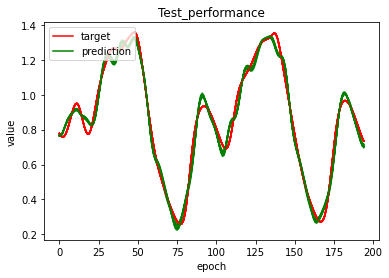

In [215]:
histories2 = []
metrics2 = []

callbacks = []
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, min_delta=0.000001, patience=20, restore_best_weights=True)
callbacks.append(early_stop)

for i in range(10):
    model = create_model (4, 15, 0.1)
    history2 = model.fit(
                X_train, 
                y_train, 
                epochs = 5000, 
                verbose = 0,
                callbacks = callbacks, 
                validation_data = (X_valid, y_valid)
            )
    accuracy2 = model.evaluate(
                x = X_valid,
                y = y_valid,
                verbose=1,
                callbacks=None,
            )
    histories2.append(history2)
    metrics2.append(accuracy2)
    error = model.evaluate(X_test, y_test, verbose=1)
    print('MSE: %.6f' % (error))
    plt.plot(y_test, 'r')
    plt.plot(model.predict(X_test), 'g')
    plt.title('Test_performance')
    plt.ylabel('value')
    plt.xlabel('epoch')
    plt.legend(['target', 'prediction'], loc='upper left')
    plt.show

In [224]:
d = [0.001536, 0.001622, 0.001630, 0.001435, 0.001865, 0.001574, 0.001503, 0.001408, 0.001483, 0.001485]

mean_d = sum(d)/len(d)

print(mean_d)

def variance(data):
    # Number of observations
    n = len(data)
    # Mean of the data
    mean = sum(data) / n
    # Square deviations
    deviations = [(x - mean) ** 2 for x in data]
    # Variance
    variance = sum(deviations) / n
    return variance

print(variance(d))

0.0015541
1.5572489999999993e-08


In [231]:
def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

In [232]:
c_i = mean_confidence_interval(d, 0.95)
print(c_i)

(0.0015541, 0.0014600019660055278, 0.0016481980339944724)


5000


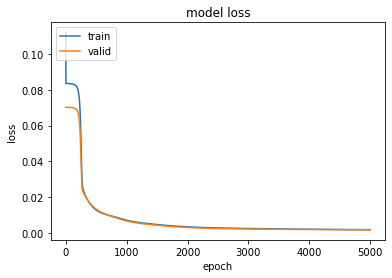

0.001558232819661498
5000


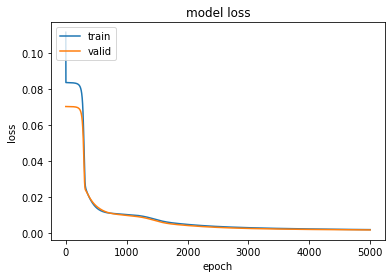

0.0016013543354347348
5000


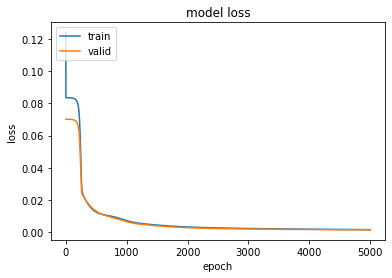

0.001519849756732583
5000


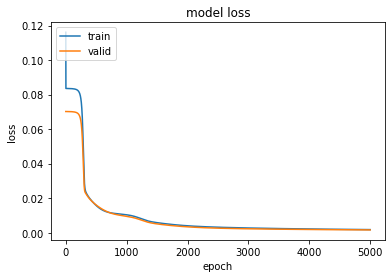

0.0015906622866168618
5000


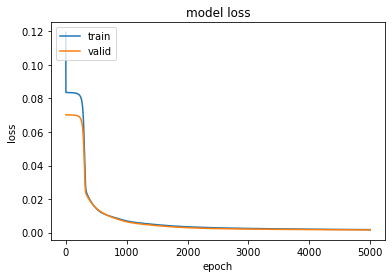

0.0016030321130529046
5000


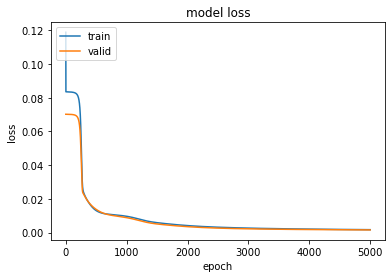

0.0015495873522013426
5000


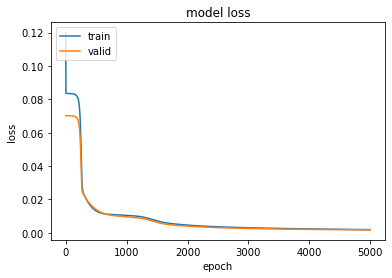

0.001708701835013926
5000


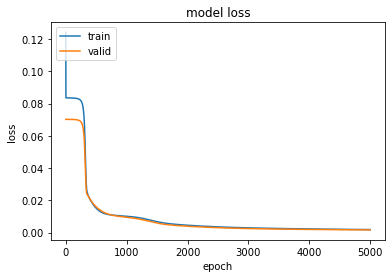

0.0016869880491867661
5000


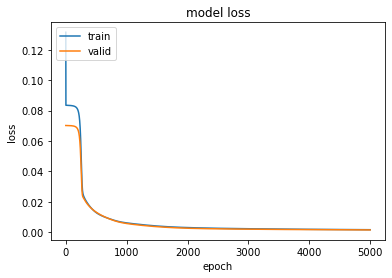

0.001506259199231863
5000


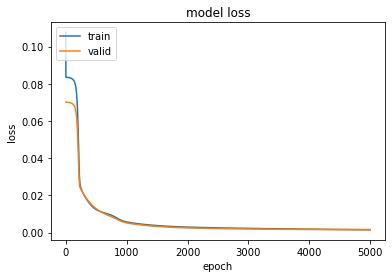

0.0014109007315710187


In [118]:
for i in range(10):
    print(len(histories2[i].history['loss']))
    plt.plot(histories2[i].history['loss'])
    plt.plot(histories2[i].history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'valid'], loc='upper left')
    plt.show()
    print(metrics2[i])

In [205]:
print(statistics.variance(metrics))

NameError: name 'statistics' is not defined

## Noisy evaluation

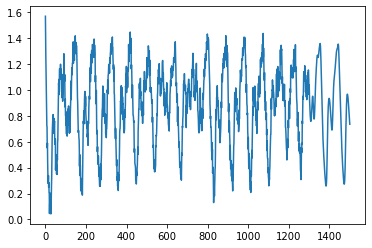

1501

In [119]:
# Add noise

noise1 = np.random.normal(0,0.05,1301)
#noise2 = np.random.normal(0,0.3,1301)

data = data_generation()

data_noise = data[:1301] + noise1
data_noise = [*data_noise, *data[1301:]]
plt.plot(data_noise)
plt.show()

len(data)

In [120]:
X_train, y_train, X_valid, y_valid, X_test, y_test = dataset_creation(data_noise)

print(len(X_train))
print(len(y_train))
print(len(X_valid))
print(len(y_valid))
print(len(X_test))
print(len(y_test))

701
701
300
300
195
195


In [136]:
def create_model_2(nh1, nh2, learning_rate, weight_decay_param):
    
    model = keras.models.Sequential()

    # Add first layer
    model.add(
        keras.layers.Dense(
        units = nh1,
        input_shape = (5,),
        kernel_initializer = 'normal',
        #bias_initializer = 'zeros',
        kernel_regularizer = keras.regularizers.l2(weight_decay_param),
        bias_regularizer = keras.regularizers.l2(weight_decay_param),
        activation = 'sigmoid'))
    
    #Add second layer
    model.add(
    keras.layers.Dense(
        units = nh2,
        kernel_initializer = 'normal',
        #bias_initializer = 'zeros',
        kernel_regularizer = keras.regularizers.l2(weight_decay_param),
        bias_regularizer = keras.regularizers.l2(weight_decay_param),
        activation = 'sigmoid')
    )
    
    # add output layer
    model.add(
    keras.layers.Dense(
        units = 1,
        kernel_initializer = 'normal',
        #bias_initializer = 'zeros',
        kernel_regularizer = keras.regularizers.l2(weight_decay_param),
        bias_regularizer = keras.regularizers.l2(weight_decay_param),
        activation = 'linear')
    )

    print(model.summary())
    sgd = keras.optimizers.SGD(lr=learning_rate)
    model.compile(optimizer=sgd, loss='mse')
    
    return model

In [122]:
nh1 = 4
nh2 = [2, 15]
decay_params = [1e-1, 1e-2, 1e-5]
lr = 0.1

In [127]:
histories3 = []
metrics3 = []

for i in nh2:
    for y in decay_params:
        model = create_model_2 (nh1, i, lr, y)
        history = model.fit(
            X_train, 
            y_train, 
            #batch_size = 32, 
            epochs = 5000, 
            verbose = 0,
            validation_data = (X_valid, y_valid)
        )
        metrics = model.evaluate(
            x=X_valid,
            y=y_valid,
            verbose=1,
            callbacks=None,
        )
        histories3.append(history)
        metrics3.append(metrics)
        print(model.weights)
        print('The current model uses the following params: nh1 = %d, nh2 = %d, lambda = %f, learning rate = %f' %(nh1, i, y, lr))

Model: "sequential_88"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_262 (Dense)            (None, 4)                 24        
_________________________________________________________________
dense_263 (Dense)            (None, 2)                 10        
_________________________________________________________________
dense_264 (Dense)            (None, 1)                 3         
Total params: 37
Trainable params: 37
Non-trainable params: 0
_________________________________________________________________
10/10 [==============================] - 0s 3ms/step - loss: 0.1224
[<tf.Variable 'dense_262/kernel:0' shape=(5, 4) dtype=float32, numpy=
array([[0.00014471, 0.00014471, 0.00014471, 0.00014471],
       [0.00027275, 0.00027275, 0.00027275, 0.00027275],
       [0.00043776, 0.00043776, 0.00043776, 0.00043776],
       [0.00064308, 0.00064308, 0.00064308, 0.00064308],
       [0.00084797, 0

10/10 [==============================] - 0s 872us/step - loss: 0.0747
[<tf.Variable 'dense_274/kernel:0' shape=(5, 4) dtype=float32, numpy=
array([[-9.26958091e-05, -9.26961438e-05, -9.26961438e-05,
        -9.26961438e-05],
       [-5.54959443e-05, -5.54960097e-05, -5.54960025e-05,
        -5.54960097e-05],
       [-6.23759252e-06, -6.23755886e-06, -6.23755886e-06,
        -6.23755886e-06],
       [ 5.63140347e-05,  5.63144167e-05,  5.63144167e-05,
         5.63144167e-05],
       [ 1.19794517e-04,  1.19794786e-04,  1.19794786e-04,
         1.19794786e-04]], dtype=float32)>, <tf.Variable 'dense_274/bias:0' shape=(4,) dtype=float32, numpy=
array([-3.4800723e-05, -3.4800680e-05, -3.4800680e-05, -3.4800680e-05],
      dtype=float32)>, <tf.Variable 'dense_275/kernel:0' shape=(4, 15) dtype=float32, numpy=
array([[0.00018017, 0.00018017, 0.00018017, 0.00018017, 0.00018017,
        0.00018017, 0.00018017, 0.00018017, 0.00018017, 0.00018017,
        0.00018017, 0.00018017, 0.00018017, 0.00018

5000


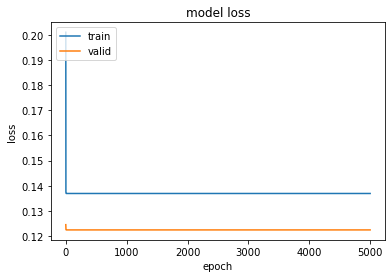

0.12236408144235611
5000


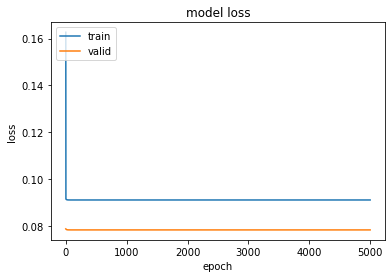

0.07833950221538544
5000


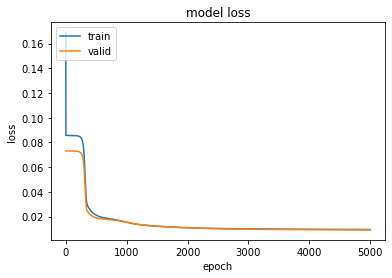

0.009218267165124416
5000


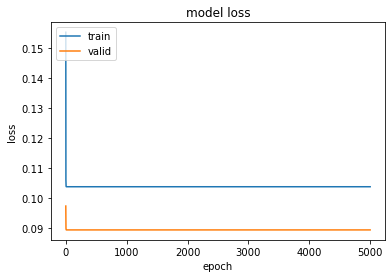

0.08940770477056503
5000


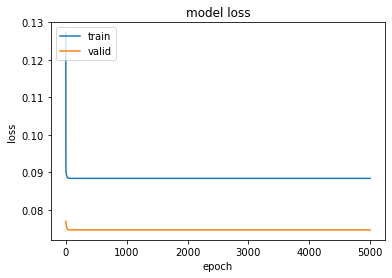

0.07468841224908829
5000


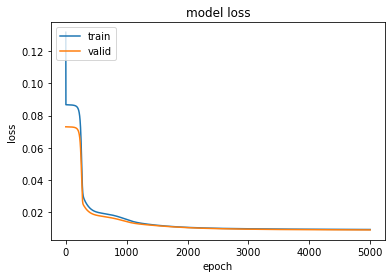

0.009213092736899853


In [144]:
for i in range(6):
    print(len(histories3[i].history['loss']))
    plt.plot(histories3[i].history['loss'])
    plt.plot(histories3[i].history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'valid'], loc='upper left')
    plt.show()
    print(metrics3[i])

## Second noisy evaluation

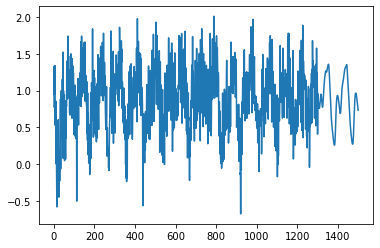

1501

In [129]:
# Add noise

#noise1 = np.random.normal(0,0.05,1301)
noise2 = np.random.normal(0,0.3,1301)

data = data_generation()

data_noise = data[:1301] + noise2
data_noise = [*data_noise, *data[1301:]]
plt.plot(data_noise)
plt.show()

len(data)

In [130]:
X_train, y_train, X_valid, y_valid, X_test, y_test = dataset_creation(data_noise)

print(len(X_train))
print(len(y_train))
print(len(X_valid))
print(len(y_valid))
print(len(X_test))
print(len(y_test))

701
701
300
300
195
195


In [131]:
histories4 = []
metrics4 = []

for i in nh2:
    for y in decay_params:
        model = create_model_2 (nh1, i, lr, y)
        history = model.fit(
            X_train, 
            y_train, 
            #batch_size = 32, 
            epochs = 5000, 
            verbose = 0,
            validation_data = (X_valid, y_valid)
        )
        metrics = model.evaluate(
            x=X_valid,
            y=y_valid,
            verbose=1,
            callbacks=None,
        )
        histories4.append(history)
        metrics4.append(metrics)
        print(model.weights)
        print('The current model uses the following params: nh1 = %d, nh2 = %d, lambda = %f, learning rate = %f' %(nh1, i, y, lr))

Model: "sequential_94"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_280 (Dense)            (None, 4)                 24        
_________________________________________________________________
dense_281 (Dense)            (None, 2)                 10        
_________________________________________________________________
dense_282 (Dense)            (None, 1)                 3         
Total params: 37
Trainable params: 37
Non-trainable params: 0
_________________________________________________________________
10/10 [==============================] - 0s 2ms/step - loss: 0.1957
[<tf.Variable 'dense_280/kernel:0' shape=(5, 4) dtype=float32, numpy=
array([[0.00013398, 0.00013398, 0.00013398, 0.00013398],
       [0.00030506, 0.00030506, 0.00030506, 0.00030506],
       [0.00049417, 0.00049417, 0.00049417, 0.00049417],
       [0.00072383, 0.00072383, 0.00072383, 0.00072383],
       [0.00093951, 0

10/10 [==============================] - 0s 2ms/step - loss: 0.1583
[<tf.Variable 'dense_292/kernel:0' shape=(5, 4) dtype=float32, numpy=
array([[ 0.00057194,  0.00057194,  0.00057194,  0.00057194],
       [ 0.00010157,  0.00010157,  0.00010157,  0.00010157],
       [-0.00043374, -0.00043374, -0.00043374, -0.00043374],
       [-0.00104599, -0.00104599, -0.00104599, -0.00104599],
       [-0.00161184, -0.00161184, -0.00161184, -0.00161184]],
      dtype=float32)>, <tf.Variable 'dense_292/bias:0' shape=(4,) dtype=float32, numpy=
array([-4.1100920e-05, -4.1100964e-05, -4.1101048e-05, -4.1100953e-05],
      dtype=float32)>, <tf.Variable 'dense_293/kernel:0' shape=(4, 15) dtype=float32, numpy=
array([[-0.00248075, -0.00248075, -0.00248075, -0.00248076, -0.00248075,
        -0.00248075, -0.00248075, -0.00248074, -0.00248075, -0.00248075,
        -0.00248075, -0.00248075, -0.00248075, -0.00248075, -0.00248075],
       [-0.00248075, -0.00248075, -0.00248075, -0.00248076, -0.00248075,
        -0

5000


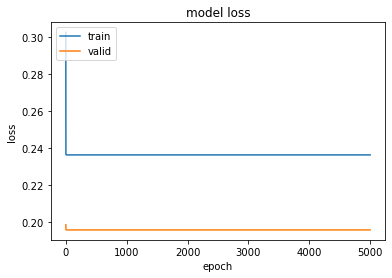

0.19573760032653809
5000


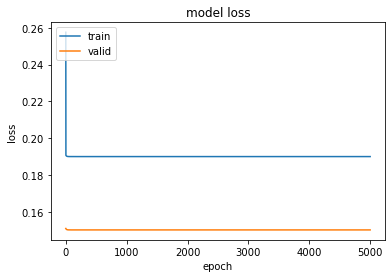

0.1502951979637146
5000


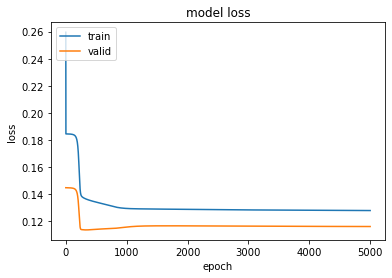

0.11628127098083496
5000


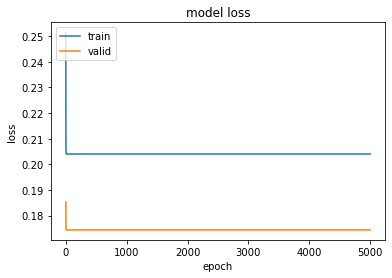

0.17439959943294525
5000


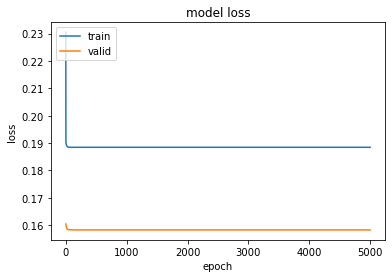

0.15825717151165009
5000


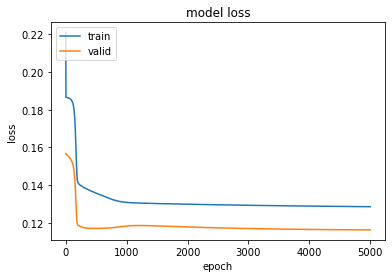

0.11630772799253464


In [134]:
for i in range(6):
    print(len(histories4[i].history['loss']))
    plt.plot(histories4[i].history['loss'])
    plt.plot(histories4[i].history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'valid'], loc='upper left')
    plt.show()
    print(metrics4[i])

## Evaluate noisy model

In [145]:
def squaredsum_weights(weights):
  sum = 0
  for i in weights:
    sum += tf.reduce_sum(tf.square(i))
  return float(sum)

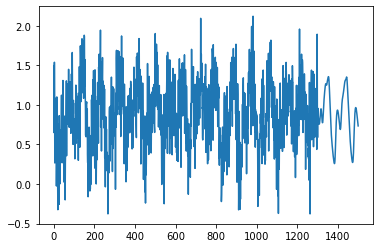

1501

In [195]:
# Add noise

#noise1 = np.random.normal(0,0.05,1301)
noise2 = np.random.normal(0,0.3,1301)

data = data_generation()

data_noise = data[:1301] + noise2
data_noise = [*data_noise, *data[1301:]]
plt.plot(data_noise)
plt.show()

len(data)

In [196]:
X, y, X_test, y_test = create_dataset(data_noise)
sep = math.ceil(len(X)*.7)
X_train = X[:sep]
X_valid = X[sep+1:]
y_train = y[:sep]
y_valid = y[sep+1:]

print(len(X_train))
print(len(y_train))
print(len(X_valid))
print(len(y_valid))
print(len(X_test))
print(len(y_test))

701
701
299
299
195
195


In [197]:
def create_model3(input_shape, number_of_outputs, hidden_layers_list, regularization):
  model = tf.keras.models.Sequential()
  l2 = tf.keras.regularizers.l2(regularization)

  model.add(tf.keras.layers.Dense(hidden_layers_list[0], activation='sigmoid', input_shape=input_shape, kernel_regularizer=l2, bias_regularizer=l2))
  for nh in hidden_layers_list[1:]:
    model.add(tf.keras.layers.Dense(nh, activation='sigmoid', kernel_regularizer=l2, bias_regularizer=l2))

  model.add(tf.keras.layers.Dense(number_of_outputs, activation='linear', kernel_regularizer=l2, bias_regularizer=l2))

  return model

In [198]:
def evaluate_noisy_model(nh2s, regs):
  b_error = np.inf
  values = []
  nh1 = 4
  lr = 0.1
  
  for nh2 in nh2s:
    for reg in regs:
  
      model = create_model3((5,), 1, [nh1, nh2], reg)       
      opt = tf.keras.optimizers.SGD(learning_rate= lr)
      model.compile(optimizer= opt, loss='mse')
      history = model.fit(X_train, y_train, validation_data=(X_valid,y_valid), epochs=5000, verbose= False)
      error = model.evaluate(X_valid, y_valid, verbose=0)
      #print('configuration: nh1= %d, nh2= %d, reg= %f, lr= %f, MSE: %.6f' % (nh1, nh2, reg, lr, error))
      print('the squared sum of the weights is: %f' %(squaredsum_weights(model.weights)))
      plt.plot(history.history['loss'])
      plt.plot(history.history['val_loss'])
      plt.title('model loss')
      plt.ylabel('loss')
      plt.xlabel('epoch')
      plt.legend(['train', 'valid'], loc='upper right')
      plt.title('nh1= %d, nh2= %d, reg= %f MSE= %f' % (nh1, nh2, reg, error),loc = 'center')
      plt.show()

      values.append((history, nh2, reg, error))
      if error < b_error:
            best_conf = (nh1, nh2, reg, lr, history)
            best_model = model
            b_error = error
           
  return values, best_model, best_conf

the squared sum of the weights is: 0.487612


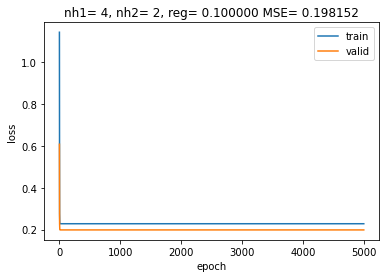

the squared sum of the weights is: 0.544518


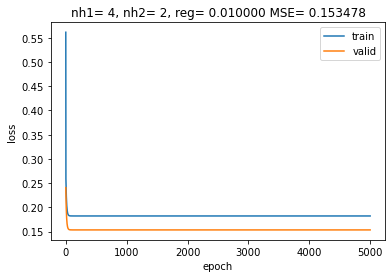

the squared sum of the weights is: 40.204788


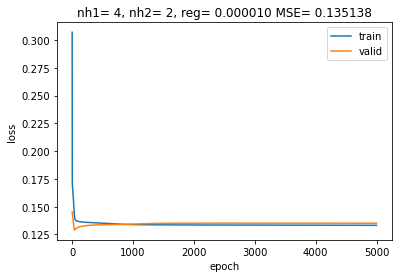

the squared sum of the weights is: 0.168782


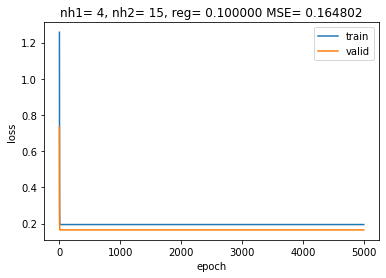

the squared sum of the weights is: 0.177437


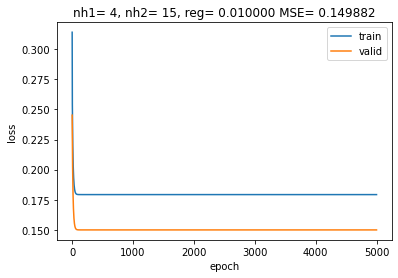

the squared sum of the weights is: 68.633583


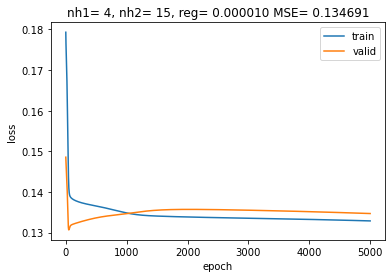

In [199]:
regs = [1e-1, 1e-2, 1e-5]
nh2s= [2, 15]

values, b_noisy_model, b_noisy_conf = evaluate_noisy_model(nh2s, regs)

In [159]:
_,_,_,_,history  = b_noisy_conf
history.history['loss']

[0.2912439703941345,
 0.18690867722034454,
 0.18659302592277527,
 0.1862623244524002,
 0.1859128177165985,
 0.18554304540157318,
 0.18515142798423767,
 0.18473628163337708,
 0.18429599702358246,
 0.183828666806221,
 0.1833323985338211,
 0.18280528485774994,
 0.1822451949119568,
 0.18165011703968048,
 0.18101780116558075,
 0.18034617602825165,
 0.1796330213546753,
 0.17887629568576813,
 0.17807385325431824,
 0.17722398042678833,
 0.17632493376731873,
 0.1753755360841751,
 0.17437472939491272,
 0.17332230508327484,
 0.17221850156784058,
 0.17106445133686066,
 0.16986222565174103,
 0.16861505806446075,
 0.16732726991176605,
 0.16600452363491058,
 0.164653941988945,
 0.16328367590904236,
 0.16190339624881744,
 0.16052354872226715,
 0.15915547311306,
 0.15781070291996002,
 0.15650077164173126,
 0.15523669123649597,
 0.15402840077877045,
 0.15288440883159637,
 0.15181145071983337,
 0.15081430971622467,
 0.14989562332630157,
 0.149056077003479,
 0.14829450845718384,
 0.1476079821586609,
 0.14

(4, 15, 1e-05, 0.1, <tensorflow.python.keras.callbacks.History object at 0x000001DD1EAE9EC8>)
5000


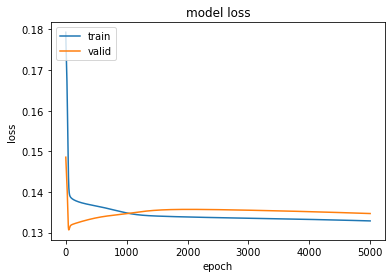

In [200]:
print(b_noisy_conf)
_,_,_,_,history  = b_noisy_conf
print(len(history.history['loss']))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'valid'], loc='upper left')
plt.show()

10/10 [==============================] - 0s 600us/step - loss: 0.1347
MSE: 0.134691


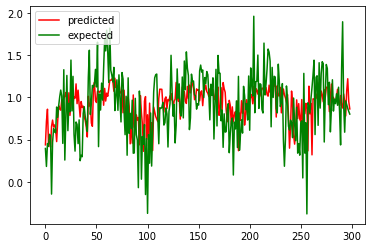

In [206]:
error = b_noisy_model.evaluate(X_valid, y_valid, verbose=1)
print('MSE: %.6f' % (error))

y_pred = b_noisy_model.predict(X_valid)
plt.plot(y_pred, 'r')
plt.plot(y_valid, 'g')
plt.legend(['predicted', 'expected'], loc='upper left')
plt.show()

7/7 [==============================] - 0s 714us/step - loss: 0.0305
MSE: 0.030477


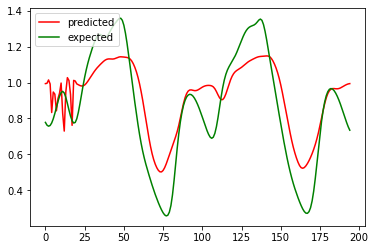

In [207]:
error = b_noisy_model.evaluate(X_test, y_test, verbose=1)
print('MSE: %.6f' % (error))

y_pred = b_noisy_model.predict(X_test)
plt.plot(y_pred, 'r')
plt.plot(y_test, 'g')
plt.legend(['predicted', 'expected'], loc='upper left')
plt.show()

In [162]:
def create_dataset(data):
    X_train = []
    y_train = []
    X_test = []
    y_test = []
    for i in range(300, len(data)-5):
        x20 = data[i-20]
        x15 = data[i-15]
        x10 = data[i-10]
        x5 = data[i-5]
        x0 = data[i]
        if i<= 1300:
          X_train.append([x20, x15, x10, x5, x0])
          y_train.append(data[i+5])
        else:
          X_test.append([x20, x15, x10, x5, x0])
          y_test.append(data[i+5])
    return X_train, y_train, X_test, y_test

In [165]:
X, y, X_test, y_test = create_dataset(data_noise)
sep = math.ceil(len(X)*.7)
X_train = X[:sep]
X_valid = X[sep+1:]
y_train = y[:sep]
y_valid = y[sep+1:]

print(len(X_train))
print(len(y_train))
print(len(X_valid))
print(len(y_valid))
print(len(X_test))
print(len(y_test))

701
701
299
299
195
195


the squared sum of the weights is: 0.437920


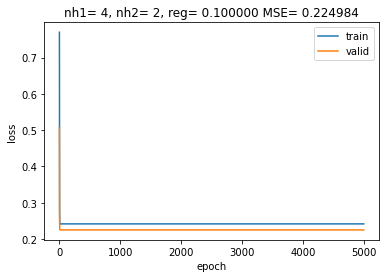

the squared sum of the weights is: 0.491535


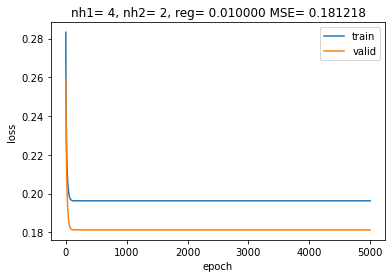

the squared sum of the weights is: 97.310364


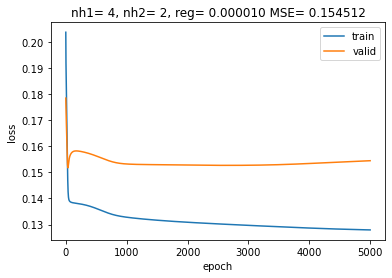

the squared sum of the weights is: 0.141671


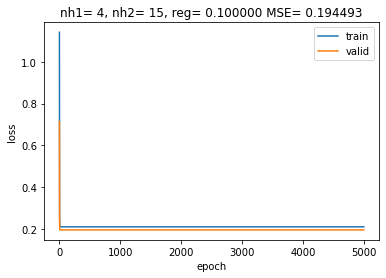

the squared sum of the weights is: 0.148550


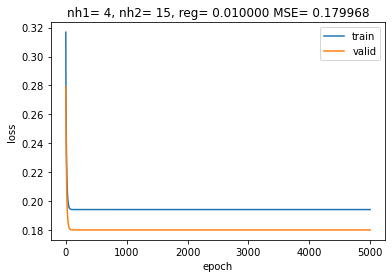

the squared sum of the weights is: 70.537926


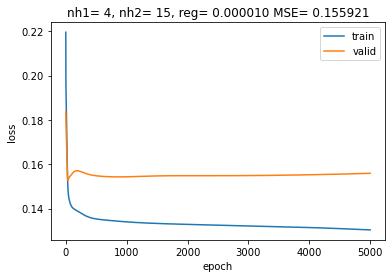

In [166]:
regs = [1e-1, 1e-2, 1e-5]
nh2s= [2, 15]

values, b_noisy_model, b_noisy_conf = evaluate_noisy_model(nh2s, regs)

## Low noise

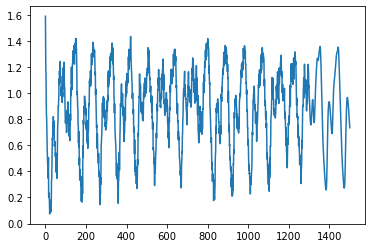

1501

In [235]:
# Add noise

noise1 = np.random.normal(0,0.05,1301)
#noise2 = np.random.normal(0,0.3,1301)

data2 = data_generation()

data_noise2 = data2[:1301] + noise1
data_noise2 = [*data_noise2, *data2[1301:]]
plt.plot(data_noise2)
plt.show()

len(data)

In [236]:
X, y, X_test, y_test = create_dataset(data_noise2)
sep = math.ceil(len(X)*.7)
X_train = X[:sep]
X_valid = X[sep+1:]
y_train = y[:sep]
y_valid = y[sep+1:]

print(len(X_train))
print(len(y_train))
print(len(X_valid))
print(len(y_valid))
print(len(X_test))
print(len(y_test))

701
701
299
299
195
195


the squared sum of the weights is: 0.472008


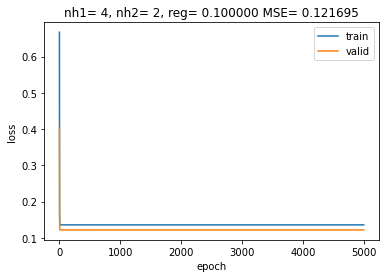

the squared sum of the weights is: 0.527761


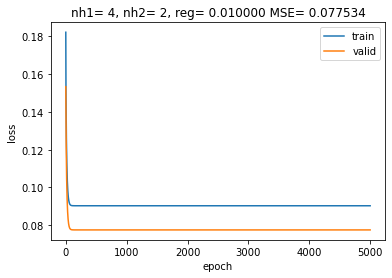

the squared sum of the weights is: 58.835381


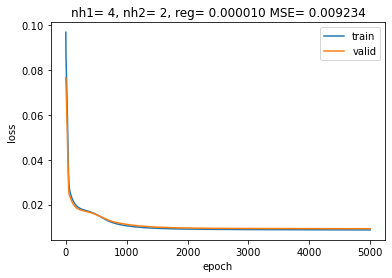

the squared sum of the weights is: 0.158514


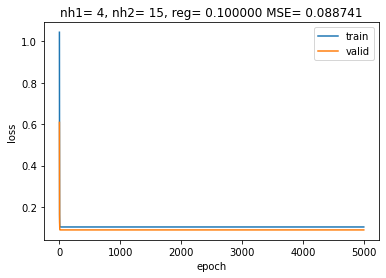

the squared sum of the weights is: 0.165110


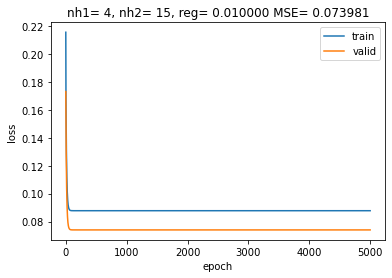

the squared sum of the weights is: 63.161167


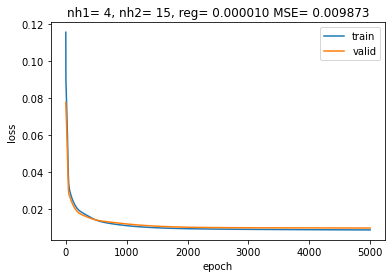

In [237]:
regs = [1e-1, 1e-2, 1e-5]
nh2s= [2, 15]

values2, b_noisy_model2, b_noisy_conf2 = evaluate_noisy_model(nh2s, regs)

(4, 2, 1e-05, 0.1, <tensorflow.python.keras.callbacks.History object at 0x000001DD23C0EA08>)
5000


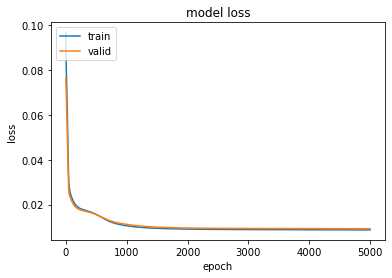

In [238]:
print(b_noisy_conf2)
_,_,_,_,history  = b_noisy_conf2
print(len(history.history['loss']))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'valid'], loc='upper left')
plt.show()

10/10 [==============================] - 0s 800us/step - loss: 0.0092
MSE: 0.009234


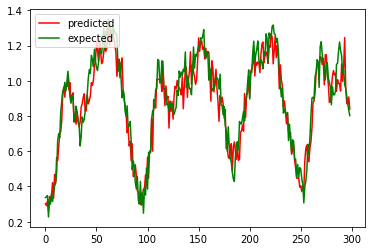

In [239]:
error = b_noisy_model2.evaluate(X_valid, y_valid, verbose=1)
print('MSE: %.6f' % (error))

y_pred = b_noisy_model2.predict(X_valid)
plt.plot(y_pred, 'r')
plt.plot(y_valid, 'g')
plt.legend(['predicted', 'expected'], loc='upper left')
plt.show()

7/7 [==============================] - 0s 1ms/step - loss: 0.0037
MSE: 0.003712


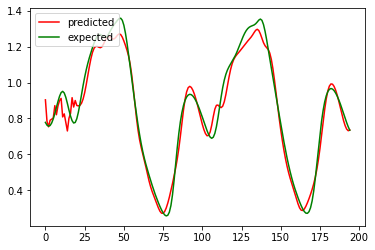

In [240]:
error = b_noisy_model2.evaluate(X_test, y_test, verbose=1)
print('MSE: %.6f' % (error))

y_pred = b_noisy_model2.predict(X_test)
plt.plot(y_pred, 'r')
plt.plot(y_test, 'g')
plt.legend(['predicted', 'expected'], loc='upper left')
plt.show()